In [1]:
# Source:
# http://blog.nextgenetics.net/?e=102
from IPython.display import HTML

HTML('''<script>
code_show=true; 
function code_toggle() {
 if (code_show){
 $('div.input').hide();
 } else {
 $('div.input').show();
 }
 code_show = !code_show
} 
$( document ).ready(code_toggle);
</script>
The raw code for this IPython notebook is by default hidden for easier reading.
To toggle on/off the raw code, click <a href="javascript:code_toggle()">here</a>.''')

In [2]:
conda install -c conda-forge rise

Solving environment: ...working... done

## Package Plan ##

  environment location: C:\Users\t4tri\anaconda3

  added / updated specs:
    - rise


The following NEW packages will be INSTALLED:

  python_abi         conda-forge/win-64::python_abi-3.7-1_cp37m

The following packages will be UPDATED:

  conda                       pkgs/main::conda-4.8.3-py37_0 --> conda-forge::conda-4.8.3-py37hc8dfbb8_1


Preparing transaction: ...working... done
Verifying transaction: ...working... done
Executing transaction: ...working... done

Note: you may need to restart the kernel to use updated packages.


In [3]:
from notebook.services.config import ConfigManager
cm = ConfigManager()

In [4]:
conda update -n base -c defaults conda

Solving environment: ...working... done

## Package Plan ##

  environment location: C:\Users\t4tri\anaconda3

  added / updated specs:
    - conda


The following packages will be REMOVED:

  python_abi-3.7-1_cp37m

The following packages will be SUPERSEDED by a higher-priority channel:

  conda              conda-forge::conda-4.8.3-py37hc8dfbb8~ --> pkgs/main::conda-4.8.3-py37_0


Preparing transaction: ...working... done
Verifying transaction: ...working... done
Executing transaction: ...working... done

Note: you may need to restart the kernel to use updated packages.


In [5]:
cm.update('livereveal', {
              'width': 1000,
              'height': 600,
              'scroll': True,
              'theme': "sky",
})

{'width': 1000, 'height': 600, 'scroll': True, 'theme': 'sky'}

In [6]:
import warnings

In [7]:
warnings.simplefilter('ignore')

# Introduction

In the wake of the global COVID-19 pandemic, Place IQ, a commercial location intelligence and space mapping service, has made data on mass, de-identified Smartphone movement public. Victor Couture, Jonathan Dingel, Allison Green, Jessie Handbury, Kevin Williams, Hayden Parsley, and Serena Xu have created a dataset of device exposure indices for each US State and the District of Columbia based on the data provided by Place IQ. Each device exposure index or DEX represents the average number of cellular devices visited in the same commercial spaces as any given device per state based on cell phone tower pings. The resulting dataset includes 4,539 rows, one row for each state for each day from January 20, 2020 through April 9, 2020 and 53 features, including DEX figures separated by income quartile, education quartile, and race. A link to their work can be found below.

https://github.com/COVIDExposureIndices/COVIDExposureIndices

From their resulting dataset, I focused on the DEX figures that were adjusted for the number of Smartphone users that were sheltering in place. I then segmented all 50 states and the District of Columbia based on Smartphone movement from January 20th to April 9th, as well as, before and after the implementation of stay at home advisories or orders.
These segments are helpful for policy makers and epidemiologist, as they identify patterns in responses to stay at home advisories along. The resulting clusters also identify patterns in exposure and movement, which provide insights into effective implementation of policies beyond the current COVID-19 crisis.



# COVID-19 and Unsupervised Clustering of US States:
## Analysis and Modeling of Aggregate Smartphone Data


## By: Trisha Thompson

# The Data

In [8]:
from IPython.display import Image

![](PlaceIQ_logo.PNG)

Victor Couture, Jonathan Dingel, Allison Green, Jessie Handbury, Kevin Williams, Hayden Parsley, and Serena Xu 
https://github.com/COVIDExposureIndices/COVIDExposureIndices

# Device Exposure Index

What is the Device Exposure Index (DEX)?

Adjusted DEX

# What Can Be Learned from these Clusters?

Potential Patterns in before and after state level shelter-in-place orders

Patterns in Aggregate Movements across states

#Import Data and Libraries

In [9]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.axes as ax
from scipy import stats
import math
from sklearn.preprocessing import StandardScaler
from scipy.spatial.distance import cdist
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn import  datasets, metrics
from sklearn.cluster import DBSCAN
from sklearn.manifold import TSNE

In [10]:
url = 'https://raw.githubusercontent.com/COVIDExposureIndices/COVIDExposureIndices/master/dex_data/state_dex.csv'
df_state = pd.read_csv(url)

In [11]:
df_state.head()

,state,date,dex,num_devices,dex_a,num_devices_a,dex_income_1,num_devices_income_1,dex_income_1_a,num_devices_income_1_a,...,dex_race_black_a,num_devices_race_black_a,dex_race_hispanic,num_devices_race_hispanic,dex_race_hispanic_a,num_devices_race_hispanic_a,dex_race_white,num_devices_race_white,dex_race_white_a,num_devices_race_white_a
0,AL,2020-01-20,169.3337,499012,157.2836,537243,139.8325,133839,131.7052,142098,...,150.1898,90000.0,193.9125,15872.0,182.5214,16862.0,187.8756,299149,177.2222,317132
1,AL,2020-01-21,126.4763,510377,120.1515,537243,110.7451,136391,106.2973,142098,...,119.7155,90000.0,142.8602,16203.0,137.2761,16862.0,135.2098,304971,130.0249,317132
2,AL,2020-01-22,128.5769,512102,122.5600,537243,114.1824,136723,109.8634,142098,...,121.6349,90000.0,144.8927,16266.0,139.7645,16862.0,138.5920,306249,133.8359,317132
3,AL,2020-01-23,133.4260,518147,128.6834,537243,115.6048,138312,112.5246,142098,...,128.8926,90000.0,151.5280,16390.0,147.2833,16862.0,143.3468,308191,139.3055,317132
4,AL,2020-01-24,201.3351,515504,193.1883,537243,178.2221,138167,173.2918,142098,...,190.5587,90000.0,221.9743,16422.0,216.1740,16862.0,221.1271,308019,214.7731,317132


In [12]:
	df_state.describe()

,dex,num_devices,dex_a,num_devices_a,dex_income_1,num_devices_income_1,dex_income_1_a,num_devices_income_1_a,dex_income_2,num_devices_income_2,...,dex_race_black_a,num_devices_race_black_a,dex_race_hispanic,num_devices_race_hispanic,dex_race_hispanic_a,num_devices_race_hispanic_a,dex_race_white,num_devices_race_white,dex_race_white_a,num_devices_race_white_a
count,4896.000000,4.896000e+03,4896.000000,4.896000e+03,4896.000000,4896.000000,4896.000000,4896.000000,4896.000000,4896.000000,...,3936.000000,3936.000000,4704.000000,4704.000000,4704.000000,4704.000000,4896.000000,4.896000e+03,4896.000000,4896.000000
mean,123.501843,4.196904e+05,114.816150,4.654664e+05,112.848555,66649.402982,103.529092,74928.411765,118.138684,82220.589052,...,133.623389,47659.390244,141.494467,48991.772109,131.462358,54975.530612,131.384977,2.256834e+05,122.707301,246907.156863
std,103.269917,4.436327e+05,100.594043,4.918087e+05,88.286247,75150.923155,85.861589,83769.382831,98.198136,86529.717717,...,109.893589,51355.540303,108.653250,108730.505076,106.826343,121359.772630,113.469574,2.021601e+05,110.319577,220263.056034
min,6.599700,1.391600e+04,4.463800,3.160400e+04,8.575700,605.000000,6.411800,855.000000,6.872400,1326.000000,...,11.929700,1704.000000,17.809100,927.000000,11.159700,1592.000000,7.239500,2.645000e+03,5.153200,8692.000000
25%,53.706125,1.077462e+05,45.369275,1.212710e+05,53.088500,14501.000000,44.024650,15723.000000,54.227050,19308.250000,...,53.957550,10300.000000,64.462450,8269.750000,54.061550,9535.000000,55.034300,6.024200e+04,47.164150,66410.000000
50%,98.955800,3.208640e+05,91.648150,3.753750e+05,96.020550,36750.000000,87.880100,41637.000000,94.467600,59177.500000,...,114.312100,26686.000000,116.110550,18931.500000,107.930200,20829.000000,105.214550,1.810110e+05,98.406800,201510.000000
75%,156.508300,5.268942e+05,149.006750,5.683200e+05,140.732525,91987.250000,133.554075,106028.000000,147.573125,117575.000000,...,172.111875,70235.000000,178.575950,33892.750000,168.986250,36603.000000,167.576025,3.147438e+05,160.769675,357853.000000
max,1164.005600,2.777436e+06,1155.623300,2.484430e+06,900.953700,431356.000000,863.346500,397114.000000,1021.641300,509006.000000,...,1254.008500,199340.000000,1135.371300,728481.000000,1143.667600,661497.000000,1315.245600,1.134694e+06,1331.319000,999599.000000


In [13]:
#convert date to datetime object
df_state['date'] = pd.to_datetime(df_state['date'])


In [14]:
df_state['date'].min()

Timestamp('2020-01-20 00:00:00')

In [15]:
df_state['date'].max()

Timestamp('2020-04-24 00:00:00')

# The Dataset

4,845 rows of data

50 states plus the District of Columbia

January 20th 2020 to April 9th 2020

52 features on the dex, adjusted dex, number and adjusted number of devices

In [16]:
df_state.head(3)

,state,date,dex,num_devices,dex_a,num_devices_a,dex_income_1,num_devices_income_1,dex_income_1_a,num_devices_income_1_a,...,dex_race_black_a,num_devices_race_black_a,dex_race_hispanic,num_devices_race_hispanic,dex_race_hispanic_a,num_devices_race_hispanic_a,dex_race_white,num_devices_race_white,dex_race_white_a,num_devices_race_white_a
0,AL,2020-01-20,169.3337,499012,157.2836,537243,139.8325,133839,131.7052,142098,...,150.1898,90000.0,193.9125,15872.0,182.5214,16862.0,187.8756,299149,177.2222,317132
1,AL,2020-01-21,126.4763,510377,120.1515,537243,110.7451,136391,106.2973,142098,...,119.7155,90000.0,142.8602,16203.0,137.2761,16862.0,135.2098,304971,130.0249,317132
2,AL,2020-01-22,128.5769,512102,122.5600,537243,114.1824,136723,109.8634,142098,...,121.6349,90000.0,144.8927,16266.0,139.7645,16862.0,138.5920,306249,133.8359,317132


In [17]:
df_state.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4896 entries, 0 to 4895
Data columns (total 54 columns):
 #   Column                       Non-Null Count  Dtype         
---  ------                       --------------  -----         
 0   state                        4896 non-null   object        
 1   date                         4896 non-null   datetime64[ns]
 2   dex                          4896 non-null   float64       
 3   num_devices                  4896 non-null   int64         
 4   dex_a                        4896 non-null   float64       
 5   num_devices_a                4896 non-null   int64         
 6   dex_income_1                 4896 non-null   float64       
 7   num_devices_income_1         4896 non-null   int64         
 8   dex_income_1_a               4896 non-null   float64       
 9   num_devices_income_1_a       4896 non-null   int64         
 10  dex_income_2                 4896 non-null   float64       
 11  num_devices_income_2         4896 non-null 

#Clean Data

##Address Nulls

In [18]:
df_state.isnull().sum().sum()

7680

There are nulls in all four of the following possible categories for people of color (Asian, Hispanic, and African American):
-  num_devices
-  num_devices_a
-  dex
-  dex_a

I interpolated the missing data.

In [19]:
df_state = df_state.interpolate(method ='linear', limit_direction ='forward')

In [20]:
df_state.isnull().sum().sum()

0

##Address Outliers

In [21]:
column_names = list(df_state.columns)

In [22]:
column_names.remove('date')

In [23]:
column_names.remove('state')

In [24]:
column_names

['dex',
 'num_devices',
 'dex_a',
 'num_devices_a',
 'dex_income_1',
 'num_devices_income_1',
 'dex_income_1_a',
 'num_devices_income_1_a',
 'dex_income_2',
 'num_devices_income_2',
 'dex_income_2_a',
 'num_devices_income_2_a',
 'dex_income_3',
 'num_devices_income_3',
 'dex_income_3_a',
 'num_devices_income_3_a',
 'dex_income_4',
 'num_devices_income_4',
 'dex_income_4_a',
 'num_devices_income_4_a',
 'dex_education_1',
 'num_devices_education_1',
 'dex_education_1_a',
 'num_devices_education_1_a',
 'dex_education_2',
 'num_devices_education_2',
 'dex_education_2_a',
 'num_devices_education_2_a',
 'dex_education_3',
 'num_devices_education_3',
 'dex_education_3_a',
 'num_devices_education_3_a',
 'dex_education_4',
 'num_devices_education_4',
 'dex_education_4_a',
 'num_devices_education_4_a',
 'dex_race_asian',
 'num_devices_race_asian',
 'dex_race_asian_a',
 'num_devices_race_asian_a',
 'dex_race_black',
 'num_devices_race_black',
 'dex_race_black_a',
 'num_devices_race_black_a',
 'de

# Data Cleaning

Missing Data

Outlier Data

In [25]:
plt.rcParams.update({'font.size': 22})

plt.figure(figsize=(60,200))
index = 0
for x in column_names:
  plt.subplot(18,3, index+1)
  plt.boxplot(df_state[x])
  plt.title('{} Boxplot'.format(x))
  index +=1
plt.tight_layout()
plt.show()

There were outliers in all features, but the adjusted number of cell phones had the least outliers.  As I was most interested in the adjusted DEX and adjusted number of devices, I performed log transformations on only the adjusted dex and adjusted number of device features before modelling.

In [26]:
number_devices_columns = []
for col in df_state.columns:
  if col.find('num') != -1: 
    number_devices_columns.append(col)

In [27]:
number_devices_columns

['num_devices',
 'num_devices_a',
 'num_devices_income_1',
 'num_devices_income_1_a',
 'num_devices_income_2',
 'num_devices_income_2_a',
 'num_devices_income_3',
 'num_devices_income_3_a',
 'num_devices_income_4',
 'num_devices_income_4_a',
 'num_devices_education_1',
 'num_devices_education_1_a',
 'num_devices_education_2',
 'num_devices_education_2_a',
 'num_devices_education_3',
 'num_devices_education_3_a',
 'num_devices_education_4',
 'num_devices_education_4_a',
 'num_devices_race_asian',
 'num_devices_race_asian_a',
 'num_devices_race_black',
 'num_devices_race_black_a',
 'num_devices_race_hispanic',
 'num_devices_race_hispanic_a',
 'num_devices_race_white',
 'num_devices_race_white_a']

In [28]:
adj_dex_columns = []
for col in df_state.columns:
  if col[0]=='d' and col[len(col)-1]=='a':
    adj_dex_columns.append(col)

In [29]:
adj_dex_columns

['dex_a',
 'dex_income_1_a',
 'dex_income_2_a',
 'dex_income_3_a',
 'dex_income_4_a',
 'dex_education_1_a',
 'dex_education_2_a',
 'dex_education_3_a',
 'dex_education_4_a',
 'dex_race_asian_a',
 'dex_race_black_a',
 'dex_race_hispanic_a',
 'dex_race_white_a']

In [30]:
log_column_names = []
for x in adj_dex_columns:
  df_state['log_'+ x] = np.log(df_state[x])
  log_column_names.append('log_'+x)

In [31]:
df_state.head()

,state,date,dex,num_devices,dex_a,num_devices_a,dex_income_1,num_devices_income_1,dex_income_1_a,num_devices_income_1_a,...,log_dex_income_3_a,log_dex_income_4_a,log_dex_education_1_a,log_dex_education_2_a,log_dex_education_3_a,log_dex_education_4_a,log_dex_race_asian_a,log_dex_race_black_a,log_dex_race_hispanic_a,log_dex_race_white_a
0,AL,2020-01-20,169.3337,499012,157.2836,537243,139.8325,133839,131.7052,142098,...,5.295143,5.612395,4.880659,5.032555,5.283135,5.546900,5.480933,5.011900,5.206867,5.177404
1,AL,2020-01-21,126.4763,510377,120.1515,537243,110.7451,136391,106.2973,142098,...,4.959404,5.236109,4.599805,4.764118,4.976946,5.235839,5.244673,4.785118,4.921994,4.867726
2,AL,2020-01-22,128.5769,512102,122.5600,537243,114.1824,136723,109.8634,142098,...,4.988395,5.240657,4.639781,4.795962,5.005075,5.231932,5.221759,4.801024,4.939959,4.896614
3,AL,2020-01-23,133.4260,518147,128.6834,537243,115.6048,138312,112.5246,142098,...,5.051832,5.302019,4.680622,4.829467,5.046809,5.297304,5.299820,4.858979,4.992358,4.936669
4,AL,2020-01-24,201.3351,515504,193.1883,537243,178.2221,138167,173.2918,142098,...,5.458335,5.688963,5.138806,5.286742,5.450304,5.650317,5.623470,5.249960,5.376084,5.369582


# Exploratory Data Anlaysis

##Examination of Aggregate Data

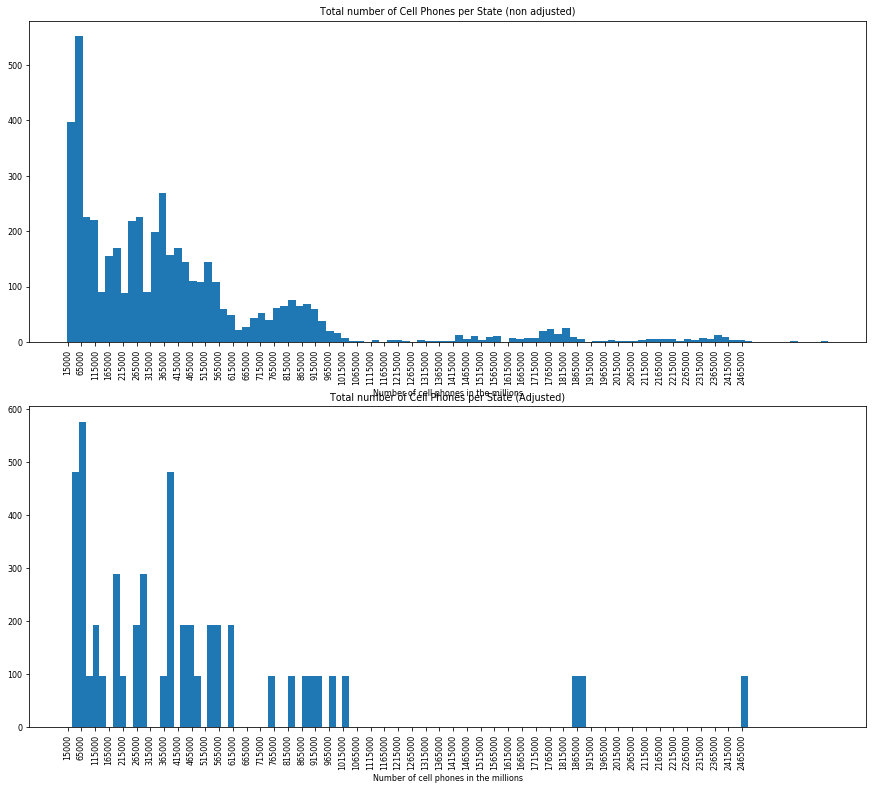

In [32]:
#Distributions of adjusted and non-adjusted device numbers.

plt.rcParams.update({'font.size': 8})

plt.figure(figsize=(15,13))
ax1 = plt.subplot(2,1,1)
plt.hist(df_state.num_devices, bins = 100)
plt.xticks(np.arange(15000, 2500000, 50000), rotation='vertical')
plt.xlabel('Number of cell phones in the millions')
plt.title('Total number of Cell Phones per State (non adjusted)')

ax2 = plt.subplot(212, sharex=ax1)
plt.hist(df_state.num_devices_a, bins = 100)
plt.title('Total number of Cell Phones per State (Adjusted)')
plt.xlabel('Number of cell phones in the millions')
plt.xticks(np.arange(15000, 2500000, 50000), rotation='vertical')

plt.show()

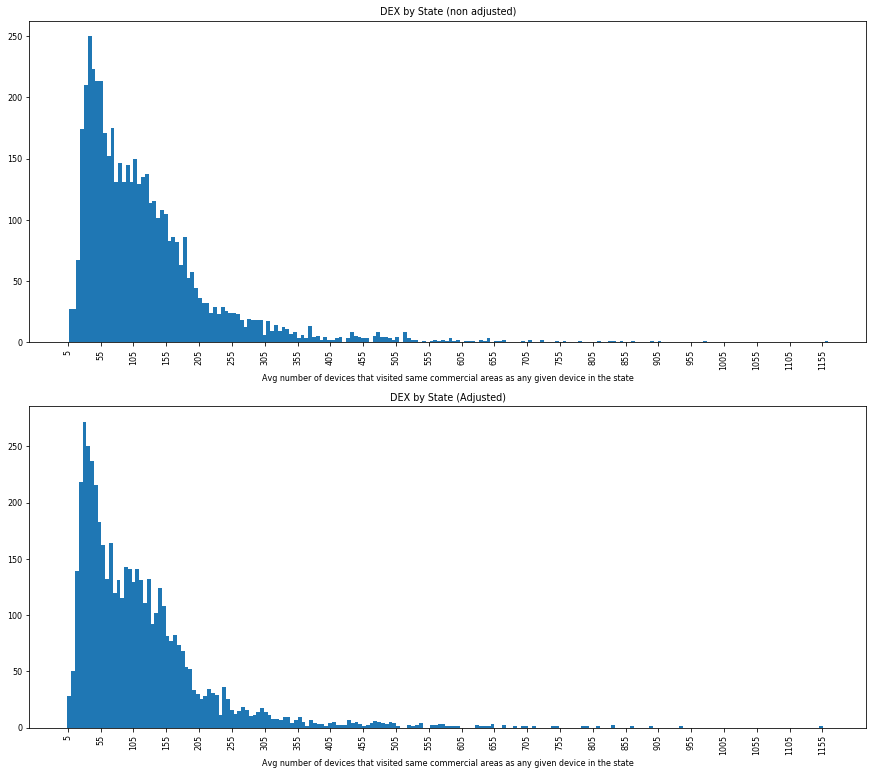

In [33]:
#Distribution of adjusted and non-adjusted Device Exposure Indices

plt.figure(figsize=(15,13))
ax1 = plt.subplot(2,1,1)
plt.hist(df_state.dex, bins = 200)
plt.xticks(np.arange(5, 1160, 50), rotation='vertical')
plt.xlabel('Avg number of devices that visited same commercial areas as any given device in the state')
plt.title('DEX by State (non adjusted)')

ax2 = plt.subplot(212, sharex=ax1)
plt.hist(df_state.dex_a, bins = 200)
plt.title('DEX by State (Adjusted)')
plt.xlabel('Avg number of devices that visited same commercial areas as any given device in the state')
plt.xticks(np.arange(5, 1160, 50), rotation='vertical')

plt.show()

The distributions for both adjusted and non-adjusted number of devices spiked near 25 and 100.

In [34]:
stats.describe(df_state.dex)

DescribeResult(nobs=4896, minmax=(6.5997, 1164.0056), mean=123.50184287173202, variance=10664.675656802809, skewness=2.6851596615137328, kurtosis=11.822046942577295)

In [35]:
stats.describe(df_state.dex_a)

DescribeResult(nobs=4896, minmax=(4.4638, 1155.6233), mean=114.81614961192813, variance=10119.161422039082, skewness=2.6904447067824075, kurtosis=12.047919751994497)

In [36]:
#Calculate Average Adjust DEX (weighted by adjusted number of cell phones per state) in order to plot average adjusted DEX over time
df_state['date'].nunique()

96

In [37]:
df_by_date = df_state.groupby(df_state['date']).transform('mean')

In [38]:
df_by_date.head(5)

,date,dex,num_devices,dex_a,num_devices_a,dex_income_1,num_devices_income_1,dex_income_1_a,num_devices_income_1_a,dex_income_2,...,log_dex_income_3_a,log_dex_income_4_a,log_dex_education_1_a,log_dex_education_2_a,log_dex_education_3_a,log_dex_education_4_a,log_dex_race_asian_a,log_dex_race_black_a,log_dex_race_hispanic_a,log_dex_race_white_a
0,2020-01-20,171.696969,430151.254902,158.290510,465466.392157,140.354661,69961.019608,130.680676,74928.411765,153.781624,...,5.009146,5.357488,4.673251,4.828693,5.038383,5.369219,5.196206,4.937834,5.052109,5.014435
1,2020-01-21,145.738076,442327.901961,138.331902,465466.392157,129.546735,71661.196078,123.278839,74928.411765,132.314573,...,4.840191,5.124055,4.563694,4.672470,4.879999,5.183912,5.056168,4.858843,4.927853,4.838812
2,2020-01-22,144.351512,442922.156863,137.196782,465466.392157,127.331233,71749.254902,121.288224,74928.411765,132.260369,...,4.833202,5.109837,4.568147,4.672511,4.872269,5.166660,5.028989,4.844113,4.915567,4.831720
3,2020-01-23,160.508059,446081.000000,153.760029,465466.392157,139.655216,72502.803922,134.553614,74928.411765,146.689718,...,4.944075,5.250025,4.669456,4.783110,4.983203,5.296133,5.136760,4.939884,5.026767,4.951892
4,2020-01-24,199.180608,444439.705882,190.452343,465466.392157,175.705225,72303.254902,168.935373,74928.411765,189.399133,...,5.189416,5.449495,4.949420,5.044002,5.223597,5.474621,5.300674,5.115797,5.246110,5.186627


In [39]:
df_by_date_sum = df_state.groupby(df_state['date']).sum()
df_by_date_sum['num_devices_a'].value_counts()

23738786    96
Name: num_devices_a, dtype: int64

In [40]:
df_state.head(3)

,state,date,dex,num_devices,dex_a,num_devices_a,dex_income_1,num_devices_income_1,dex_income_1_a,num_devices_income_1_a,...,log_dex_income_3_a,log_dex_income_4_a,log_dex_education_1_a,log_dex_education_2_a,log_dex_education_3_a,log_dex_education_4_a,log_dex_race_asian_a,log_dex_race_black_a,log_dex_race_hispanic_a,log_dex_race_white_a
0,AL,2020-01-20,169.3337,499012,157.2836,537243,139.8325,133839,131.7052,142098,...,5.295143,5.612395,4.880659,5.032555,5.283135,5.546900,5.480933,5.011900,5.206867,5.177404
1,AL,2020-01-21,126.4763,510377,120.1515,537243,110.7451,136391,106.2973,142098,...,4.959404,5.236109,4.599805,4.764118,4.976946,5.235839,5.244673,4.785118,4.921994,4.867726
2,AL,2020-01-22,128.5769,512102,122.5600,537243,114.1824,136723,109.8634,142098,...,4.988395,5.240657,4.639781,4.795962,5.005075,5.231932,5.221759,4.801024,4.939959,4.896614


In [41]:
df_state['weighted_avg_dex'] = (df_state['num_devices_a']/23793251)*df_state['dex_a']

In [42]:
df_by_date = df_state.groupby(df_state['date']).mean()

In [43]:
df_by_date.head()

,dex,num_devices,dex_a,num_devices_a,dex_income_1,num_devices_income_1,dex_income_1_a,num_devices_income_1_a,dex_income_2,num_devices_income_2,...,log_dex_income_4_a,log_dex_education_1_a,log_dex_education_2_a,log_dex_education_3_a,log_dex_education_4_a,log_dex_race_asian_a,log_dex_race_black_a,log_dex_race_hispanic_a,log_dex_race_white_a,weighted_avg_dex
date,,,,,,,,,,,,,,,,,,,,,
2020-01-20,171.696969,430151.254902,158.290510,465466.392157,140.354661,69961.019608,130.680676,74928.411765,153.781624,85103.411765,...,5.357488,4.673251,4.828693,5.038383,5.369219,5.196206,4.937834,5.052109,5.014435,3.727474
2020-01-21,145.738076,442327.901961,138.331902,465466.392157,129.546735,71661.196078,123.278839,74928.411765,132.314573,86998.470588,...,5.124055,4.563694,4.672470,4.879999,5.183912,5.056168,4.858843,4.927853,4.838812,3.214028
2020-01-22,144.351512,442922.156863,137.196782,465466.392157,127.331233,71749.254902,121.288224,74928.411765,132.260369,87201.411765,...,5.109837,4.568147,4.672511,4.872269,5.166660,5.028989,4.844113,4.915567,4.831720,3.147326
2020-01-23,160.508059,446081.000000,153.760029,465466.392157,139.655216,72502.803922,134.553614,74928.411765,146.689718,87824.607843,...,5.250025,4.669456,4.783110,4.983203,5.296133,5.136760,4.939884,5.026767,4.951892,3.555731
2020-01-24,199.180608,444439.705882,190.452343,465466.392157,175.705225,72303.254902,168.935373,74928.411765,189.399133,87592.039216,...,5.449495,4.949420,5.044002,5.223597,5.474621,5.300674,5.115797,5.246110,5.186627,4.301527


In [44]:
df_by_date.index = pd.to_datetime(df_by_date.index)

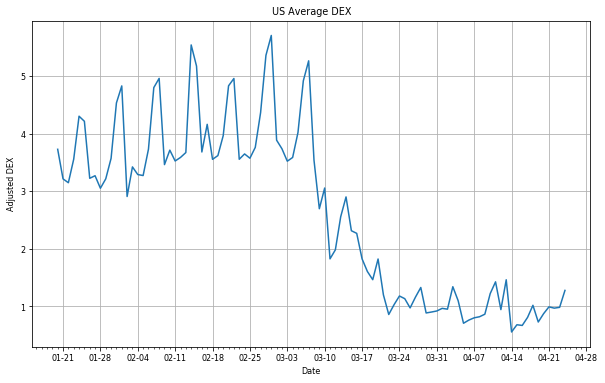

In [45]:
import matplotlib.dates as mdates
import matplotlib.cbook as cbook

weeks = mdates.WeekdayLocator()
days = mdates.DayLocator()

fig, ax = plt.subplots(figsize=(10, 6))
ax.xaxis.set_major_locator(weeks)
ax.xaxis.set_major_formatter(mdates.DateFormatter('%m-%d'))
ax.xaxis.set_minor_locator(days)
plt.xlabel('Date')
plt.ylabel('Adjusted DEX')

plt.title('US Average DEX')
ax.grid(True)
ax.plot(df_by_date.index, df_by_date['weighted_avg_dex'])
plt.show()

### Examination of State Data

| State | Ranking by Confirmed No. COVID-19 Cases|
| :-: | :-: |
| Massachusetts | 3rd |
| Washington | 17th |
| New York | 1st |
| New Jersey | 2nd |
| Michigan | 7th |
| Florida | 8th |
| Louisana | 9th |
| Texas | 11th |
| Wyoming | 3rd |
| Alaska | 51st |
| Montana | 50th |
| Arkansas | 15th |
| Georgia | 12th |

All figures listed above were based on data gathered from the CDC on April 27th.
https://www.cdc.gov/covid-data-tracker/index.html


In [46]:
states_list = ('MA', 'WA', 'NY', 'NJ', 'MI', 'FL', 'LA', 'TX', 'WY', 'AK', 'MT', 'GA', 'AR')

In [47]:
states_name_list = ['df_' + x for x in states_list]

In [48]:
states_name_list

['df_MA',
 'df_WA',
 'df_NY',
 'df_NJ',
 'df_MI',
 'df_FL',
 'df_LA',
 'df_TX',
 'df_WY',
 'df_AK',
 'df_MT',
 'df_GA',
 'df_AR']

In [49]:
for i in range(0, len(states_name_list)):
  states_name_list[i] = df_state.loc[df_state['state']==states_list[i]]

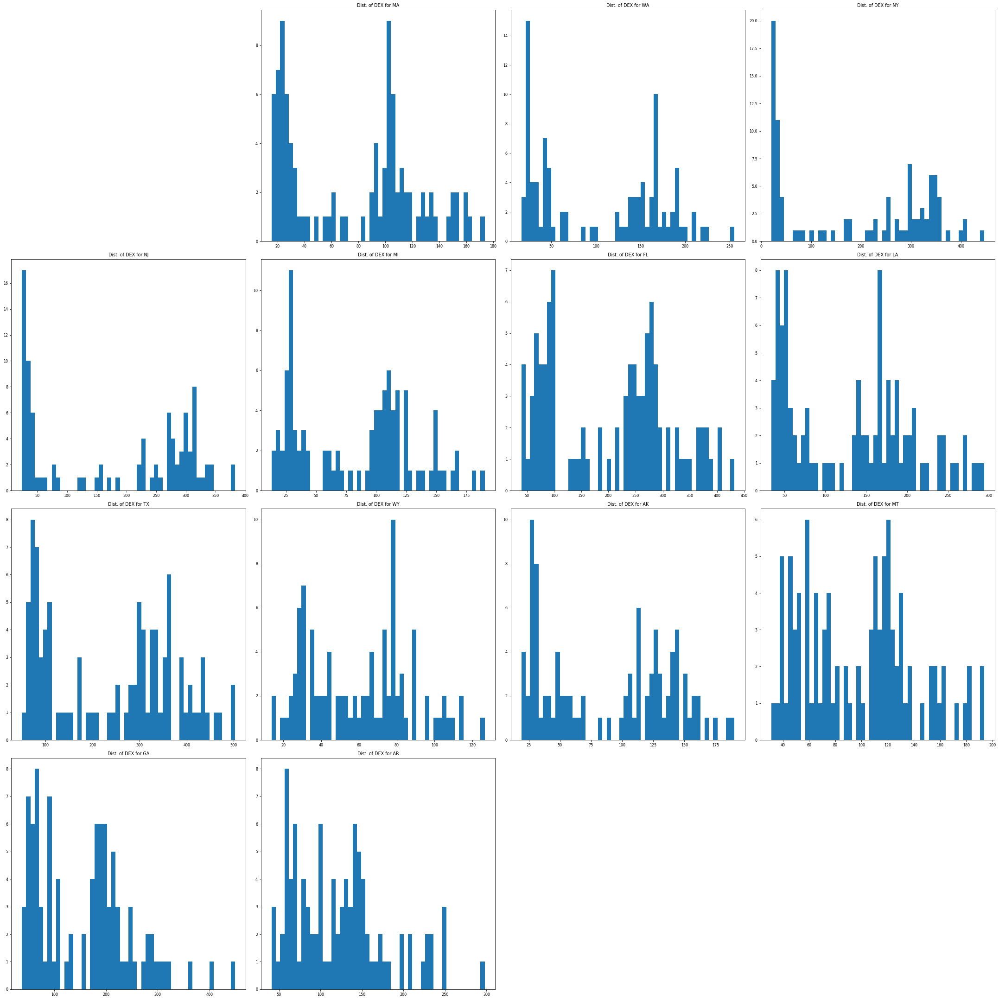

In [50]:
#examine distribution of per state datasets
plt.figure(figsize=(30,30))	
index = 1
for i in range(0, len(states_name_list)):	
  plt.subplot(4,4,index+1)
  plt.hist(states_name_list[i].dex_a, bins=50)
  plt.title('Dist. of DEX for {}'.format(states_list[index-1]))
  index +=1
plt.tight_layout()
plt.show()

All of the DEX distributions for each of the 13 states of interest have two distinct peaks, most likely a representation of adjusted DEX before and after stay-at-home advisories.

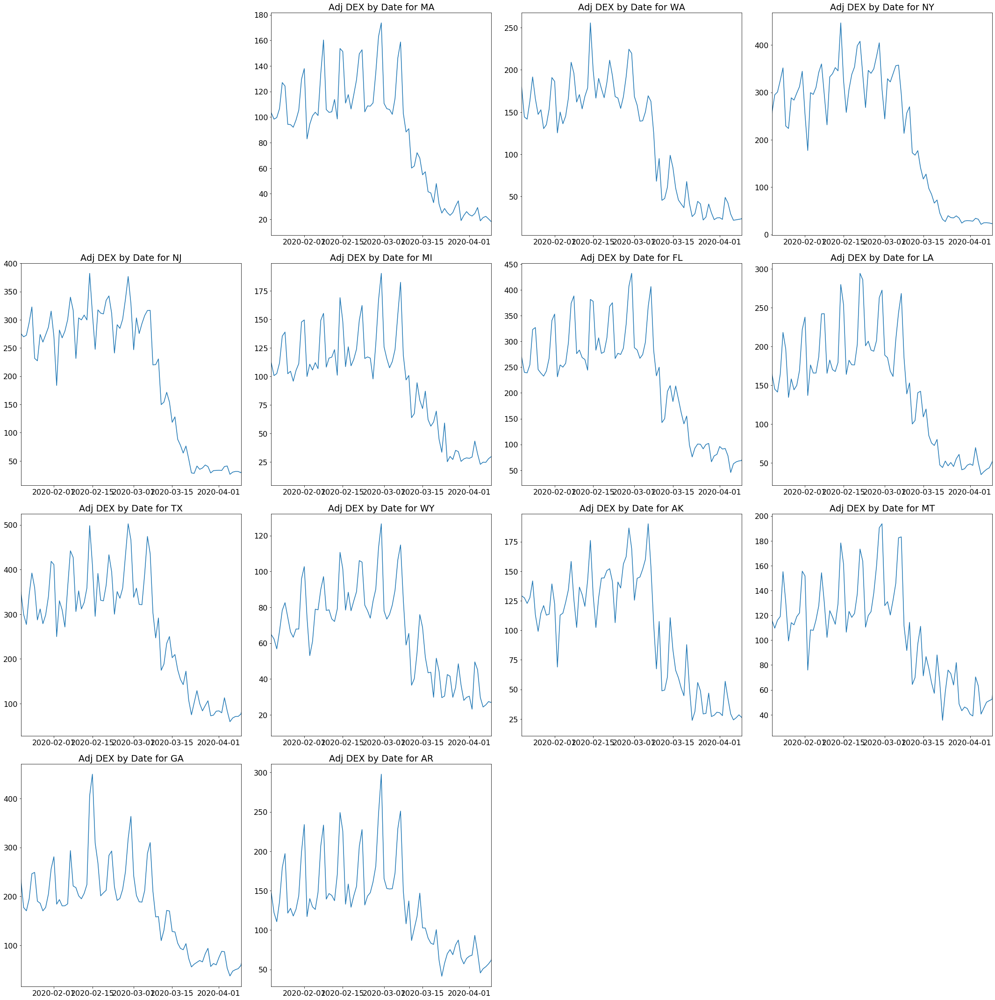

In [51]:
#examine distribution of per state datasets
plt.rcParams.update({'font.size': 16})

plt.figure(figsize=(30,30))	
index = 1
for i in range(0, len(states_name_list)):	
  plt.subplot(4,4,index+1)
  plt.plot(states_name_list[i].date, states_name_list[i].dex_a)
  plt.title('Adj DEX by Date for {}'.format(states_list[index-1]))
  plt.xlim([np.datetime64('2020-01-20'), np.datetime64('2020-04-09')])
  index +=1
plt.tight_layout()
plt.show()

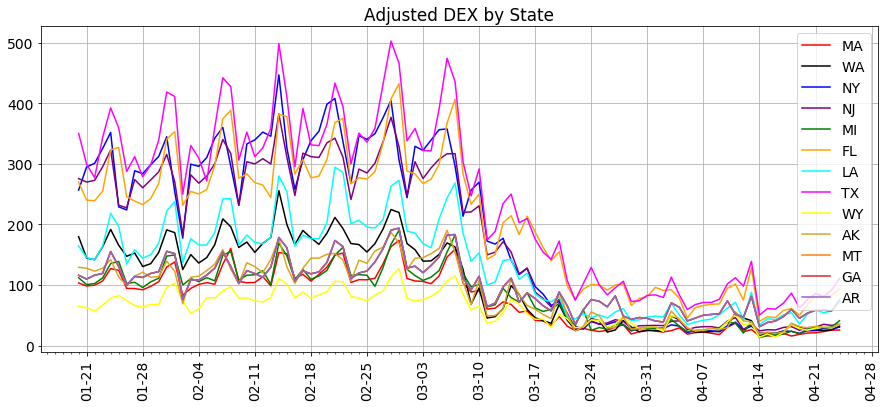

In [52]:
#Plot Adjusted DEX overtime for each state.
plt.rcParams.update({'font.size': 14})

fig, ax = plt.subplots(figsize=(15, 6))
ax.xaxis.set_major_locator(weeks)
ax.xaxis.set_major_formatter(mdates.DateFormatter('%m-%d'))
ax.xaxis.set_minor_locator(days)

ax.plot(states_name_list[0].date, states_name_list[0].dex_a, color = 'red')
ax.plot(states_name_list[1].date, states_name_list[1].dex_a, color = 'black')
ax.plot(states_name_list[2].date, states_name_list[2].dex_a, color = 'blue')
ax.plot(states_name_list[3].date, states_name_list[3].dex_a, color = 'purple')
ax.plot(states_name_list[4].date, states_name_list[4].dex_a, color = 'green')
ax.plot(states_name_list[5].date, states_name_list[5].dex_a, color = 'orange')
ax.plot(states_name_list[6].date, states_name_list[6].dex_a, color = 'cyan')
ax.plot(states_name_list[7].date, states_name_list[7].dex_a, color = 'magenta')
ax.plot(states_name_list[8].date, states_name_list[8].dex_a, color = 'yellow')
ax.plot(states_name_list[9].date, states_name_list[9].dex_a, color = 'goldenrod')
ax.plot(states_name_list[10].date, states_name_list[10].dex_a, color = 'C1')
ax.plot(states_name_list[11].date, states_name_list[10].dex_a, color = 'C3')
ax.plot(states_name_list[12].date, states_name_list[10].dex_a, color = 'C4')

ax.xaxis.set_major_locator(weeks)
ax.xaxis.set_major_formatter(mdates.DateFormatter('%m-%d'))
ax.xaxis.set_minor_locator(days)
plt.xticks(rotation='vertical')

plt.title('Adjusted DEX by State')
ax.grid(True)
plt.legend(states_list)
plt.show()


Based on the above plot of adjusted DEX over time, the following two groups of states emerge: 
-  Group 1
  -  TX
  -  FL
  -  NY
  -  NJ
-  Group 2 - Everyone else

Eventually Florida and New Jersery move to the second group, leaving only Florida and Texas with similar DEX levels after March 11, 2020.

In [53]:
for i in range(0, len(states_name_list)):	
  print('{} Descriptive Statistics'.format(states_list[i]))
  print(states_name_list[i].describe())
  print('------------------------------')


MA Descriptive Statistics
              dex    num_devices       dex_a  num_devices_a  dex_income_1  \
count   96.000000      96.000000   96.000000           96.0     96.000000   
mean    82.838039  331449.875000   75.986836       375375.0     82.675833   
std     48.550659   30991.249753   47.166470            0.0     46.974283   
min     22.579200  251127.000000   15.575800       375375.0     22.310800   
25%     30.591925  316632.500000   25.406225       375375.0     32.136600   
50%     96.367300  339659.500000   91.429250       375375.0     95.793800   
75%    115.693250  355425.750000  108.554800       375375.0    114.200775   
max    186.042700  375375.000000  173.630000       375375.0    183.855300   

       num_devices_income_1  dex_income_1_a  num_devices_income_1_a  \
count             96.000000       96.000000                    96.0   
mean           30179.312500       73.641739                 35667.0   
std             3732.231279       45.647700                     0.0

              dex    num_devices       dex_a  num_devices_a  dex_income_1  \
count   96.000000      96.000000   96.000000           96.0     96.000000   
mean   187.894577  511747.218750  178.038473       565246.0    205.337100   
std    127.160363   43008.573539  125.325366            0.0    133.705451   
min     28.541400  403034.000000   24.221100       565246.0     34.633200   
25%     43.499025  478174.000000   35.041800       565246.0     52.220350   
50%    239.871600  525600.500000  223.854650       565246.0    254.959100   
75%    303.546625  545448.500000  299.609950       565246.0    319.260250   
max    403.494400  565246.000000  382.215600       565246.0    443.114800   

       num_devices_income_1  dex_income_1_a  num_devices_income_1_a  \
count             96.000000       96.000000                    96.0   
mean           30900.322917      187.359651                 35877.0   
std             3370.445519      128.759297                     0.0   
min            23478.0

              dex    num_devices       dex_a  num_devices_a  dex_income_1  \
count   96.000000      96.000000   96.000000           96.0     96.000000   
mean   142.322131  346165.854167  132.256720       384749.0    125.867498   
std     74.562091   31385.386377   74.952448            0.0     61.634959   
min     42.209400  265381.000000   33.943400       384749.0     41.333000   
25%     67.584175  321512.750000   53.687775       384749.0     65.988250   
50%    150.932050  356565.500000  141.823000       384749.0    133.838200   
75%    191.895350  370613.750000  185.293900       384749.0    165.160875   
max    299.665100  423834.000000  294.285500       384749.0    255.741900   

       num_devices_income_1  dex_income_1_a  num_devices_income_1_a  \
count             96.000000       96.000000                    96.0   
mean           72255.364583      115.503596                 81444.0   
std             7413.326875       62.450510                     0.0   
min            53710.0

              dex   num_devices       dex_a  num_devices_a  dex_income_1  \
count   96.000000     96.000000   96.000000           96.0     96.000000   
mean    94.095443  30397.041667   89.168069        33130.0    110.681616   
std     49.884768   2662.617260   50.946931            0.0     66.066928   
min     25.292600  22035.000000   19.174400        33130.0     22.887400   
25%     40.517550  29543.250000   34.400375        33130.0     39.730350   
50%    107.810200  31002.500000  102.395700        33130.0    110.345850   
75%    136.771775  32338.750000  131.285200        33130.0    162.147775   
max    194.094900  33430.000000  190.157900        33130.0    250.289100   

       num_devices_income_1  dex_income_1_a  num_devices_income_1_a  \
count             96.000000       96.000000                    96.0   
mean             791.802083      105.069064                   855.0   
std               56.782618       65.389989                     0.0   
min              605.000000    

              dex    num_devices       dex_a  num_devices_a  dex_income_1  \
count   96.000000      96.000000   96.000000           96.0     96.000000   
mean   130.875868  268148.833333  123.576767       287199.0    116.177688   
std     56.956140   18166.109212   56.555378            0.0     49.777678   
min     47.416300  216288.000000   41.292300       287199.0     40.814800   
25%     85.320200  259041.750000   74.183675       287199.0     78.364400   
50%    125.251100  270004.000000  119.600250       287199.0    111.348350   
75%    156.556625  278730.000000  150.390650       287199.0    137.060200   
max    310.983500  341138.000000  297.787300       287199.0    287.989800   

       num_devices_income_1  dex_income_1_a  num_devices_income_1_a  \
count             96.000000       96.000000                    96.0   
mean           73999.333333      108.683781                 80338.0   
std             6025.914211       50.292338                     0.0   
min            57465.0

In [54]:
state_avg_dex_a = []
state_std_dex_a = []
for i in range(0, len(states_name_list)):
  state_avg_dex_a.append(states_name_list[i].dex_a.mean())
  state_std_dex_a.append(states_name_list[i].dex_a.std())

In [55]:
data = {'State':states_list, 'Average': state_avg_dex_a, 'Std Dev': state_std_dex_a}
state_DEX_averages_df = pd.DataFrame(data) 
state_DEX_averages_df.head()

,State,Average,Std Dev
0,MA,75.986836,47.166470
1,WA,105.267513,69.823036
2,NY,189.751341,141.147411
3,NJ,178.038473,125.325366
4,MI,83.818258,47.779679


In [56]:
state_DEX_averages_df.sort_values(by='Average')

,State,Average,Std Dev
8,WY,60.364171,27.346282
0,MA,75.986836,47.166470
4,MI,83.818258,47.779679
9,AK,89.168069,50.946931
10,MT,97.726051,42.195940
1,WA,105.267513,69.823036
12,AR,123.576767,56.555378
6,LA,132.256720,74.952448
11,GA,159.506001,90.634319
3,NJ,178.038473,125.325366


Despite Massachusetts having one of the lowest average adjusted DEXs, the state still is COVID-19 hot zone.

### Shelter-in-Place Orders and Advisories by State

| State | Starting Shelter-in-Place Date | Population |
| :-: | :-:| :-:|
| MA | 3/24 | 6.9 million |
| MI | 3/24 | 10 million |
| MT | 3/28 | 1.1 million |
| AK | 3/28 | 737,000 |
| WA | 3/23 | 7.5 million |
| LA | 3/23 | 4.6 million |
| NJ | 3/21 | 8.9 million |
| NY | 3/22 | 19.5 million |
| FL | 4/3 | 23.5 million |
| TX | 4/2 | 29 million |
| WY | 3/28 | 10,000 |
| GA | 3/3 | 10.6 million |
| AR | No Stay-at-Home Order | 3 million |


All data listed above was collected from the following:

Mervosh and Lu, "See Which States Are Reopening and Which Are Still Shut Down". The New York Times, 27-April-2020, https://www.nytimes.com/interactive/2020/us/states-reopen-map-coronavirus.html

Mervosh et al., "See Which States and Cities Have Told Residents to Stay at Home" The New York Times 20-April-2020, https://www.nytimes.com/interactive/2020/us/states-reopen-map-coronavirus.html

'QuickFacts Arkansas", United State Census Bureau, https://www.census.gov/quickfacts/AR , 27-April-2020

In [57]:

#find averages dex_a before and after stay at home orders in MA

import datetime

start_sah =  np.datetime64('2020-03-24')
MA_before_sah = states_name_list[0].loc[(states_name_list[0].date < start_sah)]
MA_after_sah = states_name_list[0].loc[(states_name_list[0].date > start_sah)]

In [58]:
MA_before_sah.head()

,state,date,dex,num_devices,dex_a,num_devices_a,dex_income_1,num_devices_income_1,dex_income_1_a,num_devices_income_1_a,...,log_dex_income_4_a,log_dex_education_1_a,log_dex_education_2_a,log_dex_education_3_a,log_dex_education_4_a,log_dex_race_asian_a,log_dex_race_black_a,log_dex_race_hispanic_a,log_dex_race_white_a,weighted_avg_dex
2016,MA,2020-01-20,112.3331,345048,103.2575,375375,100.3660,32818,92.3490,35667,...,4.863728,4.386717,4.479444,4.629866,4.931291,4.885247,4.609875,4.642914,4.728024,1.629045
2017,MA,2020-01-21,103.0225,358270,98.3280,375375,100.9579,34077,96.4573,35667,...,4.757970,4.421531,4.451546,4.562836,4.825105,4.848741,4.773653,4.646778,4.621777,1.551275
2018,MA,2020-01-22,104.4150,357987,99.5783,375375,101.6009,34157,97.2995,35667,...,4.777373,4.433225,4.490272,4.580594,4.832520,4.832511,4.802022,4.675119,4.637037,1.571000
2019,MA,2020-01-23,111.2880,359392,106.5494,375375,109.8018,34485,106.1630,35667,...,4.844284,4.597344,4.566449,4.627932,4.902356,4.910323,4.836845,4.775546,4.706273,1.680980
2020,MA,2020-01-24,133.7267,356359,126.9523,375375,135.5777,34244,130.1686,35667,...,5.025787,4.753213,4.767715,4.848606,5.073257,5.098169,5.007943,4.949824,4.900232,2.002867


In [59]:
def create_before_and_after_df(start_sah, before_sah, after_sah, original_df):
  before_sah = original_df.loc[(original_df.date < start_sah)]
  after_sah = original_df.loc[(original_df.date > start_sah)]

In [60]:
sah_start_dates = ['2020-03-24', '2020-03-23', '2020-03-22', '2020-03-21', '2020-03-24', '2020-04-03', '2020-03-23', '2020-04-02', '2020-03-28', '2020-03-28', '2020-03-28', '2020-04-03']
#a date was not entered for Arkansas, since they do not have a state level stay at home order or advisory.

In [61]:
datetime_sah_start_dates = []
for i in range (0, len(sah_start_dates)):
  datetime_sah_start_dates.append(np.datetime64(sah_start_dates[i]))

In [62]:
datetime_sah_start_dates

[numpy.datetime64('2020-03-24'),
 numpy.datetime64('2020-03-23'),
 numpy.datetime64('2020-03-22'),
 numpy.datetime64('2020-03-21'),
 numpy.datetime64('2020-03-24'),
 numpy.datetime64('2020-04-03'),
 numpy.datetime64('2020-03-23'),
 numpy.datetime64('2020-04-02'),
 numpy.datetime64('2020-03-28'),
 numpy.datetime64('2020-03-28'),
 numpy.datetime64('2020-03-28'),
 numpy.datetime64('2020-04-03')]

In [63]:
before_sah_list = ['before_sah_' + x for x in states_list]
after_sah_list = ['after_sah_' + x for x in states_list]

In [64]:
for i in range (0, len(states_list)-1):
  before_sah_list[i] = states_name_list[i].loc[(states_name_list[i].date < datetime_sah_start_dates[i])]
  after_sah_list[i] = states_name_list[i].loc[(states_name_list[i].date > datetime_sah_start_dates[i])]

In [65]:
before_sah_list[1].head()

,state,date,dex,num_devices,dex_a,num_devices_a,dex_income_1,num_devices_income_1,dex_income_1_a,num_devices_income_1_a,...,log_dex_income_4_a,log_dex_education_1_a,log_dex_education_2_a,log_dex_education_3_a,log_dex_education_4_a,log_dex_race_asian_a,log_dex_race_black_a,log_dex_race_hispanic_a,log_dex_race_white_a,weighted_avg_dex
4512,WA,2020-01-20,194.0873,423886,179.5755,458141,153.0505,40994,143.3011,43783,...,5.558867,4.904686,5.073644,5.263742,5.636651,5.584705,5.623370,5.179627,5.229700,3.457741
4513,WA,2020-01-21,150.4243,439323,144.2456,458141,126.4058,42251,121.9828,43783,...,5.253519,4.789994,4.913621,5.028816,5.308252,5.328385,5.453940,4.992650,4.984711,2.777461
4514,WA,2020-01-22,147.9715,438407,141.5978,458141,121.0732,42047,116.2726,43783,...,5.244832,4.768925,4.899488,5.006416,5.277032,5.313218,5.445598,4.961877,4.960713,2.726477
4515,WA,2020-01-23,169.5323,440695,163.0766,458141,135.8611,42494,131.8612,43783,...,5.411628,4.893195,5.005050,5.125496,5.462432,5.460426,5.600418,5.101228,5.097276,3.140053
4516,WA,2020-01-24,201.6043,435464,191.6253,458141,167.9855,42126,161.6280,43783,...,5.569943,5.050838,5.200640,5.334501,5.608215,5.595233,5.710992,5.275983,5.289503,3.689761


In [66]:
before_sah_avgs = []
for i in range (0, len(states_list)-1):
  before_sah_avgs.append(before_sah_list[i].dex_a.mean())

In [67]:
before_sah_avgs

[102.39916562499998,
 144.7116777777778,
 278.33087580645156,
 261.0483016393442,
 111.70343125000001,
 244.1927945945946,
 174.70486507936508,
 288.9670698630137,
 72.4782455882353,
 112.69655294117645,
 116.61181764705877,
 187.88306081081086]

In [68]:
after_sah_avgs = []
for i in range (0, len(states_list)-1):
  after_sah_avgs.append(after_sah_list[i].dex_a.mean())

In [69]:
#remove AR from states_list, since Arkansas does not have a state level stay-at-home advisory.
states_list=list(states_list)
states_list.remove('AR')
states_list

['MA', 'WA', 'NY', 'NJ', 'MI', 'FL', 'LA', 'TX', 'WY', 'AK', 'MT', 'GA']

In [70]:
data = {'State':states_list, 'Average_before_sha': before_sah_avgs, 'Average_after_sha': after_sah_avgs}
sah_DEXa_averages_df = pd.DataFrame(data) 
sah_DEXa_averages_df.head()

,State,Average_before_sha,Average_after_sha
0,MA,102.399166,23.096700
1,WA,144.711678,29.972850
2,NY,278.330876,28.111176
3,NJ,261.048302,32.774332
4,MI,111.703431,28.143490


In [71]:
sah_DEXa_averages_df

,State,Average_before_sha,Average_after_sha
0,MA,102.399166,23.096700
1,WA,144.711678,29.972850
2,NY,278.330876,28.111176
3,NJ,261.048302,32.774332
4,MI,111.703431,28.143490
5,FL,244.192795,71.373014
6,LA,174.704865,51.182931
7,TX,288.967070,83.059659
8,WY,72.478246,30.295052
9,AK,112.696553,31.477674


In [72]:
sah_DEXa_averages_df['change_afer_sah'] = sah_DEXa_averages_df['Average_before_sha']-sah_DEXa_averages_df['Average_after_sha']

In [73]:
sah_DEXa_averages_df['Percent_change_after_sah'] = sah_DEXa_averages_df['change_afer_sah']/sah_DEXa_averages_df['Average_before_sha']

In [74]:
sah_DEXa_averages_df

,State,Average_before_sha,Average_after_sha,change_afer_sah,Percent_change_after_sah
0,MA,102.399166,23.096700,79.302466,0.774444
1,WA,144.711678,29.972850,114.738828,0.792879
2,NY,278.330876,28.111176,250.219700,0.899001
3,NJ,261.048302,32.774332,228.273969,0.874451
4,MI,111.703431,28.143490,83.559941,0.748052
5,FL,244.192795,71.373014,172.819780,0.707719
6,LA,174.704865,51.182931,123.521934,0.707032
7,TX,288.967070,83.059659,205.907411,0.712564
8,WY,72.478246,30.295052,42.183194,0.582012
9,AK,112.696553,31.477674,81.218879,0.720686


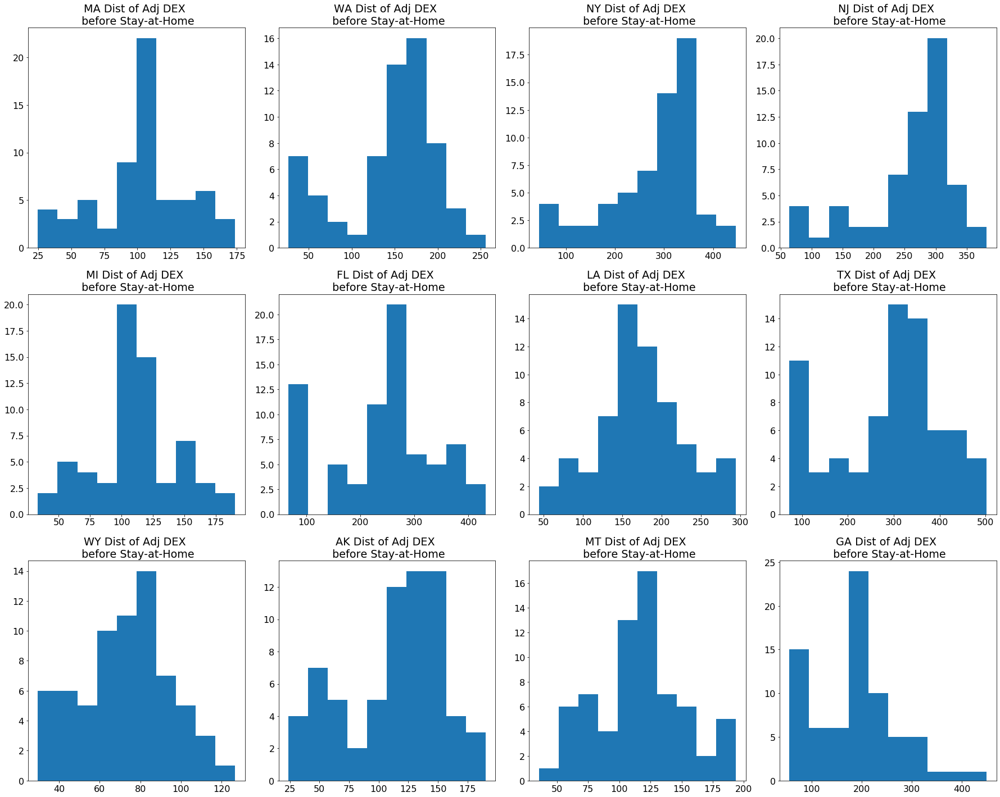

In [75]:
#Perform Signifcance Test on DEX changes before and after stay-at-home orders and advisories:

#check distributions of DEX before and after Stay at Home Orders and Advisories:
plt.rcParams.update({'font.size': 16})

plt.figure(figsize=(25,20))	
index = 0

for i in range (0, len(states_list)):
  plt.subplot(3,4,index+1)
  plt.hist(before_sah_list[i].dex_a)
  plt.title('{} Dist of Adj DEX \n before Stay-at-Home'.format(states_list[i]))
  index +=1
plt.tight_layout()
plt.show()

In [76]:
stats.describe(before_sah_list[0].dex_a)

DescribeResult(nobs=64, minmax=(24.8666, 173.63), mean=102.399165625, variance=1215.5433257191169, skewness=-0.33825645206288724, kurtosis=-0.1385044948425227)

In [77]:
for i in range (0, len(states_list)):
  print('{} -  {}'.format(states_list[i], stats.describe(before_sah_list[i].dex_a)))
  print('-----------------------------------------------------')

MA -  DescribeResult(nobs=64, minmax=(24.8666, 173.63), mean=102.399165625, variance=1215.5433257191169, skewness=-0.33825645206288724, kurtosis=-0.1385044948425227)
-----------------------------------------------------
WA -  DescribeResult(nobs=63, minmax=(26.2719, 255.6048), mean=144.71167777777777, variance=2823.841374287885, skewness=-0.6989817953256433, kurtosis=-0.22921444095753118)
-----------------------------------------------------
NY -  DescribeResult(nobs=62, minmax=(45.2656, 446.5735), mean=278.33087580645156, variance=8492.449819054651, skewness=-0.8863828269182339, kurtosis=0.08614319848154528)
-----------------------------------------------------
NJ -  DescribeResult(nobs=61, minmax=(63.7932, 382.2156), mean=261.04830163934423, variance=5629.532320317831, skewness=-1.1171045220027733, kurtosis=0.5489250871637652)
-----------------------------------------------------
MI -  DescribeResult(nobs=64, minmax=(33.382, 190.304), mean=111.70343125, variance=1046.8794041104366, s

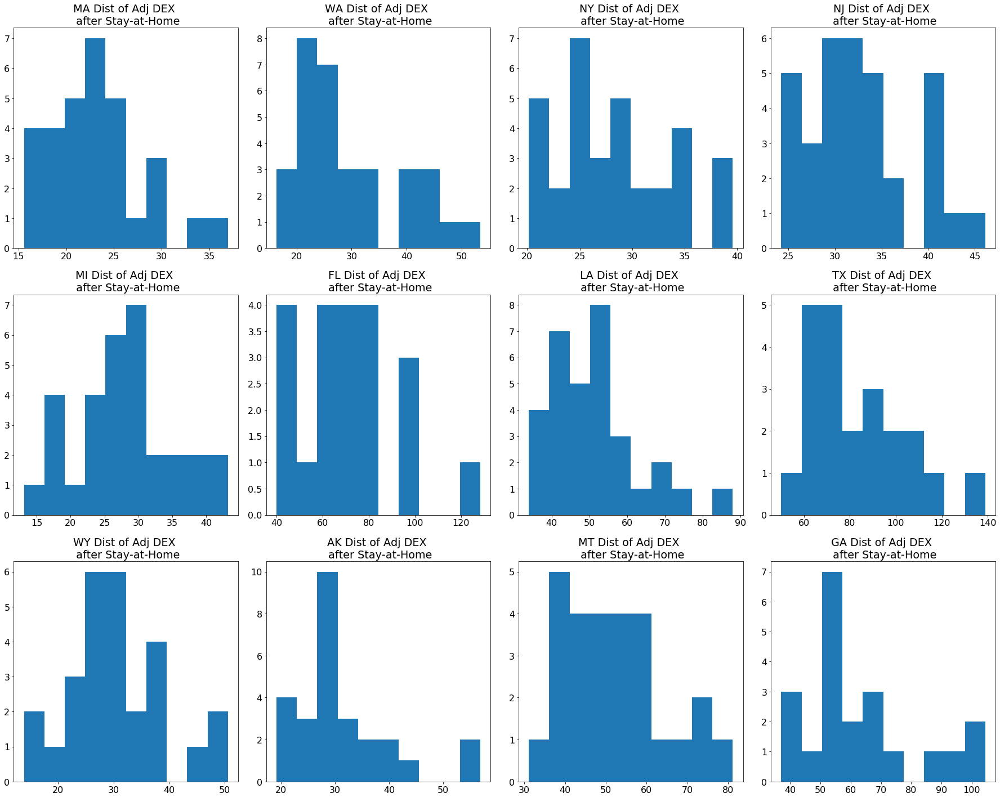

In [78]:
plt.rcParams.update({'font.size': 16})

plt.figure(figsize=(25,20))	
index = 0

for i in range (0, len(states_list)):
  plt.subplot(3,4,index+1)
  plt.hist(after_sah_list[i].dex_a)
  plt.title('{} Dist of Adj DEX \n after Stay-at-Home'.format(states_list[i]))
  index +=1
plt.tight_layout()
plt.show()

In [79]:
for i in range (0, len(states_list)):
  print('{} -  {}'.format(states_list[i], stats.describe(after_sah_list[i].dex_a)))
  print('-----------------------------------------------------')

MA -  DescribeResult(nobs=31, minmax=(15.5758, 36.9483), mean=23.096700000000006, variance=27.313133371333333, skewness=0.7720144186229587, kurtosis=0.36941588452941065)
-----------------------------------------------------
WA -  DescribeResult(nobs=32, minmax=(16.3524, 53.3513), mean=29.97285, variance=94.44163460322582, skewness=0.8385118220756199, kurtosis=-0.4356147810394271)
-----------------------------------------------------
NY -  DescribeResult(nobs=33, minmax=(20.1431, 39.5999), mean=28.111175757575758, variance=31.952654090018946, skewness=0.4952891396982073, kurtosis=-0.7236707669872304)
-----------------------------------------------------
NJ -  DescribeResult(nobs=34, minmax=(24.2211, 46.1256), mean=32.77433235294118, variance=31.072282007103386, skewness=0.5313808420286772, kurtosis=-0.5265065740005022)
-----------------------------------------------------
MI -  DescribeResult(nobs=31, minmax=(13.1198, 43.2127), mean=28.14349032258065, variance=53.896834832903224, skewne

The DEX_a distributions before stay-at-home orders for nearly all 12 states were normally distributed except for New Jersey, whose data was slightly skewed.  

GA, MT, AK, and LA all had non-normal distributions for their DEX_a's after stay at home orders/advisories were implemented.

In [80]:
non_normal_before_after_sah_idx = []
non_normal_before_after_sah_st = ['GA', 'LA', 'AK', 'MT','NJ']
for state in non_normal_before_after_sah_st:
  non_normal_before_after_sah_idx.append(states_list.index(state))
non_normal_before_after_sah_idx

[11, 6, 9, 10, 3]

In [81]:
normal_before_after_sah_idx = []
normal_before_after_sah_st = ['NY', 'MA', 'WA', 'FL', 'TX', 'MI','WY']
for state in normal_before_after_sah_st:
  normal_before_after_sah_idx.append(states_list.index(state))
normal_before_after_sah_idx

[2, 0, 1, 5, 7, 4, 8]

In [82]:
#perform Krukal_wallis Test for GA, LA, AK, MT, and NJ , since not both before and after stay at home distributions are normally distributed.
for idx in non_normal_before_after_sah_idx:
  print('{} Significance Test for Before/After Stay-at-Home'.format(states_list[idx]))
  print(stats.kruskal(before_sah_list[idx].dex_a, after_sah_list[idx].dex_a))
  print('----------------------')

GA Significance Test for Before/After Stay-at-Home
KruskalResult(statistic=37.743323680823664, pvalue=8.06924110197154e-10)
----------------------
LA Significance Test for Before/After Stay-at-Home
KruskalResult(statistic=57.50055803571428, pvalue=3.378834095003711e-14)
----------------------
AK Significance Test for Before/After Stay-at-Home
KruskalResult(statistic=48.84320533769062, pvalue=2.7726428693967834e-12)
----------------------
MT Significance Test for Before/After Stay-at-Home
KruskalResult(statistic=49.07414215686276, pvalue=2.4646796186638976e-12)
----------------------
NJ Significance Test for Before/After Stay-at-Home
KruskalResult(statistic=64.8125, pvalue=8.237492627045775e-16)
----------------------


In [83]:
#perform ttest on NY, MA, WA, FL, TX, MI, and WY, since both before and after stay at home distributions are normally distributed.
for idx in normal_before_after_sah_idx:
  print('{} Significance Test for Before/After Stay-at-Home'.format(states_list[idx]))
  print(stats.ttest_ind(before_sah_list[idx].dex_a, after_sah_list[idx].dex_a))
  print('----------------------')

NY Significance Test for Before/After Stay-at-Home
Ttest_indResult(statistic=15.543341875543456, pvalue=1.348273946786338e-27)
----------------------
MA Significance Test for Before/After Stay-at-Home
Ttest_indResult(statistic=12.562340980838261, pvalue=9.532530478661048e-22)
----------------------
WA Significance Test for Before/After Stay-at-Home
Ttest_indResult(statistic=12.081426033804517, pvalue=9.182741315919709e-21)
----------------------
FL Significance Test for Before/After Stay-at-Home
Ttest_indResult(statistic=8.297068875276407, pvalue=8.090434650182865e-13)
----------------------
TX Significance Test for Before/After Stay-at-Home
Ttest_indResult(statistic=8.170096306660984, pvalue=1.4937093338972382e-12)
----------------------
MI Significance Test for Before/After Stay-at-Home
Ttest_indResult(statistic=14.166764749375254, pvalue=5.94608561574439e-25)
----------------------
WY Significance Test for Before/After Stay-at-Home
Ttest_indResult(statistic=9.35939912176693, pvalue=

All differences in averages per state between the adjusted DEXs before and after stay-at-home orders and advisories were implemented are statistically signficant.

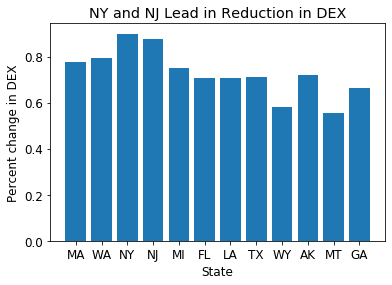

In [84]:
plt.rcParams.update({'font.size': 12})
plt.bar( sah_DEXa_averages_df['State'], sah_DEXa_averages_df['Percent_change_after_sah'])
plt.xlabel('State')
plt.title('NY and NJ Lead in Reduction in DEX')
plt.ylabel('Percent change in DEX')
plt.show()

In [85]:
states_name_list[0].head(2)

,state,date,dex,num_devices,dex_a,num_devices_a,dex_income_1,num_devices_income_1,dex_income_1_a,num_devices_income_1_a,...,log_dex_income_4_a,log_dex_education_1_a,log_dex_education_2_a,log_dex_education_3_a,log_dex_education_4_a,log_dex_race_asian_a,log_dex_race_black_a,log_dex_race_hispanic_a,log_dex_race_white_a,weighted_avg_dex
2016,MA,2020-01-20,112.3331,345048,103.2575,375375,100.3660,32818,92.3490,35667,...,4.863728,4.386717,4.479444,4.629866,4.931291,4.885247,4.609875,4.642914,4.728024,1.629045
2017,MA,2020-01-21,103.0225,358270,98.3280,375375,100.9579,34077,96.4573,35667,...,4.757970,4.421531,4.451546,4.562836,4.825105,4.848741,4.773653,4.646778,4.621777,1.551275


In [86]:
racial_groups = ['Asian', 'African American', 'Hispanic', 'Caucasian']

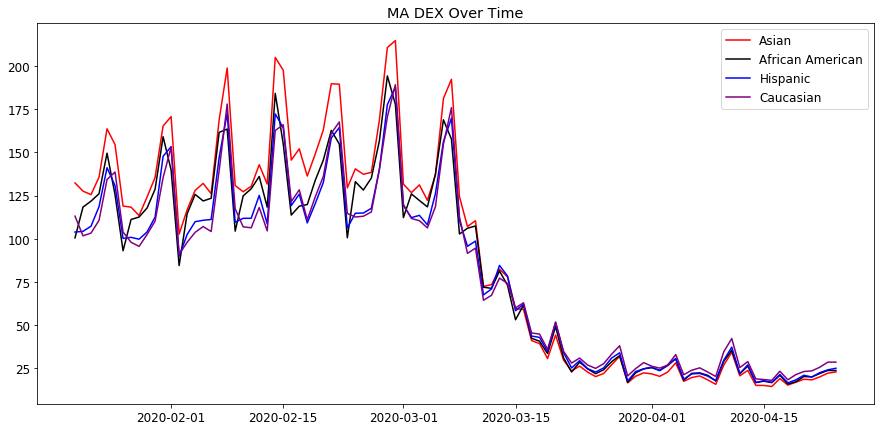

In [87]:
plt.figure(figsize=(15,7))
plt.plot(states_name_list[0].date, states_name_list[0].dex_race_asian_a, color = 'red')
plt.plot(states_name_list[0].date, states_name_list[0].dex_race_black_a, color = 'black')
plt.plot(states_name_list[0].date, states_name_list[0].dex_race_hispanic_a, color = 'blue')
plt.plot(states_name_list[0].date, states_name_list[0].dex_race_white_a, color = 'purple')
plt.title('MA DEX Over Time')
plt.legend(racial_groups)
plt.show()

In [88]:
income_groups = ['income_1', 'income_2', 'income_3', 'income_4']

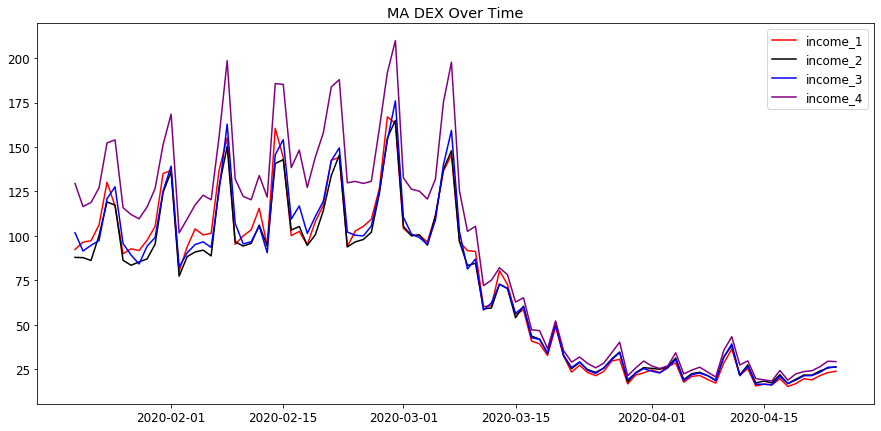

In [89]:
plt.figure(figsize=(15,7))
plt.plot(states_name_list[0].date, states_name_list[0].dex_income_1_a, color = 'red')
plt.plot(states_name_list[0].date, states_name_list[0].dex_income_2_a, color = 'black')
plt.plot(states_name_list[0].date, states_name_list[0].dex_income_3_a, color = 'blue')
plt.plot(states_name_list[0].date, states_name_list[0].dex_income_4_a, color = 'purple')
plt.title('MA DEX Over Time')
plt.legend(income_groups)
plt.show()

Income 1 represents the lowest income quartiles in a state; whereas 4 represents the highest.

It appears that there are really just two income classes when it comes to Smartphone phone movement/exposure in MA - The wealthiest quartile, which represents those with incomes of $81,000 or more, and those with individual incomes less than 81 thousand annually.

The figure for the highest income quartile in Massachusetts was collected from https://dqydj.com/2018-income-percentile-by-state-calculator/.

In [90]:
education_groups = ['education_1', 'education_2', 'education_3', 'education_4']

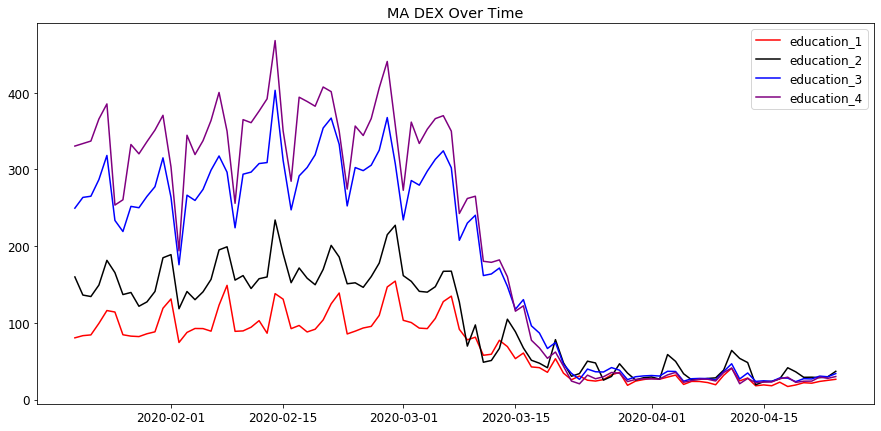

In [91]:
plt.figure(figsize=(15,7))
plt.plot(states_name_list[0].date, states_name_list[0].dex_education_1_a, color = 'red')
plt.plot(states_name_list[0].date, states_name_list[1].dex_education_2_a, color = 'black')
plt.plot(states_name_list[0].date, states_name_list[2].dex_education_3_a, color = 'blue')
plt.plot(states_name_list[0].date, states_name_list[3].dex_education_4_a, color = 'purple')
plt.title('MA DEX Over Time')
plt.legend(education_groups)
plt.show()

The adjusted DEX by educational group for Massachusetts forms two groups - one with the two highest quartiles for education and one for the two lowest quartiles.

According to the US Censuse (https://www.census.gov/quickfacts/MA) approximately 43% of Massachusetts residents have a bachelors degree or higher. The above plot by education quartiles indicates that that there is a difference in exposure and movement between those with and without a college degree.



In [92]:

def create_plots(i):

  plt.figure(figsize=(15,25))

  plt.subplot(3,1,1)
  plt.plot(states_name_list[i].date, states_name_list[i].dex_race_asian_a, color = 'red')
  plt.plot(states_name_list[i].date, states_name_list[i].dex_race_black_a, color = 'black')
  plt.plot(states_name_list[i].date, states_name_list[i].dex_race_hispanic_a, color = 'blue')
  plt.plot(states_name_list[i].date, states_name_list[i].dex_race_white_a, color = 'purple')
  plt.title('{} DEX Over Time'.format(states_list[i]))
  plt.legend(racial_groups)
  
  plt.subplot(3,1,2)
  plt.plot(states_name_list[i].date, states_name_list[i].dex_income_1_a, color = 'red')
  plt.plot(states_name_list[i].date, states_name_list[i].dex_income_2_a, color = 'black')
  plt.plot(states_name_list[i].date, states_name_list[i].dex_income_3_a, color = 'blue')
  plt.plot(states_name_list[i].date, states_name_list[i].dex_income_4_a, color = 'purple')
  plt.title('{} DEX Over Time'.format(states_list[i]))
  plt.legend(income_groups)

  plt.subplot(3,1,3)
  plt.plot(states_name_list[i].date, states_name_list[i].dex_education_1_a, color = 'red')
  plt.plot(states_name_list[i].date, states_name_list[i].dex_education_2_a, color = 'black')
  plt.plot(states_name_list[i].date, states_name_list[i].dex_education_3_a, color = 'blue')
  plt.plot(states_name_list[i].date, states_name_list[i].dex_education_4_a, color = 'purple')
  plt.title('{} DEX Over Time'.format(states_list[i]))
  plt.legend(education_groups)

  plt.tight_layout()
  plt.show()

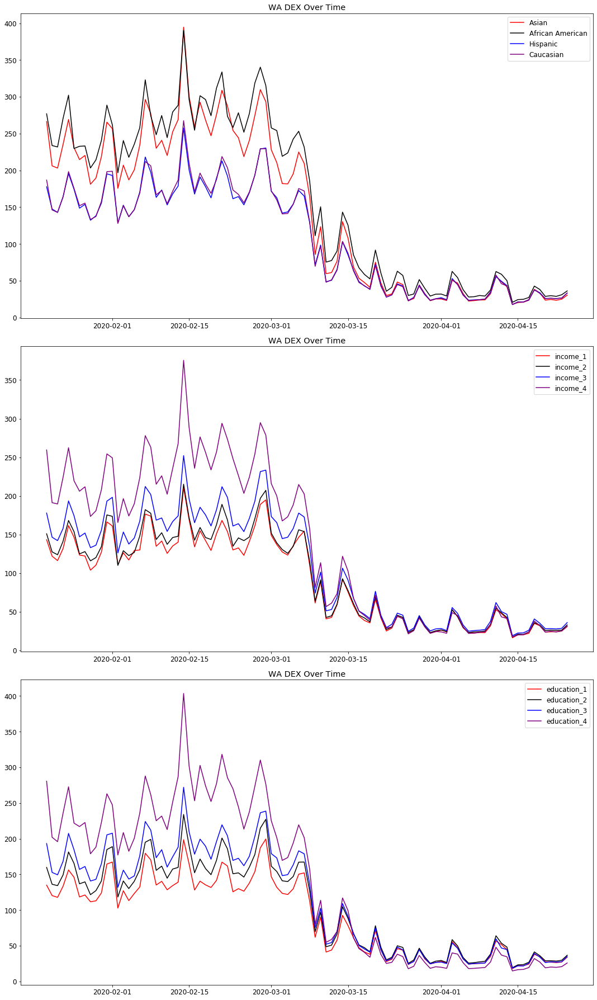

In [93]:
create_plots(1)

In [94]:
#add Arkansas back to states_list
states_list.append('AR')

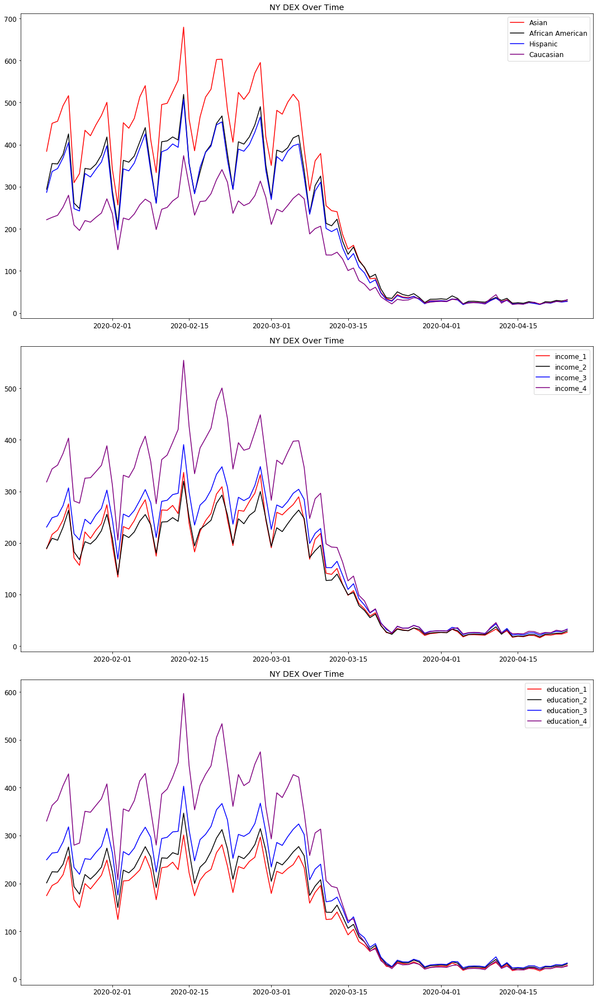

________________________________________________________________________________________________________________


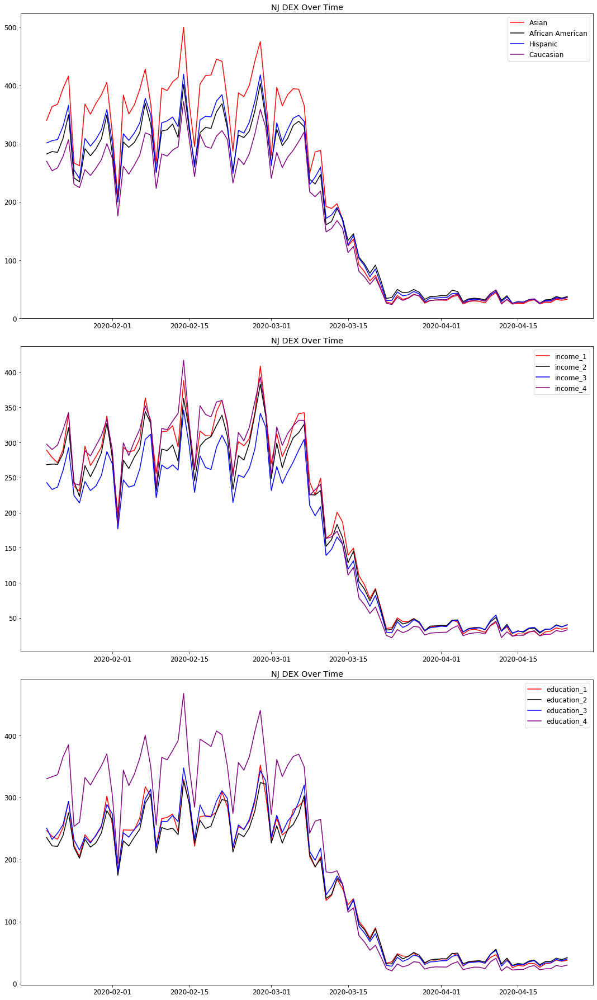

________________________________________________________________________________________________________________


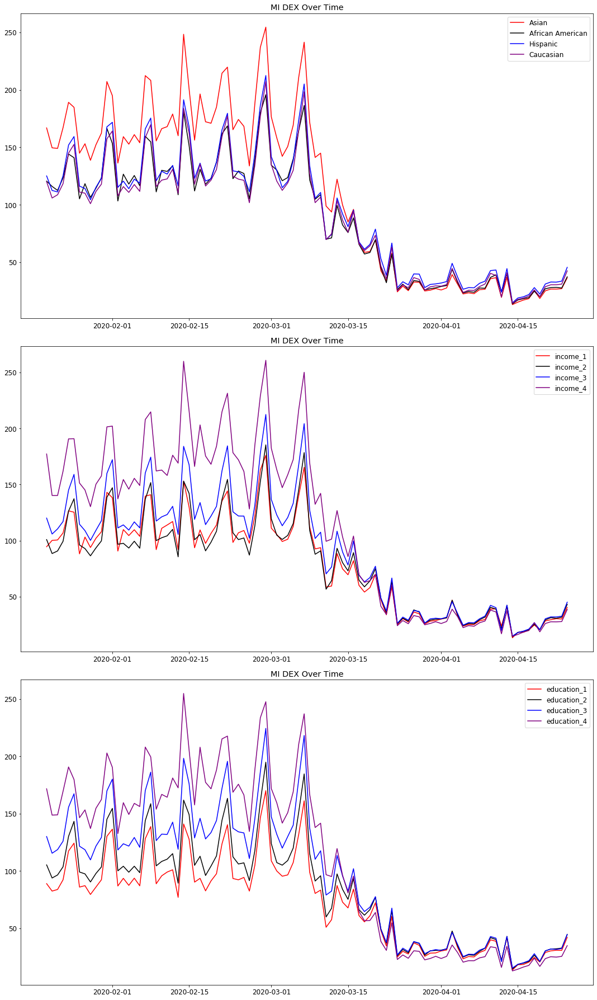

________________________________________________________________________________________________________________


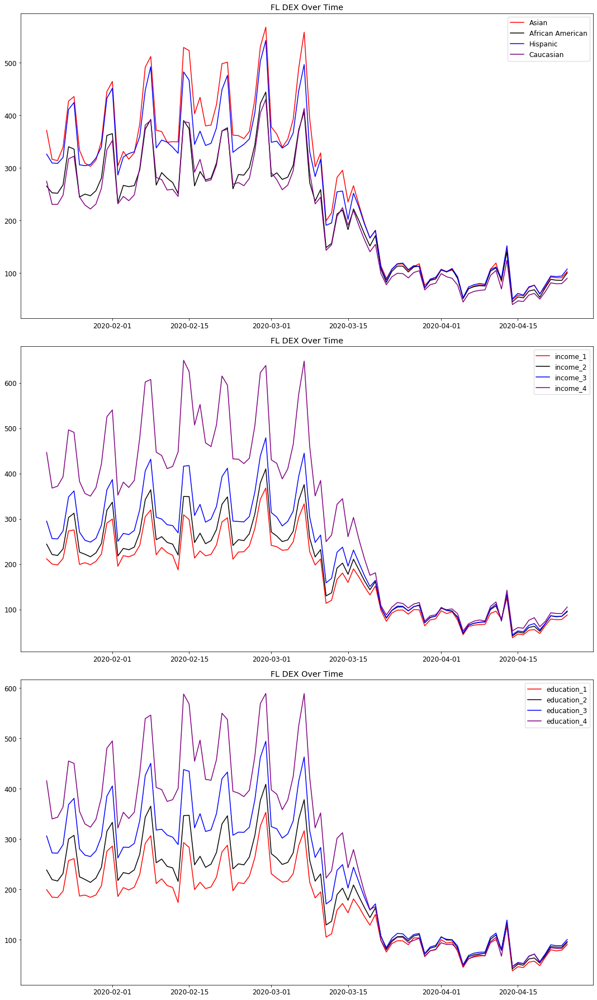

________________________________________________________________________________________________________________


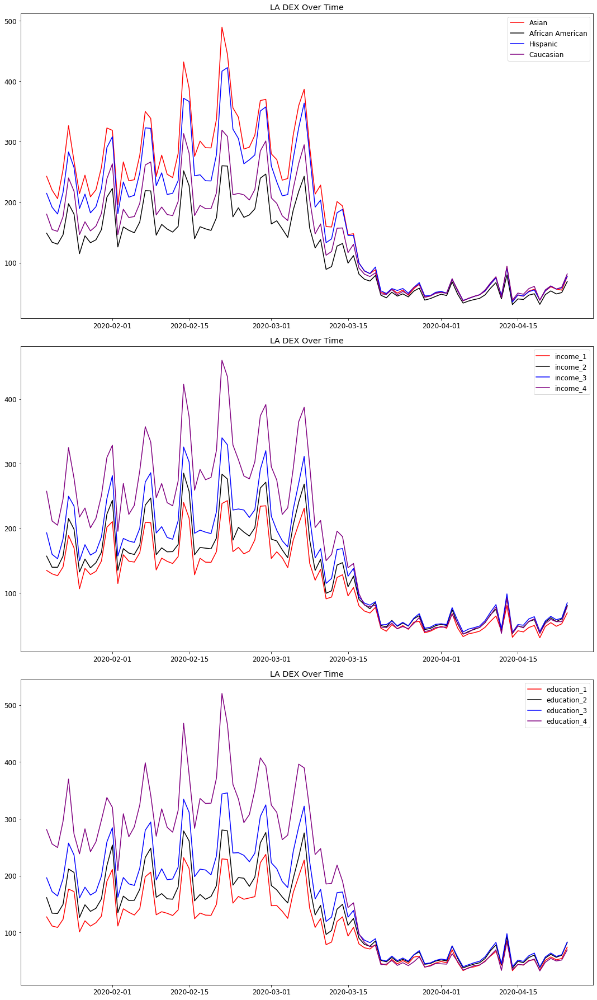

________________________________________________________________________________________________________________


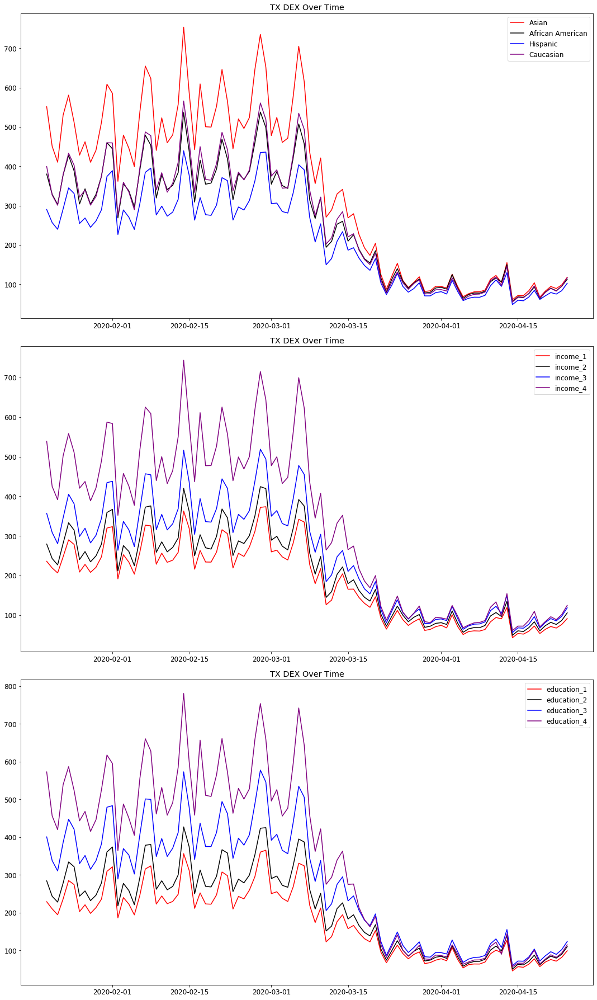

________________________________________________________________________________________________________________


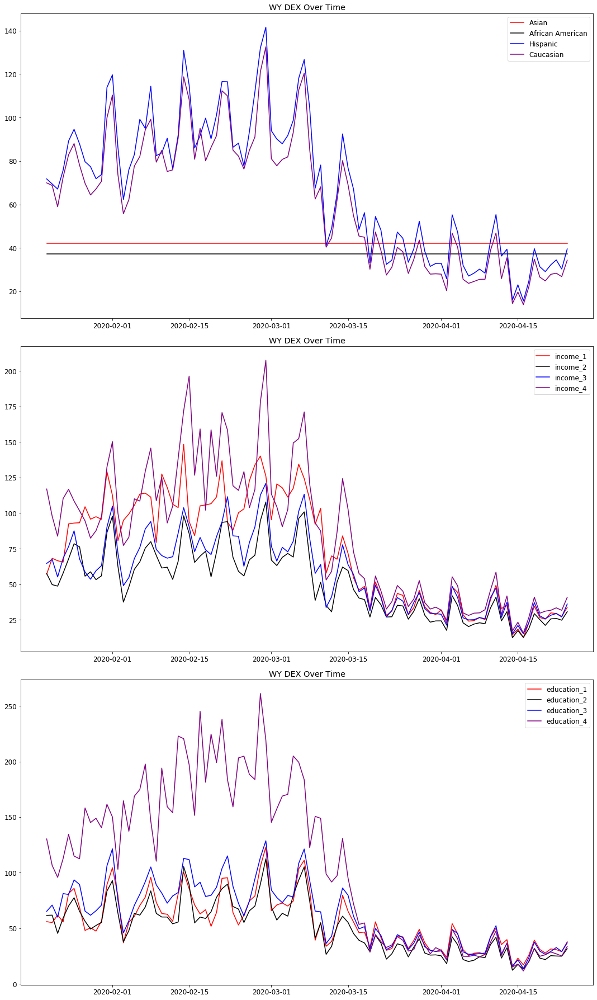

________________________________________________________________________________________________________________


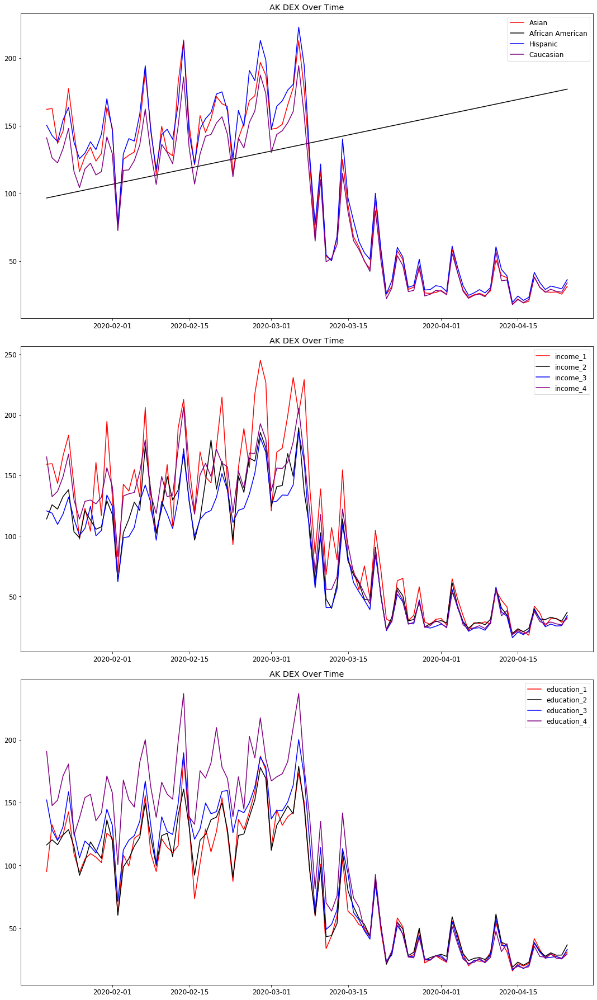

________________________________________________________________________________________________________________


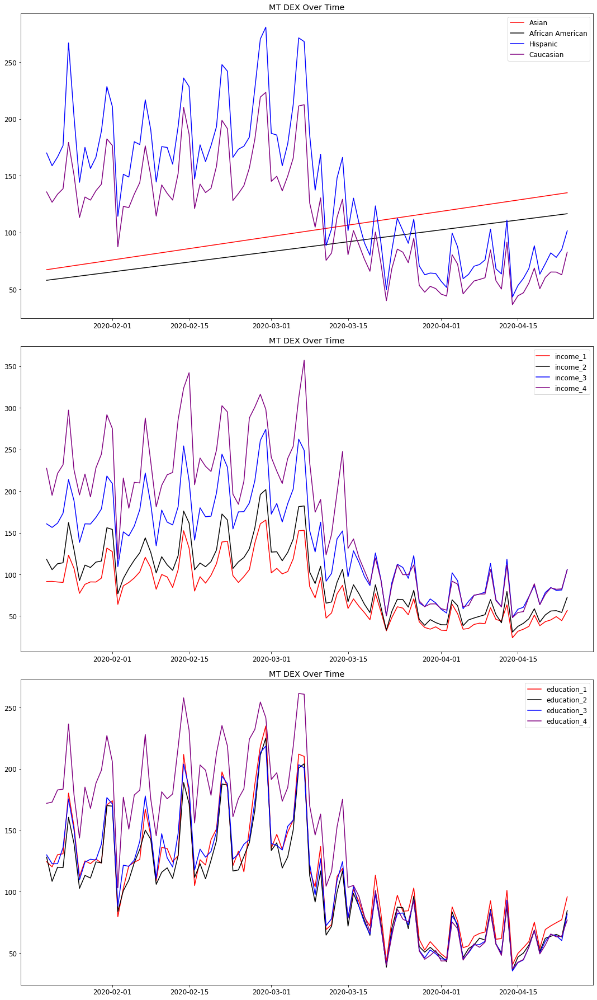

________________________________________________________________________________________________________________


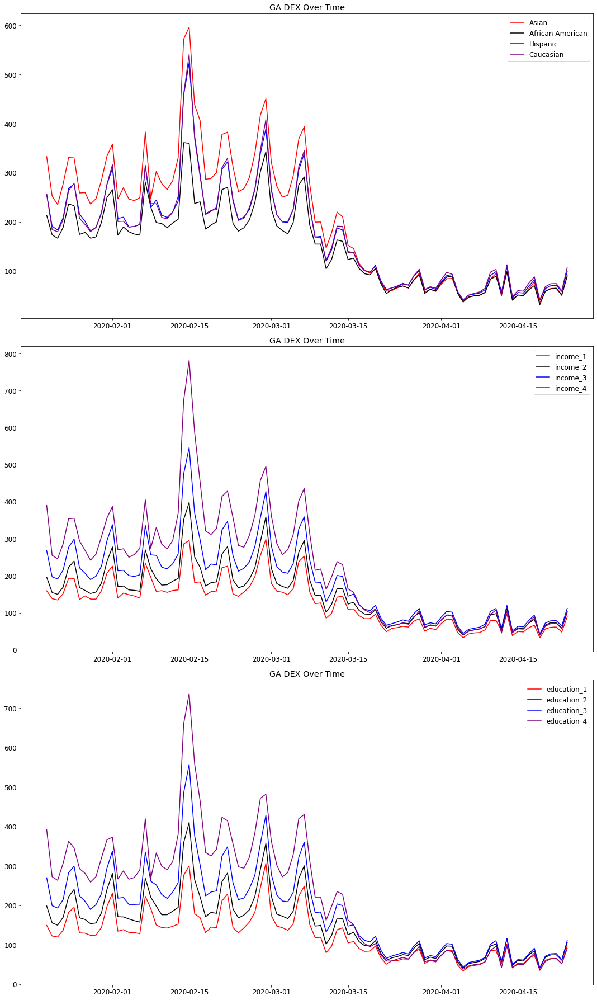

________________________________________________________________________________________________________________


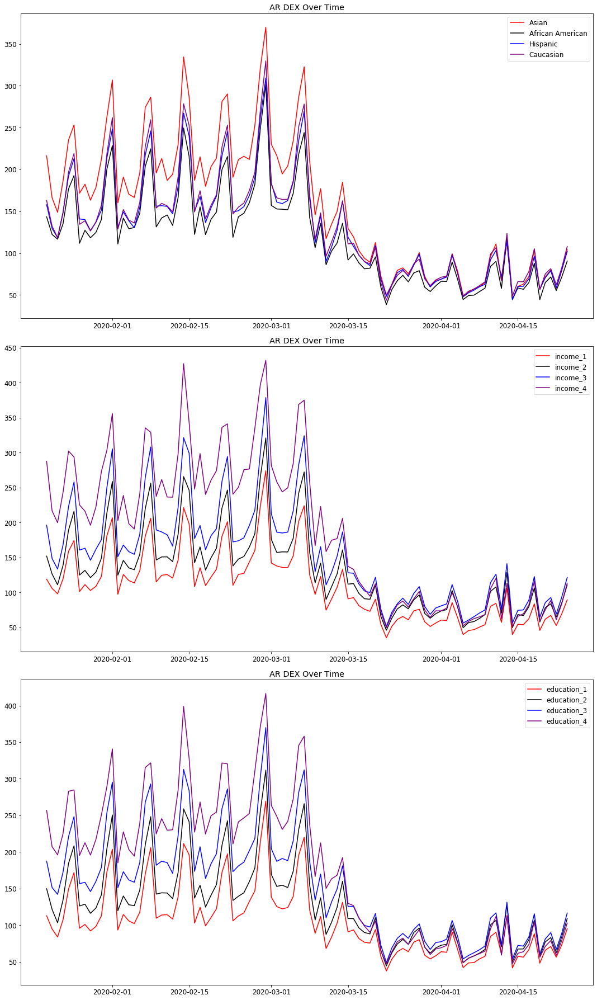

________________________________________________________________________________________________________________


In [95]:
for i in range(2,len(states_list)):
  create_plots(i)
  print('________________________________________________________________________________________________________________')

In [96]:
df_state.head(3)

,state,date,dex,num_devices,dex_a,num_devices_a,dex_income_1,num_devices_income_1,dex_income_1_a,num_devices_income_1_a,...,log_dex_income_4_a,log_dex_education_1_a,log_dex_education_2_a,log_dex_education_3_a,log_dex_education_4_a,log_dex_race_asian_a,log_dex_race_black_a,log_dex_race_hispanic_a,log_dex_race_white_a,weighted_avg_dex
0,AL,2020-01-20,169.3337,499012,157.2836,537243,139.8325,133839,131.7052,142098,...,5.612395,4.880659,5.032555,5.283135,5.546900,5.480933,5.011900,5.206867,5.177404,3.551407
1,AL,2020-01-21,126.4763,510377,120.1515,537243,110.7451,136391,106.2973,142098,...,5.236109,4.599805,4.764118,4.976946,5.235839,5.244673,4.785118,4.921994,4.867726,2.712977
2,AL,2020-01-22,128.5769,512102,122.5600,537243,114.1824,136723,109.8634,142098,...,5.240657,4.639781,4.795962,5.005075,5.231932,5.221759,4.801024,4.939959,4.896614,2.767360


In [97]:
df_by_date = df_state.groupby(['date']).mean()

In [98]:
df_by_date.head(2)

,dex,num_devices,dex_a,num_devices_a,dex_income_1,num_devices_income_1,dex_income_1_a,num_devices_income_1_a,dex_income_2,num_devices_income_2,...,log_dex_income_4_a,log_dex_education_1_a,log_dex_education_2_a,log_dex_education_3_a,log_dex_education_4_a,log_dex_race_asian_a,log_dex_race_black_a,log_dex_race_hispanic_a,log_dex_race_white_a,weighted_avg_dex
date,,,,,,,,,,,,,,,,,,,,,
2020-01-20,171.696969,430151.254902,158.290510,465466.392157,140.354661,69961.019608,130.680676,74928.411765,153.781624,85103.411765,...,5.357488,4.673251,4.828693,5.038383,5.369219,5.196206,4.937834,5.052109,5.014435,3.727474
2020-01-21,145.738076,442327.901961,138.331902,465466.392157,129.546735,71661.196078,123.278839,74928.411765,132.314573,86998.470588,...,5.124055,4.563694,4.672470,4.879999,5.183912,5.056168,4.858843,4.927853,4.838812,3.214028


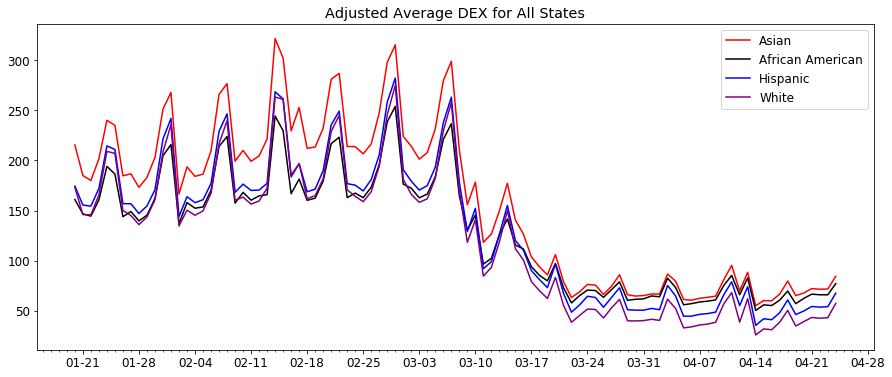

In [99]:
fig, ax = plt.subplots(figsize=(15, 6))
ax.xaxis.set_major_locator(weeks)
ax.xaxis.set_major_formatter(mdates.DateFormatter('%m-%d'))
ax.xaxis.set_minor_locator(days)
    
ax.plot(df_by_date.index, df_by_date.dex_race_asian_a, color = 'red')
ax.plot(df_by_date.index, df_by_date.dex_race_black_a, color = 'black')
ax.plot(df_by_date.index, df_by_date.dex_race_hispanic_a, color = 'blue')
ax.plot(df_by_date.index, df_by_date.dex_race_white_a, color = 'purple')
  
plt.title('Adjusted Average DEX for All States')
plt.legend(['Asian', 'African American', 'Hispanic', 'White'])
plt.show()



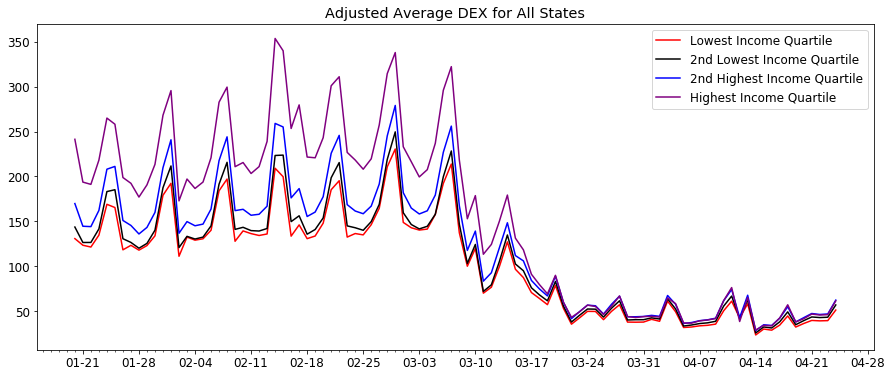

In [100]:
fig, ax = plt.subplots(figsize=(15, 6))
ax.xaxis.set_major_locator(weeks)
ax.xaxis.set_major_formatter(mdates.DateFormatter('%m-%d'))
ax.xaxis.set_minor_locator(days)


ax.plot(df_by_date.index, df_by_date.dex_income_1_a, color = 'red')
ax.plot(df_by_date.index, df_by_date.dex_income_2_a, color = 'black')
ax.plot(df_by_date.index, df_by_date.dex_income_3_a, color = 'blue')
ax.plot(df_by_date.index, df_by_date.dex_income_4_a, color = 'purple')
plt.title('Adjusted Average DEX for All States')
plt.legend(['Lowest Income Quartile', '2nd Lowest Income Quartile', '2nd Highest Income Quartile', 'Highest Income Quartile'])
plt.show()

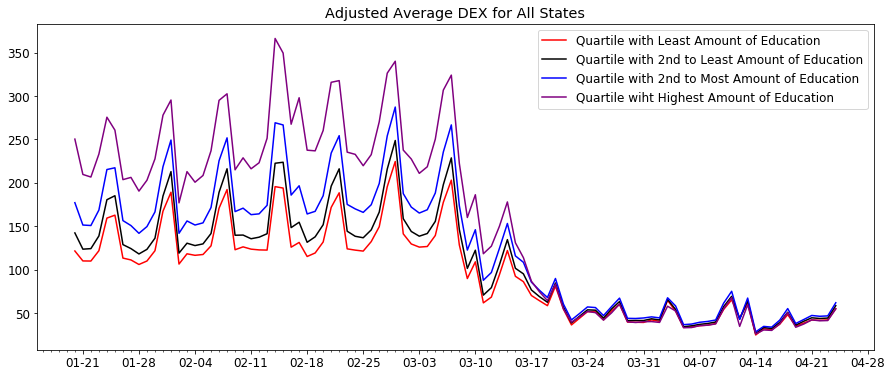

In [101]:
fig, ax = plt.subplots(figsize=(15, 6))
ax.xaxis.set_major_locator(weeks)
ax.xaxis.set_major_formatter(mdates.DateFormatter('%m-%d'))
ax.xaxis.set_minor_locator(days)


ax.plot(df_by_date.index, df_by_date.dex_education_1_a, color = 'red')
ax.plot(df_by_date.index, df_by_date.dex_education_2_a, color = 'black')
ax.plot(df_by_date.index, df_by_date.dex_education_3_a, color = 'blue')
ax.plot(df_by_date.index, df_by_date.dex_education_4_a, color = 'purple')
plt.title('Adjusted Average DEX for All States')
plt.legend(['Quartile with Least Amount of Education', 'Quartile with 2nd to Least Amount of Education', 'Quartile with 2nd to Most Amount of Education', 'Quartile wiht Highest Amount of Education'])
plt.show()

When looking at adjusted DEX by racial, income, and educational groups across all 50 states and the District of Columbia, the following patterns emerged:
-  Racial Groups - Asians consistently had hirer DEX levels than other racial groups.
-  Income - The highest income quartile has consistently hirer DEX levels than the three other groups; whereas the three other income classes displayed similar dex levels to each other.
-  Education - The most educated quartiles have the highest DEX levels, followed by the 2nd, 3rd, and 4th most educated quartiles. However the difference in DEX between each educational group is generally equal (unlike the trends seen in the groups divided by income)

When examining each of the 13 states of interest individually, the following behaviors stood out:
  -  New Jersey - The lowest and highest income quartiles had consistently higher DEX levels, whereas most states consistently had the highest income quartile with the highest DEX levels followed by the three remaining income groups sharing similar DEX values.
  -  Race - where African Americans and Caucasians exhibited the same DEX levels in Texas with Hispanics having the lowest level, nearly the opposite was true in Georgia where Hispanics and Caucasians share DEX levels and African Americans have the lowest DEX values.
  -  Unlike most other states, dex levels income groups in both Wyoming and Alaska appeared to be intertwined where one group did not consistently have higher DEX values than all other groups.
  -  When reviewing educational groups in Montana two distinct groups form, the most educated half of the state and the least educated half of the state. However, in neighboring Wyoming the most educated quartile has a much higher DEX level than teh three other groups, who share similar DEX values.




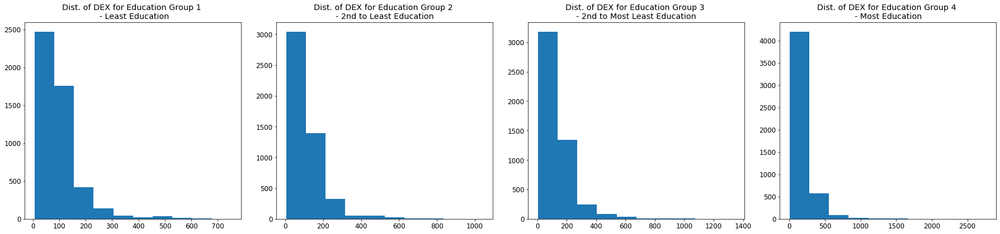

In [102]:
plt.figure(figsize=(25,6))

plt.subplot(1,4,1)
plt.hist(df_state['dex_education_1_a'])
plt.title('Dist. of DEX for Education Group 1 \n - Least Education')
  
plt.subplot(1,4,2)
plt.hist(df_state['dex_education_2_a'])
plt.title('Dist. of DEX for Education Group 2 \n- 2nd to Least Education')

plt.subplot(1,4,3)
plt.hist(df_state['dex_education_3_a'])
plt.title('Dist. of DEX for Education Group 3 \n- 2nd to Most Least Education')

plt.subplot(1,4,4)
plt.hist(df_state['dex_education_4_a'])
plt.title('Dist. of DEX for Education Group 4 \n- Most Education')
  
plt.tight_layout()
plt.show()

The adjusted DEX distribution becomes increasingly condensed for each educational group from least to most educated.

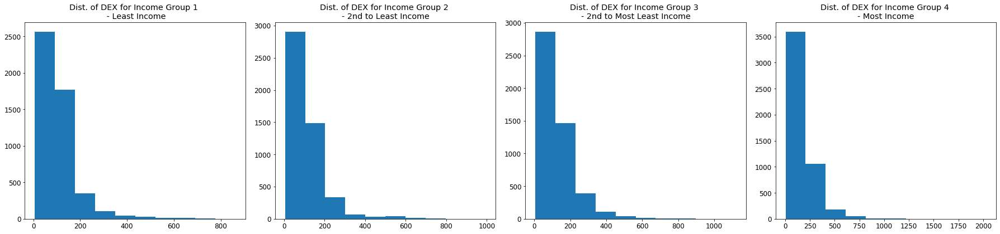

In [103]:
plt.figure(figsize=(25,6))

plt.subplot(1,4,1)
plt.hist(df_state['dex_income_1_a'])
plt.title('Dist. of DEX for Income Group 1 \n - Least Income')
  
plt.subplot(1,4,2)
plt.hist(df_state['dex_income_2_a'])
plt.title('Dist. of DEX for Income Group 2 \n- 2nd to Least Income')

plt.subplot(1,4,3)
plt.hist(df_state['dex_income_3_a'])
plt.title('Dist. of DEX for Income Group 3 \n- 2nd to Most Least Income')

plt.subplot(1,4,4)
plt.hist(df_state['dex_income_4_a'])
plt.title('Dist. of DEX for Income Group 4 \n- Most Income')
  
plt.tight_layout()
plt.show()

The adjusted DEX distribution becomes increasingly condensed for each income group from smallest to largest income.

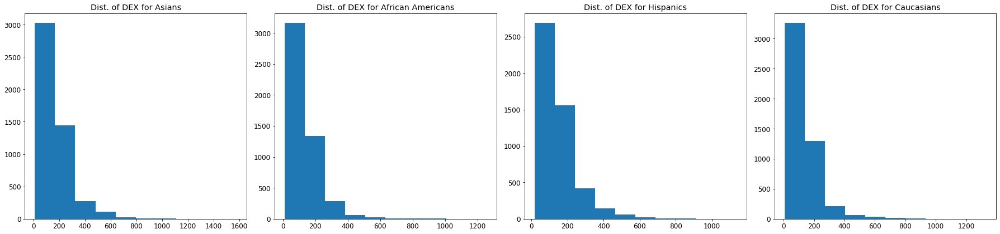

In [104]:
plt.figure(figsize=(25,6))

plt.subplot(1,4,1)
plt.hist(df_state['dex_race_asian_a'])
plt.title('Dist. of DEX for Asians')
  
plt.subplot(1,4,2)
plt.hist(df_state['dex_race_black_a'])
plt.title('Dist. of DEX for African Americans')

plt.subplot(1,4,3)
plt.hist(df_state['dex_race_hispanic'])
plt.title('Dist. of DEX for Hispanics')

plt.subplot(1,4,4)
plt.hist(df_state['dex_race_white_a'])
plt.title('Dist. of DEX for Caucasians')
  
plt.tight_layout()
plt.show()

In [105]:
#bar graphs of populations and number of phones by state, by income group, by education, and by race
df_by_state = df_state.groupby(df_state['state']).mean()
df_by_state.head(3)

,dex,num_devices,dex_a,num_devices_a,dex_income_1,num_devices_income_1,dex_income_1_a,num_devices_income_1_a,dex_income_2,num_devices_income_2,...,log_dex_income_4_a,log_dex_education_1_a,log_dex_education_2_a,log_dex_education_3_a,log_dex_education_4_a,log_dex_race_asian_a,log_dex_race_black_a,log_dex_race_hispanic_a,log_dex_race_white_a,weighted_avg_dex
state,,,,,,,,,,,,,,,,,,,,,
AK,94.095443,30397.041667,89.168069,33130.0,110.681616,791.802083,105.069064,855.0,95.696330,3674.552083,...,4.319916,4.200561,4.234200,4.271530,4.378876,4.331120,4.903167,4.388625,4.268054,0.124159
AL,132.813449,498310.166667,125.073784,537243.0,121.443047,130858.260417,113.754028,142098.0,135.621808,125024.270833,...,4.974540,4.617332,4.738001,4.870087,4.939156,4.958583,4.693237,4.808935,4.786148,2.824121
AR,130.875868,268148.833333,123.576767,287199.0,116.177688,73999.333333,108.683781,80338.0,138.530324,72965.875000,...,5.065530,4.563315,4.753551,4.913325,5.005211,4.915710,4.675373,4.771356,4.792584,1.491647


In [106]:
states_list

['MA', 'WA', 'NY', 'NJ', 'MI', 'FL', 'LA', 'TX', 'WY', 'AK', 'MT', 'GA', 'AR']

In [107]:
list_num_devices_a = []
for i in range (0, len(states_list)):
  list_num_devices_a.append(df_by_state.loc[states_list[i]]['num_devices_a'])

In [108]:
list_num_devices_a

[375375.0,
 458141.0,
 1035124.0,
 565246.0,
 749329.0,
 1851355.0,
 384749.0,
 2484430.0,
 40111.0,
 33130.0,
 63355.0,
 935281.0,
 287199.0]

In [109]:
list_num_devices = []
for i in range (0, len(states_list)):
  list_num_devices.append(df_by_state.loc[states_list[i]]['num_devices'])

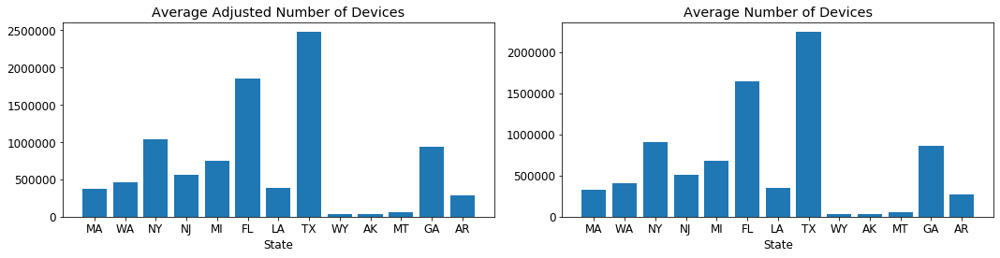

In [110]:
plt.figure(figsize=(15,4))

plt.subplot(1,2,1)
plt.bar(states_list, list_num_devices_a)
plt.title('Average Adjusted Number of Devices')
plt.xlabel('State')

plt.subplot(1,2,2)
plt.bar(states_list, list_num_devices)
plt.title('Average Number of Devices')
plt.xlabel('State')

plt.tight_layout()
plt.show()

There does not appear to be a significant difference in the relationships among states between the ajdusted and non adjusted number of devices.

##Feature Engineering

In order to cluster the data by state, the date feature was pivoted so that a feature column is created for each log transformed dex_a value for each date in the dataset.  This allowed for 'state' to be the index in the resulting dataset.

In [111]:
df_state.head(1)

,state,date,dex,num_devices,dex_a,num_devices_a,dex_income_1,num_devices_income_1,dex_income_1_a,num_devices_income_1_a,...,log_dex_income_4_a,log_dex_education_1_a,log_dex_education_2_a,log_dex_education_3_a,log_dex_education_4_a,log_dex_race_asian_a,log_dex_race_black_a,log_dex_race_hispanic_a,log_dex_race_white_a,weighted_avg_dex
0,AL,2020-01-20,169.3337,499012,157.2836,537243,139.8325,133839,131.7052,142098,...,5.612395,4.880659,5.032555,5.283135,5.5469,5.480933,5.0119,5.206867,5.177404,3.551407


In [112]:
new_df = df_state[['state', 'date','log_dex_a', 'log_dex_income_1_a', 'log_dex_income_2_a',	'log_dex_income_3_a',	'log_dex_income_4_a',	'log_dex_education_1_a',	'log_dex_education_2_a',	'log_dex_education_3_a',	'log_dex_education_4_a',	'log_dex_race_asian_a',	'log_dex_race_black_a',	'log_dex_race_hispanic_a',	'log_dex_race_white_a']]
new_df.head()

,state,date,log_dex_a,log_dex_income_1_a,log_dex_income_2_a,log_dex_income_3_a,log_dex_income_4_a,log_dex_education_1_a,log_dex_education_2_a,log_dex_education_3_a,log_dex_education_4_a,log_dex_race_asian_a,log_dex_race_black_a,log_dex_race_hispanic_a,log_dex_race_white_a
0,AL,2020-01-20,5.058051,4.880566,5.048855,5.295143,5.612395,4.880659,5.032555,5.283135,5.546900,5.480933,5.011900,5.206867,5.177404
1,AL,2020-01-21,4.788753,4.666240,4.774924,4.959404,5.236109,4.599805,4.764118,4.976946,5.235839,5.244673,4.785118,4.921994,4.867726
2,AL,2020-01-22,4.808601,4.699238,4.800582,4.988395,5.240657,4.639781,4.795962,5.005075,5.231932,5.221759,4.801024,4.939959,4.896614
3,AL,2020-01-23,4.857355,4.723172,4.836074,5.051832,5.302019,4.680622,4.829467,5.046809,5.297304,5.299820,4.858979,4.992358,4.936669
4,AL,2020-01-24,5.263665,5.154977,5.289592,5.458335,5.688963,5.138806,5.286742,5.450304,5.650317,5.623470,5.249960,5.376084,5.369582


In [113]:
new_df = new_df.pivot(index='state', columns='date')

In [114]:
new_df.head()

log_dex_a                                                         \
date  2020-01-20 2020-01-21 2020-01-22 2020-01-23 2020-01-24 2020-01-25   
state                                                                     
AK      4.860925   4.848196   4.810217   4.849032   4.954534   4.728306   
AL      5.058051   4.788753   4.808601   4.857355   5.263665   5.304136   
AR      4.991887   4.804184   4.705548   4.911615   5.187447   5.283061   
AZ      4.986519   4.810561   4.843896   4.929229   5.161827   5.157312   
CA      5.143645   4.905920   4.886996   5.018775   5.169887   5.130966   

                                                   ... log_dex_race_white_a  \
date  2020-01-26 2020-01-27 2020-01-28 2020-01-29  ...           2020-04-15   
state                                              ...                        
AK      4.596249   4.739355   4.795084   4.725887  ...             3.062755   
AL      4.832206   4.817425   4.787673   4.801905  ...             4.107539   
AR      4.799513   4.848410   4.768557   4.838901  ...             4.188736   
AZ      4.923845   4.862499   4.827862   4.878321  ...             3.341854   
CA      5.026655   4.953168   4.826711   4.882710  ...             2.641946   

                                                                         \
date  2020-04-16 2020-04-17 2020-04-18 2020-04-19 2020-04-20 2020-04-21   
state                                                                     
AK      2.952913   3.072207   3.637983   3.414295   3.288059   3.370697   
AL      4.079292   4.318069   4.503027   3.710240   4.234419   4.284809   
AR      4.184848   4.355744   4.656015   4.028691   4.319716   4.399528   
AZ      3.310061   3.509696   4.161955   3.927252   3.607056   3.708393   
CA      2.628357   2.795731   3.358433   3.191394   2.860102   2.989956   

                                        
date  2020-04-22 2020-04-23 2020-04-24  
state                                   
AK      3.312719   3.291673   3.521853  
AL      4.283741   4.105482   4.640643  
AR      4.129919   4.411206   4.681235  
AZ      3.698847   3.733975   3.965262  
CA      2.998324   3.014480   3.229230  

[5 rows x 1248 columns]

In [115]:
new_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 51 entries, AK to WY
Columns: 1248 entries, ('log_dex_a', Timestamp('2020-01-20 00:00:00')) to ('log_dex_race_white_a', Timestamp('2020-04-24 00:00:00'))
dtypes: float64(1248)
memory usage: 497.6+ KB


In [116]:
new_df.index

Index(['AK', 'AL', 'AR', 'AZ', 'CA', 'CO', 'CT', 'DC', 'DE', 'FL', 'GA', 'HI',
       'IA', 'ID', 'IL', 'IN', 'KS', 'KY', 'LA', 'MA', 'MD', 'ME', 'MI', 'MN',
       'MO', 'MS', 'MT', 'NC', 'ND', 'NE', 'NH', 'NJ', 'NM', 'NV', 'NY', 'OH',
       'OK', 'OR', 'PA', 'RI', 'SC', 'SD', 'TN', 'TX', 'UT', 'VA', 'VT', 'WA',
       'WI', 'WV', 'WY'],
      dtype='object', name='state')

##Hopkins Test
I performed a Hopkins test to confirm that the data is likely to exhibit clsuters.The closer the value to 1, the higher the likelihood of clusters.

In [117]:
from sklearn.neighbors import NearestNeighbors
from random import sample
from numpy.random import uniform
import numpy as np
from math import isnan
 
def hopkins(X):
    d = X.shape[1]
    #d = len(vars) # columns
    n = len(X) # rows
    m = int(0.1 * n) # heuristic from article [1]
    nbrs = NearestNeighbors(n_neighbors=1).fit(X.values)
 
    rand_X = sample(range(0, n, 1), m)
 
    ujd = []
    wjd = []
    for j in range(0, m):
        u_dist, _ = nbrs.kneighbors(uniform(np.amin(X,axis=0),np.amax(X,axis=0),d).reshape(1, -1), 2, return_distance=True)
        ujd.append(u_dist[0][1])
        w_dist, _ = nbrs.kneighbors(X.iloc[rand_X[j]].values.reshape(1, -1), 2, return_distance=True)
        wjd.append(w_dist[0][1])
 
    H = sum(ujd) / (sum(ujd) + sum(wjd))
    if isnan(H):
        print(ujd, wjd)
        H = 0
 
    return H

#https://matevzkunaver.wordpress.com/2017/06/20/hopkins-test-for-cluster-tendency/

In [118]:
hopkins(new_df)

0.840172828579122

Since the Hopkins Statistic is close to 1, it can be confirmed that the dataset does naturally form clusters.

### K Means Clustering

In [119]:
X = new_df

scaler = StandardScaler()
X_std = scaler.fit_transform(X)

n = 10
kmeans_cluster = KMeans(n_clusters=n, random_state=123)
%timeit kmeans_cluster.fit(X_std)
clusters = kmeans_cluster.predict(X_std)

print('{} Clusters'.format(n))
print('Silhouette Score:  {}'.format(metrics.silhouette_score(X_std, clusters, metric='euclidean')))
print('Calinkski-Harabasz Score:  {}'.format(metrics.calinski_harabasz_score(X_std, clusters)))
print('Davies_Bouldin_Score:  {}'.format(metrics.davies_bouldin_score(X_std, clusters)))

#The davies score is defined as the average similarity measure of each cluster with its most similar cluster, where similarity is the ratio of within-cluster distances to between-cluster distances. 
#Clusters which are farther apart and less dispersed will result in a better score.
#The minimum score is zero, with lower values indicating better clustering

103 ms ± 5.85 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
10 Clusters
Silhouette Score:  0.2285840163485811
Calinkski-Harabasz Score:  23.00692767118954
Davies_Bouldin_Score:  1.0020517077640987


In [120]:
n = 5
kmeans_cluster = KMeans(n_clusters=n, random_state=123)
%timeit kmeans_cluster.fit(X_std)
clusters = kmeans_cluster.predict(X_std)

print('{} Clusters'.format(n))
print('Silhouette Score:  {}'.format(metrics.silhouette_score(X_std, clusters, metric='euclidean')))
print('Calinkski-Harabasz Score:  {}'.format(metrics.calinski_harabasz_score(X_std, clusters)))
print('Davies_Bouldin_Score:  {}'.format(metrics.davies_bouldin_score(X_std, clusters)))

105 ms ± 22.1 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)
5 Clusters
Silhouette Score:  0.35574545297263777
Calinkski-Harabasz Score:  29.316983499490615
Davies_Bouldin_Score:  0.8705454193199211


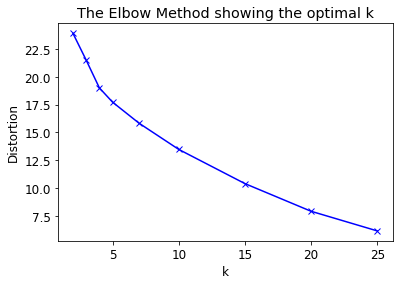

In [121]:
#determine k using elbow method

#k means determine k
distortions = []
K = (2, 3, 4, 5, 7, 10, 15, 20, 25)
for k in K:
    kmeanModel = KMeans(n_clusters=k).fit(X_std)
    kmeanModel.fit(X_std)
    distortions.append(sum(np.min(cdist(X_std, kmeanModel.cluster_centers_, 'euclidean'), axis=1)) / X_std.shape[0])

#Plot the elbow
plt.plot(K, distortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.show()


It looks as though the best value for k is 4

In [122]:
n = 4
kmeans_cluster = KMeans(n_clusters=n, random_state=123)
%timeit kmeans_cluster.fit(X_std)
clusters = kmeans_cluster.predict(X_std)

print('{} Clusters'.format(n))
print('Silhouette Score:  {}'.format(metrics.silhouette_score(X_std, clusters, metric='euclidean')))
print('Calinkski-Harabasz Score:  {}'.format(metrics.calinski_harabasz_score(X_std, clusters)))
print('Davies_Bouldin_Score:  {}'.format(metrics.davies_bouldin_score(X_std, clusters)))

69.4 ms ± 7.71 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)
4 Clusters
Silhouette Score:  0.33515551459322324
Calinkski-Harabasz Score:  30.96849777737439
Davies_Bouldin_Score:  0.9190968844967301


In [123]:
#print number of members in each cluster for above model
unique, counts = np.unique(clusters, return_counts=True)
print(np.asarray((unique, counts)).T)

[[ 0 19]
 [ 1 24]
 [ 2  6]
 [ 3  2]]


In [124]:
X_pca = PCA(2).fit_transform(X_std)

In [125]:
plt.figure(figsize=(2, 1))
colours = ['r', 'b', 'g', 'c', 'm','y','goldenrod','k','C1', 'C2']
for i in range (X_pca.shape[0]):
  plt.text(X_pca[i,0], X_pca[i,1], str(clusters[i]),
           color = colours[int(clusters[i])],
           fontdict = {'weight':'bold', 'size':200}
           )
plt.xticks([])
plt.yticks([])
plt.show()

# Hierarchical Clustering

In [126]:
n = 4
agg_cluster=AgglomerativeClustering(linkage='complete', affinity='cosine', n_clusters=n)
%timeit clusters = agg_cluster.fit_predict(X_std)

print('{} Clusters'.format(n))
print('Silhouette Score:  {}'.format(metrics.silhouette_score(X_std, clusters, metric='euclidean')))
print('Calinkski-Harabasz Score:  {}'.format(metrics.calinski_harabasz_score(X_std, clusters)))
print('Davies_Bouldin_Score:  {}'.format(metrics.davies_bouldin_score(X_std, clusters)))

3.14 ms ± 131 µs per loop (mean ± std. dev. of 7 runs, 100 loops each)
4 Clusters
Silhouette Score:  0.33515551459322324
Calinkski-Harabasz Score:  30.96849777737439
Davies_Bouldin_Score:  0.9190968844967301


In [127]:
#print number of members in each cluster for above model
unique, counts = np.unique(clusters, return_counts=True)
print(np.asarray((unique, counts)).T)

[[ 0 19]
 [ 1 24]
 [ 2  6]
 [ 3  2]]


In [128]:
n=4

agg_cluster=AgglomerativeClustering(linkage='complete', affinity='euclidean', n_clusters=n)
clusters = agg_cluster.fit_predict(X_std)

print('{} Clusters'.format(n))
print('Silhouette Score:  {}'.format(metrics.silhouette_score(X_std, clusters, metric='euclidean')))
print('Calinkski-Harabasz Score:  {}'.format(metrics.calinski_harabasz_score(X_std, clusters)))
print('Davies_Bouldin_Score:  {}'.format(metrics.davies_bouldin_score(X_std, clusters)))

4 Clusters
Silhouette Score:  0.26340257438234077
Calinkski-Harabasz Score:  23.96331969351797
Davies_Bouldin_Score:  0.99637276277848


In [129]:
n=4

agg_cluster=AgglomerativeClustering(linkage='complete', affinity='manhattan', n_clusters=n)
clusters = agg_cluster.fit_predict(X_std)

print('{} Clusters'.format(n))
print('Silhouette Score:  {}'.format(metrics.silhouette_score(X_std, clusters, metric='euclidean')))
print('Calinkski-Harabasz Score:  {}'.format(metrics.calinski_harabasz_score(X_std, clusters)))
print('Davies_Bouldin_Score:  {}'.format(metrics.davies_bouldin_score(X_std, clusters)))

4 Clusters
Silhouette Score:  0.26407069907500264
Calinkski-Harabasz Score:  26.5495520713253
Davies_Bouldin_Score:  1.110350005073038


In [130]:
n=4

agg_cluster=AgglomerativeClustering(linkage='ward', affinity='euclidean', n_clusters=n)
clusters = agg_cluster.fit_predict(X_std)
print('{} Clusters'.format(n))
print('Silhouette Score:  {}'.format(metrics.silhouette_score(X_std, clusters, metric='euclidean')))
print('Calinkski-Harabasz Score:  {}'.format(metrics.calinski_harabasz_score(X_std, clusters)))
print('Davies_Bouldin_Score:  {}'.format(metrics.davies_bouldin_score(X_std, clusters)))

4 Clusters
Silhouette Score:  0.3013124599674042
Calinkski-Harabasz Score:  26.522925664437185
Davies_Bouldin_Score:  0.984197314679861


Hierarchical Clustering performs very similarly to K Means clustering.

# DBSCAN

In [131]:
n = 4 

dbscan_cluster = DBSCAN(eps=.27, min_samples = n)
clusters = dbscan_cluster.fit_predict(X_std)

unique, counts = np.unique(clusters, return_counts=True)
print(np.asarray((unique, counts)).T)

[[-1 51]]


In [132]:
n = 15

dbscan_cluster = DBSCAN(eps=.27, min_samples = 15)
clusters = dbscan_cluster.fit_predict(X_std)

unique, counts = np.unique(clusters, return_counts=True)
print(np.asarray((unique, counts)).T)

[[-1 51]]


In [133]:
n = 2
dbscan_cluster = DBSCAN(eps=.1, min_samples = n)
clusters = dbscan_cluster.fit_predict(X_std)

unique, counts = np.unique(clusters, return_counts=True)
print(np.asarray((unique, counts)).T)

[[-1 51]]


In [134]:
n = 2

dbscan_cluster = DBSCAN(eps=.05, min_samples = n)
clusters = dbscan_cluster.fit_predict(X_std)

unique, counts = np.unique(clusters, return_counts=True)
print(np.asarray((unique, counts)).T)

[[-1 51]]


In [135]:
n = 2

dbscan_cluster = DBSCAN(eps=1.0, min_samples = n)
clusters = dbscan_cluster.fit_predict(X_std)

unique, counts = np.unique(clusters, return_counts=True)
print(np.asarray((unique, counts)).T)

[[-1 51]]


DBSCAN does not find any clusters, even after tuning epsilon and the minimum number of members per cluster.

#Dimensionality Reduction for Visualizations

# Dimensionality Reduction for Visualization

In [136]:
#rerun KMeans clusterin with 4 clusters

n = 4
kmeans_cluster = KMeans(n_clusters=n, random_state=123)
%timeit kmeans_cluster.fit(X_std)
clusters = kmeans_cluster.predict(X_std)

print('{} Clusters'.format(n))
print('Silhouette Score:  {}'.format(metrics.silhouette_score(X_std, clusters, metric='euclidean')))
print('Calinkski-Harabasz Score:  {}'.format(metrics.calinski_harabasz_score(X_std, clusters)))
print('Davies_Bouldin_Score:  {}'.format(metrics.davies_bouldin_score(X_std, clusters)))

81 ms ± 12.6 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)
4 Clusters
Silhouette Score:  0.33515551459322324
Calinkski-Harabasz Score:  30.96849777737439
Davies_Bouldin_Score:  0.9190968844967301


In [137]:
import time

time_start = time.time()
tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)
tsne_results = tsne.fit_transform(X_std)

[t-SNE] Computing 50 nearest neighbors...
[t-SNE] Indexed 51 samples in 0.000s...
[t-SNE] Computed neighbors for 51 samples in 0.004s...
[t-SNE] Computed conditional probabilities for sample 51 / 51
[t-SNE] Mean sigma: 38.190672
[t-SNE] KL divergence after 250 iterations with early exaggeration: 49.335732
[t-SNE] KL divergence after 300 iterations: 0.719639


In [138]:
colours = ['r', 'b', 'g', 'k']
plt.figure(figsize=(2, 1))
for i in range (tsne_results.shape[0]):
  plt.text(tsne_results[i,0], tsne_results[i,1], str(clusters[i]), 
               color=colours[int(clusters[i])],
               fontdict={'weight':'bold', 'size':100}
               )
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

In [139]:
#tuning tsne by reducing perplexity due to the relatively small size of the dataset

time_start = time.time()
tsne = TSNE(n_components=2, verbose=1, perplexity=20, n_iter=300)
tsne_results = tsne.fit_transform(X)

[t-SNE] Computing 50 nearest neighbors...
[t-SNE] Indexed 51 samples in 0.000s...
[t-SNE] Computed neighbors for 51 samples in 0.004s...
[t-SNE] Computed conditional probabilities for sample 51 / 51
[t-SNE] Mean sigma: 8.950564
[t-SNE] KL divergence after 250 iterations with early exaggeration: 52.793938
[t-SNE] KL divergence after 300 iterations: 1.044384


In [140]:
colours = ['r', 'b', 'g', 'k']
plt.figure(figsize=(2, 1))
for i in range (tsne_results.shape[0]):
  plt.text(tsne_results[i,0], tsne_results[i,1], str(clusters[i]), 
               color=colours[int(clusters[i])],
               fontdict={'weight':'bold', 'size':100}
               )
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

In [141]:
time_start = time.time()
tsne = TSNE(n_components=2, verbose=1, perplexity=10, n_iter=300)
tsne_results = tsne.fit_transform(X)

[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 51 samples in 0.000s...
[t-SNE] Computed neighbors for 51 samples in 0.000s...
[t-SNE] Computed conditional probabilities for sample 51 / 51
[t-SNE] Mean sigma: 5.778387
[t-SNE] KL divergence after 250 iterations with early exaggeration: 61.766125
[t-SNE] KL divergence after 300 iterations: 1.738479


In [142]:
colours = ['r', 'b', 'g', 'k']
plt.figure(figsize=(2, 1))
for i in range (tsne_results.shape[0]):
  plt.text(tsne_results[i,0], tsne_results[i,1], str(clusters[i]), 
               color=colours[int(clusters[i])],
               fontdict={'weight':'bold', 'size':300}
               )
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

##UMAP


In [143]:
!conda install -c conda-forge umap-learn -y

Solving environment: ...working... done

## Package Plan ##

  environment location: C:\Users\t4tri\anaconda3

  added / updated specs:
    - umap-learn


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    umap-learn-0.4.2           |   py37hc8dfbb8_0         108 KB  conda-forge
    ------------------------------------------------------------
                                           Total:         108 KB

The following NEW packages will be INSTALLED:

  python_abi         conda-forge/win-64::python_abi-3.7-1_cp37m
  umap-learn         conda-forge/win-64::umap-learn-0.4.2-py37hc8dfbb8_0

The following packages will be UPDATED:

  conda                       pkgs/main::conda-4.8.3-py37_0 --> conda-forge::conda-4.8.3-py37hc8dfbb8_1




umap-learn-0.4.2     | 108 KB    |            |   0% 
umap-learn-0.4.2     | 108 KB    | #4         |  15% 
umap-learn-0.4.2     | 108 KB    | ####4      |  4

In [144]:
import umap

In [145]:
time_start = time.time()
umap_result = umap.UMAP(n_neighbors=5, min_dist=.3, metric='correlation').fit_transform(X_std)

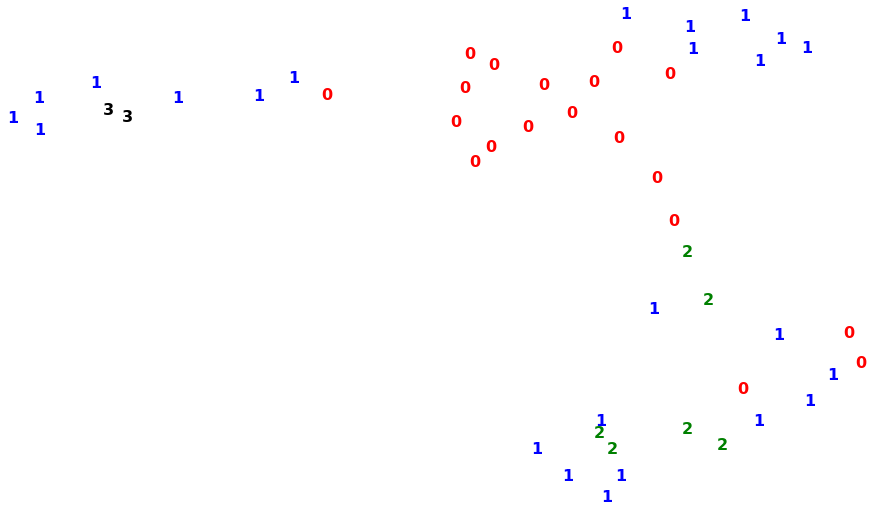

In [146]:
colours = ['r', 'b', 'g', 'k']
plt.figure(figsize=(2, 1))
for i in range (umap_result.shape[0]):
  plt.text(umap_result[i,0], umap_result[i,1], str(clusters[i]), 
               color=colours[int(clusters[i])],
               fontdict={'weight':'bold', 'size':16}
               )
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

In [147]:
time_start = time.time()
umap_result = umap.UMAP(n_neighbors=10, min_dist=.3, metric='correlation').fit_transform(X_std)

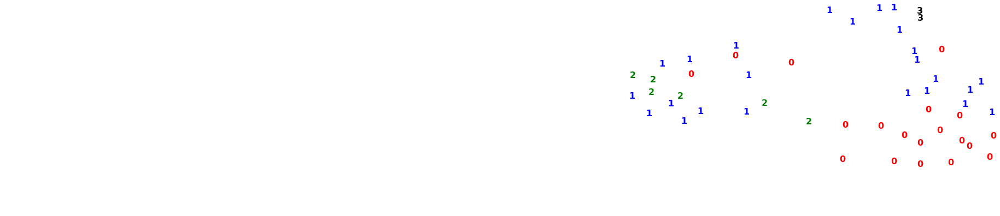

In [148]:
colours = ['r', 'b', 'g', 'k']
plt.figure(figsize=(2, 1))
for i in range (tsne_results.shape[0]):
  plt.text(umap_result[i,0], umap_result[i,1], str(clusters[i]), 
               color=colours[int(clusters[i])],
               fontdict={'weight':'bold', 'size':16}
               )
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

In [149]:
time_start = time.time()
umap_result = umap.UMAP(n_neighbors=15, min_dist=.3, metric='correlation').fit_transform(X_std)

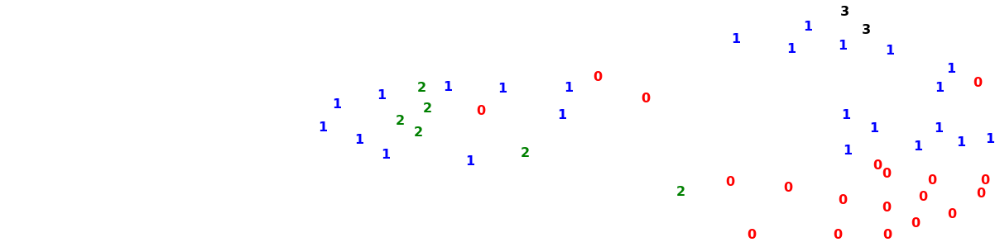

In [150]:
colours = ['r', 'b', 'g', 'k']
plt.figure(figsize=(2, 1))
for i in range (tsne_results.shape[0]):
  plt.text(umap_result[i,0], umap_result[i,1], str(clusters[i]), 
               color=colours[int(clusters[i])],
               fontdict={'weight':'bold', 'size':16}
               )
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

UMAP with a minimumn of 10 neighbors per cluster and minimum distance of 0.3 appears to be the best method for visualizing four clusters in the data.

# Clusters Exploration


In [151]:
#add clusters to dataframe
new_df['cluster'] = clusters
new_df.head()

log_dex_a                                          \
date  2020-01-20 00:00:00 2020-01-21 00:00:00 2020-01-22 00:00:00   
state                                                               
AK               4.860925            4.848196            4.810217   
AL               5.058051            4.788753            4.808601   
AR               4.991887            4.804184            4.705548   
AZ               4.986519            4.810561            4.843896   
CA               5.143645            4.905920            4.886996   

                                                                   \
date  2020-01-23 00:00:00 2020-01-24 00:00:00 2020-01-25 00:00:00   
state                                                               
AK               4.849032            4.954534            4.728306   
AL               4.857355            5.263665            5.304136   
AR               4.911615            5.187447            5.283061   
AZ               4.929229            5.161827            5.157312   
CA               5.018775            5.169887            5.130966   

                                                                   \
date  2020-01-26 00:00:00 2020-01-27 00:00:00 2020-01-28 00:00:00   
state                                                               
AK               4.596249            4.739355            4.795084   
AL               4.832206            4.817425            4.787673   
AR               4.799513            4.848410            4.768557   
AZ               4.923845            4.862499            4.827862   
CA               5.026655            4.953168            4.826711   

                           ... log_dex_race_white_a                      \
date  2020-01-29 00:00:00  ...  2020-04-16 00:00:00 2020-04-17 00:00:00   
state                      ...                                            
AK               4.725887  ...             2.952913            3.072207   
AL               4.801905  ...             4.079292            4.318069   
AR               4.838901  ...             4.184848            4.355744   
AZ               4.878321  ...             3.310061            3.509696   
CA               4.882710  ...             2.628357            2.795731   

                                                                   \
date  2020-04-18 00:00:00 2020-04-19 00:00:00 2020-04-20 00:00:00   
state                                                               
AK               3.637983            3.414295            3.288059   
AL               4.503027            3.710240            4.234419   
AR               4.656015            4.028691            4.319716   
AZ               4.161955            3.927252            3.607056   
CA               3.358433            3.191394            2.860102   

                                                                   \
date  2020-04-21 00:00:00 2020-04-22 00:00:00 2020-04-23 00:00:00   
state                                                               
AK               3.370697            3.312719            3.291673   
AL               4.284809            4.283741            4.105482   
AR               4.399528            4.129919            4.411206   
AZ               3.708393            3.698847            3.733975   
CA               2.989956            2.998324            3.014480   

                          cluster  
date  2020-04-24 00:00:00          
state                              
AK               3.521853       1  
AL               4.640643       0  
AR               4.681235       0  
AZ               3.965262       0  
CA               3.229230       1  

[5 rows x 1249 columns]

In [152]:
#create separate dataframe for each cluster
cluster_df = []
for i in range(0,4):
  cluster_df.append('cluster_df_'+str(i))

In [153]:
for i in range(0,4):
  cluster_df[i] = new_df.loc[new_df['cluster']==i]

In [154]:
cluster_1_states = list(cluster_df[0].index)
cluster_2_states = list(cluster_df[1].index)
cluster_3_states = list(cluster_df[2].index)
cluster_4_states = list(cluster_df[3].index)

In [155]:
print('Cluster 1: {}'.format(cluster_1_states))
print('Cluster 2: {}'.format(cluster_2_states))
print('Cluster 3: {}'.format(cluster_3_states))
print('Cluster 4: {}'.format(cluster_4_states))

Cluster 1: ['AL', 'AR', 'AZ', 'CO', 'DE', 'GA', 'KY', 'LA', 'MD', 'MO', 'MS', 'MT', 'NC', 'OH', 'OK', 'SC', 'TN', 'UT', 'VA']
Cluster 2: ['AK', 'CA', 'CT', 'DC', 'IA', 'ID', 'IL', 'IN', 'KS', 'MA', 'MI', 'MN', 'ND', 'NE', 'NH', 'NM', 'OR', 'PA', 'RI', 'SD', 'WA', 'WI', 'WV', 'WY']
Cluster 3: ['FL', 'HI', 'NJ', 'NV', 'NY', 'TX']
Cluster 4: ['ME', 'VT']


In [156]:
#add assigned cluster number to df_state
def create_cluster(x):		
  if x in cluster_1_states:		
    return 1	
  elif x in cluster_2_states:		
    return 2	
  elif x in cluster_3_states:		
    return 3	
  elif x in cluster_4_states:		
    return 4
  else:		
    return 'Other Cluster'	
		
df_state['Cluster'] = df_state['state'].map(lambda x: create_cluster(x))		
df_state.head()	

,state,date,dex,num_devices,dex_a,num_devices_a,dex_income_1,num_devices_income_1,dex_income_1_a,num_devices_income_1_a,...,log_dex_education_1_a,log_dex_education_2_a,log_dex_education_3_a,log_dex_education_4_a,log_dex_race_asian_a,log_dex_race_black_a,log_dex_race_hispanic_a,log_dex_race_white_a,weighted_avg_dex,Cluster
0,AL,2020-01-20,169.3337,499012,157.2836,537243,139.8325,133839,131.7052,142098,...,4.880659,5.032555,5.283135,5.546900,5.480933,5.011900,5.206867,5.177404,3.551407,1
1,AL,2020-01-21,126.4763,510377,120.1515,537243,110.7451,136391,106.2973,142098,...,4.599805,4.764118,4.976946,5.235839,5.244673,4.785118,4.921994,4.867726,2.712977,1
2,AL,2020-01-22,128.5769,512102,122.5600,537243,114.1824,136723,109.8634,142098,...,4.639781,4.795962,5.005075,5.231932,5.221759,4.801024,4.939959,4.896614,2.767360,1
3,AL,2020-01-23,133.4260,518147,128.6834,537243,115.6048,138312,112.5246,142098,...,4.680622,4.829467,5.046809,5.297304,5.299820,4.858979,4.992358,4.936669,2.905625,1
4,AL,2020-01-24,201.3351,515504,193.1883,537243,178.2221,138167,173.2918,142098,...,5.138806,5.286742,5.450304,5.650317,5.623470,5.249960,5.376084,5.369582,4.362122,1


In [157]:
#add region for refrence 
def create_regions(x):		
  if x in ['ME', 'CT', 'MA', 'RI', 'NH', 'VT']:		
    return 'New England'	
  elif x in ['AL', 'KY', 'MI', 'TN']:		
    return 'East South Central'	
  elif x in ['NJ', 'NY', 'PN']:		
    return 'Mid Atlantic'	
  elif x in ['IN', 'IL', 'MI', 'OH', 'WI']:		
    return 'East North Central'	
  elif x in ['IA', 'KS', 'MN', 'MO', 'NE', 'ND', 'SD']:		
    return 'West North Central'	
  elif x in ['DE', 'DC', 'FL', 'GA', 'ML', 'NC', 'SC', 'VI', 'WV']:		
    return 'South Atlantic'	
  elif x in ['AK', 'LA', 'OK', 'TX']:		
    return 'West South Central'	
  elif x in ['AZ', 'CO', 'ID', 'NM', 'MT', 'UT', 'NV', 'WY']:		
    return 'Mountain'	
  elif x in ['AK', 'CA', 'HI', 'OR', 'WA']:		
    return 'Pacific'	
  else:		
    return 'Other Region'	
		
df_state['REGION'] = df_state['state'].map(lambda x: create_regions(x))		
df_state.head()		

,state,date,dex,num_devices,dex_a,num_devices_a,dex_income_1,num_devices_income_1,dex_income_1_a,num_devices_income_1_a,...,log_dex_education_2_a,log_dex_education_3_a,log_dex_education_4_a,log_dex_race_asian_a,log_dex_race_black_a,log_dex_race_hispanic_a,log_dex_race_white_a,weighted_avg_dex,Cluster,REGION
0,AL,2020-01-20,169.3337,499012,157.2836,537243,139.8325,133839,131.7052,142098,...,5.032555,5.283135,5.546900,5.480933,5.011900,5.206867,5.177404,3.551407,1,East South Central
1,AL,2020-01-21,126.4763,510377,120.1515,537243,110.7451,136391,106.2973,142098,...,4.764118,4.976946,5.235839,5.244673,4.785118,4.921994,4.867726,2.712977,1,East South Central
2,AL,2020-01-22,128.5769,512102,122.5600,537243,114.1824,136723,109.8634,142098,...,4.795962,5.005075,5.231932,5.221759,4.801024,4.939959,4.896614,2.767360,1,East South Central
3,AL,2020-01-23,133.4260,518147,128.6834,537243,115.6048,138312,112.5246,142098,...,4.829467,5.046809,5.297304,5.299820,4.858979,4.992358,4.936669,2.905625,1,East South Central
4,AL,2020-01-24,201.3351,515504,193.1883,537243,178.2221,138167,173.2918,142098,...,5.286742,5.450304,5.650317,5.623470,5.249960,5.376084,5.369582,4.362122,1,East South Central


In [158]:
df_by_clusters = df_state.groupby('Cluster').mean()
df_by_clusters

,dex,num_devices,dex_a,num_devices_a,dex_income_1,num_devices_income_1,dex_income_1_a,num_devices_income_1_a,dex_income_2,num_devices_income_2,...,log_dex_income_4_a,log_dex_education_1_a,log_dex_education_2_a,log_dex_education_3_a,log_dex_education_4_a,log_dex_race_asian_a,log_dex_race_black_a,log_dex_race_hispanic_a,log_dex_race_white_a,weighted_avg_dex
Cluster,,,,,,,,,,,,,,,,,,,,,
1,131.767412,422760.436404,123.041217,4.632454e+05,115.615524,83107.059211,106.338117,92234.631579,126.904345,91243.430921,...,4.936638,4.524888,4.647854,4.785869,4.888996,4.889078,4.697964,4.785189,4.717267,2.434963
2,89.809504,322174.013889,82.595521,3.591762e+05,87.769718,40458.660590,79.753153,46123.500000,86.207832,59816.784288,...,4.412546,4.109764,4.162024,4.298743,4.408635,4.468441,4.430366,4.299501,4.248624,1.325253
3,262.054718,923024.180556,245.659591,1.033816e+06,230.675044,139338.869792,213.827264,157907.666667,246.506019,166763.362847,...,5.244627,4.954791,5.039082,5.143473,5.231995,5.269410,5.051560,5.134064,5.069156,9.536152
4,33.628382,50719.916667,30.795230,5.699850e+04,34.028932,6522.177083,31.260097,7240.500000,32.933134,11720.927083,...,3.326388,3.333400,3.271194,3.283631,3.324256,4.999778,4.693294,4.971337,3.296090,0.077854


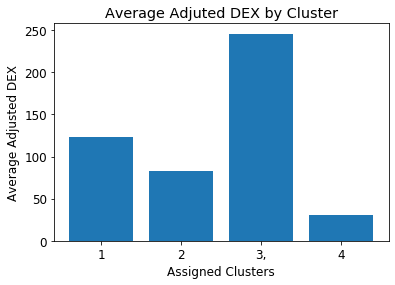

In [159]:

plt.rcParams.update({'font.size': 12})
plt.bar(df_by_clusters.index, df_by_clusters['dex_a'])
plt.xticks(df_by_clusters.index,('1', '2', '3,', '4'))
plt.xlabel('Assigned Clusters')
plt.ylabel('Average Adjusted DEX')
plt.title('Average Adjuted DEX by Cluster')
plt.show()

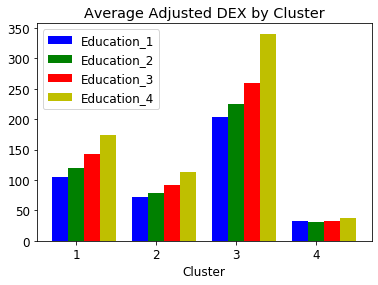

In [160]:
#Plot average dex_a for each educational group for each cluster

plt.rcParams.update({'font.size': 12})

x = df_by_clusters.index
y = df_by_clusters.dex_education_1_a
z = df_by_clusters.dex_education_2_a
k = df_by_clusters.dex_education_3_a
j = df_by_clusters.dex_education_4_a

ax = plt.subplot(111)
ax.bar(x-0.2, y, width=0.2, color='b', align='center')
ax.bar(x, z, width=0.2, color='g', align='center')
ax.bar(x+0.2, k, width=0.2, color='r', align='center')
ax.bar(x+0.4, j, width=0.2, color='y', align='center')
plt.xticks(x, ('1', '2', '3', '4'))			

plt.legend(['Education_1', 'Education_2', 'Education_3', 'Education_4'])
plt.title('Average Adjusted DEX by Cluster')
plt.xlabel('Cluster')
plt.show()



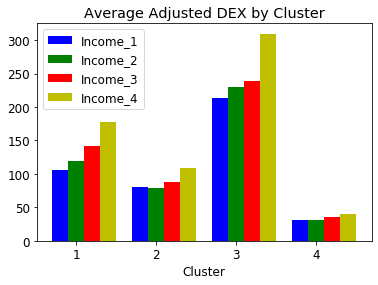

In [161]:
#Plot Adjusted DEX for Income Groups for each Cluster
plt.rcParams.update({'font.size': 12})

x = df_by_clusters.index
y = df_by_clusters.dex_income_1_a
z = df_by_clusters.dex_income_2_a
k = df_by_clusters.dex_income_3_a
j = df_by_clusters.dex_income_4_a

ax = plt.subplot(111)
ax.bar(x-0.2, y, width=0.2, color='b', align='center')
ax.bar(x, z, width=0.2, color='g', align='center')
ax.bar(x+0.2, k, width=0.2, color='r', align='center')
ax.bar(x+0.4, j, width=0.2, color='y', align='center')
plt.xticks(x, ('1', '2', '3', '4'))			

plt.legend(['Income_1', 'Income_2', 'Income_3', 'Income_4'])
plt.title('Average Adjusted DEX by Cluster')
plt.xlabel('Cluster')
plt.show()


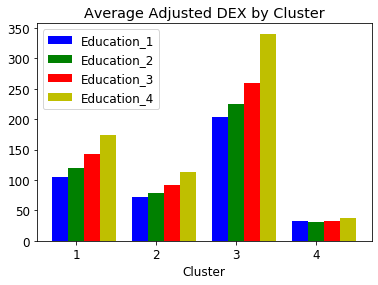

In [162]:
#Plot Adjusted DEX for educational Groups for each Cluster.
plt.rcParams.update({'font.size': 12})

x = df_by_clusters.index
y = df_by_clusters.dex_education_1_a
z = df_by_clusters.dex_education_2_a
k = df_by_clusters.dex_education_3_a
j = df_by_clusters.dex_education_4_a

ax = plt.subplot(111)
ax.bar(x-0.2, y, width=0.2, color='b', align='center')
ax.bar(x, z, width=0.2, color='g', align='center')
ax.bar(x+0.2, k, width=0.2, color='r', align='center')
ax.bar(x+0.4, j, width=0.2, color='y', align='center')
plt.xticks(x, ('1', '2', '3', '4'))			

plt.legend(['Education_1', 'Education_2', 'Education_3', 'Education_4'])
plt.title('Average Adjusted DEX by Cluster')
plt.xlabel('Cluster')
plt.show()

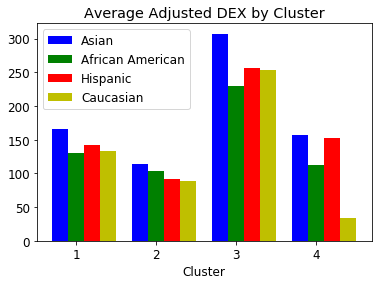

In [163]:
#Plot Adjusted DEX for Racial Groups for each Cluster.
plt.rcParams.update({'font.size': 12})

x = df_by_clusters.index
y = df_by_clusters.dex_race_asian_a
z = df_by_clusters.dex_race_black_a
k = df_by_clusters.dex_race_hispanic_a
j = df_by_clusters.dex_race_white_a

ax = plt.subplot(111)
ax.bar(x-0.2, y, width=0.2, color='b', align='center')
ax.bar(x, z, width=0.2, color='g', align='center')
ax.bar(x+0.2, k, width=0.2, color='r', align='center')
ax.bar(x+0.4, j, width=0.2, color='y', align='center')
plt.xticks(x, ('1', '2', '3', '4'))			

plt.legend(['Asian', 'African American', 'Hispanic', 'Caucasian'])
plt.title('Average Adjusted DEX by Cluster')
plt.xlabel('Cluster')
plt.show()

In [164]:
state_cluster_df = []
for i in range(0,5):
  state_cluster_df.append('state_cluster_df_'+str(i))

for i in range(0,5):
  state_cluster_df[i] = df_state.loc[df_state['Cluster']==i]

In [165]:
state_cluster_df[1].describe()

,dex,num_devices,dex_a,num_devices_a,dex_income_1,num_devices_income_1,dex_income_1_a,num_devices_income_1_a,dex_income_2,num_devices_income_2,...,log_dex_education_1_a,log_dex_education_2_a,log_dex_education_3_a,log_dex_education_4_a,log_dex_race_asian_a,log_dex_race_black_a,log_dex_race_hispanic_a,log_dex_race_white_a,weighted_avg_dex,Cluster
count,1824.000000,1.824000e+03,1824.000000,1824.000000,1824.000000,1824.000000,1824.000000,1824.000000,1824.000000,1824.000000,...,1824.000000,1824.000000,1824.000000,1824.000000,1824.000000,1824.000000,1824.000000,1824.000000,1824.000000,1824.0
mean,131.767412,4.227604e+05,123.041217,463245.368421,115.615524,83107.059211,106.338117,92234.631579,126.904345,91243.430921,...,4.524888,4.647854,4.785869,4.888996,4.889078,4.697964,4.785189,4.717267,2.434963,1.0
std,67.532550,2.319777e+05,67.037635,250600.377704,55.267209,52202.450918,55.460226,56931.728844,62.383555,56977.269027,...,0.518243,0.547773,0.613887,0.786468,0.706648,0.612344,0.613800,0.619460,2.049138,0.0
min,21.008400,4.596600e+04,13.416100,63355.000000,22.641900,3695.000000,14.718000,5943.000000,23.344400,9141.000000,...,2.761370,2.772489,2.723326,2.546668,2.669635,2.867018,2.703614,2.646175,0.078505,1.0
25%,72.457500,2.797040e+05,61.733775,287199.000000,68.995525,36271.000000,56.995775,38254.000000,74.814175,54071.500000,...,4.104882,4.202152,4.269363,4.168754,4.273540,4.189936,4.263392,4.184813,0.948987,1.0
50%,127.216300,3.683875e+05,120.224000,384749.000000,109.937100,79747.000000,102.970500,86406.000000,122.020650,78784.500000,...,4.601590,4.768194,4.951294,5.168867,5.092690,4.798915,4.947377,4.875431,1.948272,1.0
75%,173.263575,5.295508e+05,166.297625,602718.000000,148.166900,119922.250000,140.809775,142098.000000,160.852650,121464.500000,...,4.899300,5.040940,5.246664,5.539057,5.484230,5.161173,5.248153,5.183482,3.211136,1.0
max,473.066400,1.070835e+06,449.310500,971151.000000,339.714100,219356.000000,321.042500,201321.000000,416.887400,258351.000000,...,5.760883,6.016121,6.323070,6.602884,6.391136,6.090274,6.262096,6.293172,17.661797,1.0


In [166]:
state_cluster_df[2].describe()

,dex,num_devices,dex_a,num_devices_a,dex_income_1,num_devices_income_1,dex_income_1_a,num_devices_income_1_a,dex_income_2,num_devices_income_2,...,log_dex_education_1_a,log_dex_education_2_a,log_dex_education_3_a,log_dex_education_4_a,log_dex_race_asian_a,log_dex_race_black_a,log_dex_race_hispanic_a,log_dex_race_white_a,weighted_avg_dex,Cluster
count,2304.000000,2.304000e+03,2304.000000,2.304000e+03,2304.000000,2304.000000,2304.000000,2304.000000,2304.000000,2304.000000,...,2304.000000,2304.000000,2304.000000,2304.000000,2304.000000,2304.000000,2304.000000,2304.000000,2304.000000,2304.0
mean,89.809504,3.221740e+05,82.595521,3.591762e+05,87.769718,40458.660590,79.753153,46123.500000,86.207832,59816.784288,...,4.109764,4.162024,4.298743,4.408635,4.468441,4.430366,4.299501,4.248624,1.325253,2.0
std,53.711215,3.632301e+05,51.786284,4.071316e+05,47.305835,43472.563704,46.532317,49609.177741,51.855009,59927.037028,...,0.600040,0.642559,0.699453,0.875419,0.796947,0.704410,0.699777,0.732016,2.141226,0.0
min,17.305500,1.391600e+04,11.316500,3.160400e+04,16.549300,605.000000,10.404100,855.000000,17.008200,1326.000000,...,2.399893,2.511256,2.352527,2.234360,2.517608,2.479031,2.412309,1.931232,0.016064,2.0
25%,42.625100,6.580850e+04,36.169200,8.653775e+04,45.350975,6305.250000,36.783800,7371.000000,43.351700,11028.250000,...,3.608387,3.601062,3.686965,3.604627,3.742107,3.758470,3.680131,3.619683,0.217413,2.0
50%,82.163250,2.100050e+05,77.554550,2.400740e+05,82.781700,29795.000000,77.090700,35107.500000,76.914950,37164.500000,...,4.223345,4.253850,4.444354,4.694300,4.694760,4.666576,4.488302,4.417916,0.558788,2.0
75%,121.328125,4.151332e+05,114.842850,4.406728e+05,118.075875,43097.750000,110.945775,46716.250000,112.849550,75384.750000,...,4.556929,4.647478,4.845950,5.150393,5.128303,4.948667,4.854033,4.816659,1.458669,2.0
max,477.326100,1.889100e+06,477.326100,1.889100e+06,310.121100,217139.000000,310.121100,217139.000000,588.711600,268280.000000,...,5.846590,6.431998,6.527035,6.276821,5.978034,5.966449,6.216884,6.682829,17.768627,2.0


In [167]:
state_cluster_df[3].describe()

,dex,num_devices,dex_a,num_devices_a,dex_income_1,num_devices_income_1,dex_income_1_a,num_devices_income_1_a,dex_income_2,num_devices_income_2,...,log_dex_education_1_a,log_dex_education_2_a,log_dex_education_3_a,log_dex_education_4_a,log_dex_race_asian_a,log_dex_race_black_a,log_dex_race_hispanic_a,log_dex_race_white_a,weighted_avg_dex,Cluster
count,576.000000,5.760000e+02,576.000000,5.760000e+02,576.000000,576.000000,576.000000,576.000000,576.000000,576.000000,...,576.000000,576.000000,576.000000,576.000000,576.000000,576.000000,576.000000,576.000000,576.000000,576.0
mean,262.054718,9.230242e+05,245.659591,1.033816e+06,230.675044,139338.869792,213.827264,157907.666667,246.506019,166763.362847,...,4.954791,5.039082,5.143473,5.231995,5.269410,5.051560,5.134064,5.069156,9.536152,3.0
std,194.861046,7.993227e+05,192.776375,8.783011e+05,170.508258,147503.015330,167.358395,164006.009262,188.718136,167241.843351,...,0.924213,0.945466,1.006275,1.243482,1.095755,0.930428,1.022188,1.077228,11.203583,0.0
min,27.577800,4.258900e+04,20.143100,7.580300e+04,23.443500,2244.000000,16.114400,3760.000000,24.230000,4414.000000,...,2.847325,3.003160,3.147367,2.960468,3.041551,3.016094,2.992367,2.798244,0.073117,3.0
25%,85.584800,1.776415e+05,69.883725,1.909390e+05,79.835125,21561.250000,64.011125,23358.000000,86.423775,30610.250000,...,4.203100,4.275376,4.319220,4.183256,4.389497,4.499543,4.300128,4.179631,1.337403,3.0
50%,264.333800,6.245420e+05,246.148200,8.001850e+05,219.795850,55071.000000,206.388650,76112.000000,230.433100,75479.000000,...,5.240331,5.380071,5.504352,5.777349,5.759857,5.028852,5.561380,5.445111,5.721992,3.0
75%,373.467750,1.710748e+06,354.213625,1.851355e+06,325.920425,319001.000000,309.036325,370990.000000,332.787725,367413.250000,...,5.620654,5.702435,5.938549,6.206472,6.197991,5.837107,5.930865,5.898797,13.683433,3.0
max,1164.005600,2.777436e+06,1155.623300,2.484430e+06,900.953700,431356.000000,863.346500,397114.000000,1021.641300,509006.000000,...,6.621953,6.950103,7.203002,7.925557,7.364477,7.134100,7.041996,7.193925,52.455054,3.0


In [168]:
state_cluster_df[4].describe()

,dex,num_devices,dex_a,num_devices_a,dex_income_1,num_devices_income_1,dex_income_1_a,num_devices_income_1_a,dex_income_2,num_devices_income_2,...,log_dex_education_1_a,log_dex_education_2_a,log_dex_education_3_a,log_dex_education_4_a,log_dex_race_asian_a,log_dex_race_black_a,log_dex_race_hispanic_a,log_dex_race_white_a,weighted_avg_dex,Cluster
count,192.000000,192.000000,192.000000,192.000000,192.000000,192.000000,192.000000,192.000000,192.000000,192.000000,...,192.000000,192.000000,192.000000,192.000000,192.000000,192.000000,192.000000,192.000000,192.000000,192.0
mean,33.628382,50719.916667,30.795230,56998.500000,34.028932,6522.177083,31.260097,7240.500000,32.933134,11720.927083,...,3.333400,3.271194,3.283631,3.324256,4.999778,4.693294,4.971337,3.296090,0.077854,4.0
std,18.318594,18359.551080,18.299980,18373.409886,18.062500,3747.487048,17.873564,4006.948384,17.971468,4033.174936,...,0.608332,0.627712,0.714471,0.891326,0.346856,0.247844,0.345860,0.721294,0.059119,0.0
min,6.599700,24551.000000,4.463800,38673.000000,8.575700,2135.000000,6.411800,3244.000000,6.872400,5922.000000,...,1.904850,1.739764,1.651731,1.470107,4.202800,4.168783,4.267211,1.639618,0.007255,4.0
25%,16.685850,33510.250000,13.869775,38673.000000,19.783325,2946.000000,16.157125,3244.000000,17.474875,8044.750000,...,2.833204,2.780655,2.739298,2.548401,4.738766,4.494699,4.704367,2.716504,0.037504,4.0
50%,33.275450,47630.000000,29.863700,56998.500000,31.719800,5587.000000,29.302350,7240.500000,30.979400,10517.000000,...,3.430727,3.385766,3.398863,3.649883,5.051440,4.721763,4.990648,3.502271,0.056587,4.0
75%,45.172200,69671.000000,44.270475,75324.000000,44.960475,10472.500000,43.096425,11237.000000,44.407275,16038.250000,...,3.818324,3.753222,3.874369,4.090195,5.289887,4.905223,5.212896,3.865215,0.120304,4.0
max,86.373400,76666.000000,80.472500,75324.000000,90.274300,11409.000000,86.040600,11237.000000,96.237100,17197.000000,...,4.497693,4.465936,4.538049,4.660049,5.555484,5.095045,5.609608,4.482284,0.254758,4.0


# Clustering Data Before and After Stay-at-Home Advisories and Orders

In [169]:
url = 'https://github.com/trisha311/Unsupervised-Learning---COVID-19-DEX/raw/master/Stay_at_home_Dates.csv'
df_sah_dates = pd.read_csv(url)

In [170]:
df_sah_dates.head()

,state,sah_date
0,AL,4/4/2020
1,AK,3/28/2020
2,AZ,3/31/2020
3,AR,NaN
4,CA,3/19/2020


In [171]:
#change date format to yyyy-mm-dd
df_sah_dates['sah_date']=pd.to_datetime(df_sah_dates['sah_date'])

In [172]:
df_sah_dates.head()

,state,sah_date
0,AL,2020-04-04
1,AK,2020-03-28
2,AZ,2020-03-31
3,AR,NaT
4,CA,2020-03-19


In [173]:
df_state_with_sah=pd.merge(df_state,df_sah_dates,on='state')

In [174]:
#find nulls in 'sah_date' and remove
df_state_with_sah['sah_date'].isnull().sum()

480

In [175]:
df_state_with_sah['sah_date'].unique()

array(['2020-04-04T00:00:00.000000000', '2020-03-28T00:00:00.000000000',
       '2020-03-31T00:00:00.000000000',                           'NaT',
       '2020-03-19T00:00:00.000000000', '2020-03-26T00:00:00.000000000',
       '2020-03-23T00:00:00.000000000', '2020-03-24T00:00:00.000000000',
       '2020-04-01T00:00:00.000000000', '2020-04-03T00:00:00.000000000',
       '2020-03-25T00:00:00.000000000', '2020-03-21T00:00:00.000000000',
       '2020-03-30T00:00:00.000000000', '2020-04-02T00:00:00.000000000',
       '2020-03-27T00:00:00.000000000', '2020-04-06T00:00:00.000000000',
       '2020-03-22T00:00:00.000000000', '2020-04-07T00:00:00.000000000'],
      dtype='datetime64[ns]')

In [176]:
df_state_with_sah = df_state_with_sah.replace('NaT', np.nan)

In [177]:
df_state_with_sah['sah_date'].isnull().sum()

480

In [178]:
df_state_with_sah.dropna( axis = 0, how = 'any')

,state,date,dex,num_devices,dex_a,num_devices_a,dex_income_1,num_devices_income_1,dex_income_1_a,num_devices_income_1_a,...,log_dex_education_3_a,log_dex_education_4_a,log_dex_race_asian_a,log_dex_race_black_a,log_dex_race_hispanic_a,log_dex_race_white_a,weighted_avg_dex,Cluster,REGION,sah_date
0,AL,2020-01-20,169.3337,499012,157.2836,537243,139.8325,133839,131.7052,142098,...,5.283135,5.546900,5.480933,5.011900,5.206867,5.177404,3.551407,1,East South Central,2020-04-04
1,AL,2020-01-21,126.4763,510377,120.1515,537243,110.7451,136391,106.2973,142098,...,4.976946,5.235839,5.244673,4.785118,4.921994,4.867726,2.712977,1,East South Central,2020-04-04
2,AL,2020-01-22,128.5769,512102,122.5600,537243,114.1824,136723,109.8634,142098,...,5.005075,5.231932,5.221759,4.801024,4.939959,4.896614,2.767360,1,East South Central,2020-04-04
3,AL,2020-01-23,133.4260,518147,128.6834,537243,115.6048,138312,112.5246,142098,...,5.046809,5.297304,5.299820,4.858979,4.992358,4.936669,2.905625,1,East South Central,2020-04-04
4,AL,2020-01-24,201.3351,515504,193.1883,537243,178.2221,138167,173.2918,142098,...,5.450304,5.650317,5.623470,5.249960,5.376084,5.369582,4.362122,1,East South Central,2020-04-04
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4891,WY,2020-04-20,32.6643,30934,25.1910,40111,35.5727,3131,25.5045,4367,...,3.282609,3.266351,3.742107,3.616986,3.369514,3.210747,0.042467,2,Mountain,2020-03-28
4892,WY,2020-04-21,37.9470,30514,28.8678,40111,42.3016,3084,29.8736,4367,...,3.372983,3.358972,3.742107,3.616986,3.471404,3.325608,0.048666,2,Mountain,2020-03-28
4893,WY,2020-04-22,41.0876,30082,30.8144,40111,42.2649,3043,29.4509,4367,...,3.488451,3.299393,3.742107,3.616986,3.539663,3.344680,0.051947,2,Mountain,2020-03-28
4894,WY,2020-04-23,37.9607,30218,28.5980,40111,39.9471,3004,27.4790,4367,...,3.373319,3.225506,3.742107,3.616986,3.409992,3.287200,0.048211,2,Mountain,2020-03-28


In [179]:
df_state.head()

,state,date,dex,num_devices,dex_a,num_devices_a,dex_income_1,num_devices_income_1,dex_income_1_a,num_devices_income_1_a,...,log_dex_education_2_a,log_dex_education_3_a,log_dex_education_4_a,log_dex_race_asian_a,log_dex_race_black_a,log_dex_race_hispanic_a,log_dex_race_white_a,weighted_avg_dex,Cluster,REGION
0,AL,2020-01-20,169.3337,499012,157.2836,537243,139.8325,133839,131.7052,142098,...,5.032555,5.283135,5.546900,5.480933,5.011900,5.206867,5.177404,3.551407,1,East South Central
1,AL,2020-01-21,126.4763,510377,120.1515,537243,110.7451,136391,106.2973,142098,...,4.764118,4.976946,5.235839,5.244673,4.785118,4.921994,4.867726,2.712977,1,East South Central
2,AL,2020-01-22,128.5769,512102,122.5600,537243,114.1824,136723,109.8634,142098,...,4.795962,5.005075,5.231932,5.221759,4.801024,4.939959,4.896614,2.767360,1,East South Central
3,AL,2020-01-23,133.4260,518147,128.6834,537243,115.6048,138312,112.5246,142098,...,4.829467,5.046809,5.297304,5.299820,4.858979,4.992358,4.936669,2.905625,1,East South Central
4,AL,2020-01-24,201.3351,515504,193.1883,537243,178.2221,138167,173.2918,142098,...,5.286742,5.450304,5.650317,5.623470,5.249960,5.376084,5.369582,4.362122,1,East South Central


In [180]:
before = df_state_with_sah['date'] < df_state_with_sah['sah_date']
after = df_state_with_sah['date'] >= df_state_with_sah['sah_date']

In [181]:
df_before_sah = df_state_with_sah.loc[before]
df_before_sah.head()

,state,date,dex,num_devices,dex_a,num_devices_a,dex_income_1,num_devices_income_1,dex_income_1_a,num_devices_income_1_a,...,log_dex_education_3_a,log_dex_education_4_a,log_dex_race_asian_a,log_dex_race_black_a,log_dex_race_hispanic_a,log_dex_race_white_a,weighted_avg_dex,Cluster,REGION,sah_date
0,AL,2020-01-20,169.3337,499012,157.2836,537243,139.8325,133839,131.7052,142098,...,5.283135,5.546900,5.480933,5.011900,5.206867,5.177404,3.551407,1,East South Central,2020-04-04
1,AL,2020-01-21,126.4763,510377,120.1515,537243,110.7451,136391,106.2973,142098,...,4.976946,5.235839,5.244673,4.785118,4.921994,4.867726,2.712977,1,East South Central,2020-04-04
2,AL,2020-01-22,128.5769,512102,122.5600,537243,114.1824,136723,109.8634,142098,...,5.005075,5.231932,5.221759,4.801024,4.939959,4.896614,2.767360,1,East South Central,2020-04-04
3,AL,2020-01-23,133.4260,518147,128.6834,537243,115.6048,138312,112.5246,142098,...,5.046809,5.297304,5.299820,4.858979,4.992358,4.936669,2.905625,1,East South Central,2020-04-04
4,AL,2020-01-24,201.3351,515504,193.1883,537243,178.2221,138167,173.2918,142098,...,5.450304,5.650317,5.623470,5.249960,5.376084,5.369582,4.362122,1,East South Central,2020-04-04


In [182]:
df_before_sah['date'].unique()

array(['2020-01-20T00:00:00.000000000', '2020-01-21T00:00:00.000000000',
       '2020-01-22T00:00:00.000000000', '2020-01-23T00:00:00.000000000',
       '2020-01-24T00:00:00.000000000', '2020-01-25T00:00:00.000000000',
       '2020-01-26T00:00:00.000000000', '2020-01-27T00:00:00.000000000',
       '2020-01-28T00:00:00.000000000', '2020-01-29T00:00:00.000000000',
       '2020-01-30T00:00:00.000000000', '2020-01-31T00:00:00.000000000',
       '2020-02-01T00:00:00.000000000', '2020-02-02T00:00:00.000000000',
       '2020-02-03T00:00:00.000000000', '2020-02-04T00:00:00.000000000',
       '2020-02-05T00:00:00.000000000', '2020-02-06T00:00:00.000000000',
       '2020-02-07T00:00:00.000000000', '2020-02-08T00:00:00.000000000',
       '2020-02-09T00:00:00.000000000', '2020-02-10T00:00:00.000000000',
       '2020-02-11T00:00:00.000000000', '2020-02-12T00:00:00.000000000',
       '2020-02-13T00:00:00.000000000', '2020-02-14T00:00:00.000000000',
       '2020-02-15T00:00:00.000000000', '2020-02-16

In [183]:
df_state_with_sah.shape

(4896, 71)

In [184]:
df_before_sah.shape

(3120, 71)

In [185]:
df_after_sah = df_state_with_sah.loc[after]
df_after_sah.shape

(1296, 71)

##K Means Clustering

###Before Stay-at-Home Advisories and Orders

In [186]:
df_before_sah.head(2)

,state,date,dex,num_devices,dex_a,num_devices_a,dex_income_1,num_devices_income_1,dex_income_1_a,num_devices_income_1_a,...,log_dex_education_3_a,log_dex_education_4_a,log_dex_race_asian_a,log_dex_race_black_a,log_dex_race_hispanic_a,log_dex_race_white_a,weighted_avg_dex,Cluster,REGION,sah_date
0,AL,2020-01-20,169.3337,499012,157.2836,537243,139.8325,133839,131.7052,142098,...,5.283135,5.546900,5.480933,5.011900,5.206867,5.177404,3.551407,1,East South Central,2020-04-04
1,AL,2020-01-21,126.4763,510377,120.1515,537243,110.7451,136391,106.2973,142098,...,4.976946,5.235839,5.244673,4.785118,4.921994,4.867726,2.712977,1,East South Central,2020-04-04


In [187]:
new_df_before = df_before_sah[['state', 'date','log_dex_a', 'log_dex_income_1_a', 'log_dex_income_2_a',	'log_dex_income_3_a',	'log_dex_income_4_a',	'log_dex_education_1_a',	'log_dex_education_2_a',	'log_dex_education_3_a',	'log_dex_education_4_a',	'log_dex_race_asian_a',	'log_dex_race_black_a',	'log_dex_race_hispanic_a',	'log_dex_race_white_a']]
new_df_before.head()

,state,date,log_dex_a,log_dex_income_1_a,log_dex_income_2_a,log_dex_income_3_a,log_dex_income_4_a,log_dex_education_1_a,log_dex_education_2_a,log_dex_education_3_a,log_dex_education_4_a,log_dex_race_asian_a,log_dex_race_black_a,log_dex_race_hispanic_a,log_dex_race_white_a
0,AL,2020-01-20,5.058051,4.880566,5.048855,5.295143,5.612395,4.880659,5.032555,5.283135,5.546900,5.480933,5.011900,5.206867,5.177404
1,AL,2020-01-21,4.788753,4.666240,4.774924,4.959404,5.236109,4.599805,4.764118,4.976946,5.235839,5.244673,4.785118,4.921994,4.867726
2,AL,2020-01-22,4.808601,4.699238,4.800582,4.988395,5.240657,4.639781,4.795962,5.005075,5.231932,5.221759,4.801024,4.939959,4.896614
3,AL,2020-01-23,4.857355,4.723172,4.836074,5.051832,5.302019,4.680622,4.829467,5.046809,5.297304,5.299820,4.858979,4.992358,4.936669
4,AL,2020-01-24,5.263665,5.154977,5.289592,5.458335,5.688963,5.138806,5.286742,5.450304,5.650317,5.623470,5.249960,5.376084,5.369582


In [188]:
new_df_before = new_df_before.pivot(index='state', columns='date')
new_df_before.head()

log_dex_a                                                         \
date  2020-01-20 2020-01-21 2020-01-22 2020-01-23 2020-01-24 2020-01-25   
state                                                                     
AK      4.860925   4.848196   4.810217   4.849032   4.954534   4.728306   
AL      5.058051   4.788753   4.808601   4.857355   5.263665   5.304136   
AZ      4.986519   4.810561   4.843896   4.929229   5.161827   5.157312   
CA      5.143645   4.905920   4.886996   5.018775   5.169887   5.130966   
CO      5.382818   5.086415   5.037751   5.259360   5.321534   5.159854   

                                                   ... log_dex_race_white_a  \
date  2020-01-26 2020-01-27 2020-01-28 2020-01-29  ...           2020-03-28   
state                                              ...                        
AK      4.596249   4.739355   4.795084   4.725887  ...                  NaN   
AL      4.832206   4.817425   4.787673   4.801905  ...             4.664856   
AZ      4.923845   4.862499   4.827862   4.878321  ...             4.530957   
CA      5.026655   4.953168   4.826711   4.882710  ...                  NaN   
CO      5.212541   5.133525   4.982806   5.063017  ...                  NaN   

                                                                         \
date  2020-03-29 2020-03-30 2020-03-31 2020-04-01 2020-04-02 2020-04-03   
state                                                                     
AK           NaN        NaN        NaN        NaN        NaN        NaN   
AL      4.030785   4.091514   4.074246   4.247616   4.241335   4.796736   
AZ      4.120962   3.872288        NaN        NaN        NaN        NaN   
CA           NaN        NaN        NaN        NaN        NaN        NaN   
CO           NaN        NaN        NaN        NaN        NaN        NaN   

                                        
date  2020-04-04 2020-04-05 2020-04-06  
state                                   
AK           NaN        NaN        NaN  
AL           NaN        NaN        NaN  
AZ           NaN        NaN        NaN  
CA           NaN        NaN        NaN  
CO           NaN        NaN        NaN  

[5 rows x 1014 columns]

In [189]:
#Because not all states have the same date for enacting the stay at home order, there are nulls after the table is pivoted for the state to be the index.  
#I filled the missing data with the average
new_df_before.isnull().sum().sum()
new_df_before = new_df_before.apply(lambda x: x.fillna(x.mean()),axis=0)

In [190]:
new_df_before.isnull().sum().sum()

0

In [191]:
X_std = scaler.fit_transform(new_df_before)

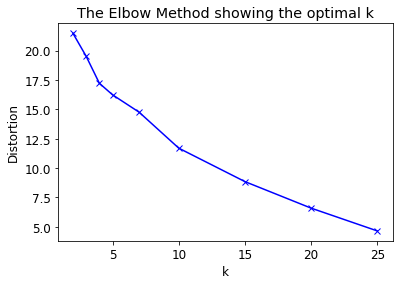

In [192]:
#determine k using elbow method

#k means determine k
distortions = []
K = (2, 3, 4, 5, 7, 10, 15, 20, 25)
for k in K:
    kmeanModel = KMeans(n_clusters=k).fit(X_std)
    kmeanModel.fit(X_std)
    distortions.append(sum(np.min(cdist(X_std, kmeanModel.cluster_centers_, 'euclidean'), axis=1)) / X_std.shape[0])

#Plot the elbow
plt.plot(K, distortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.show()


Again, the elbow appears around k = 4.  

In [193]:
n = 4
kmeans_cluster = KMeans(n_clusters=n, random_state=123)
%timeit kmeans_cluster.fit(X_std)
clusters = kmeans_cluster.predict(X_std)

print('{} Clusters'.format(n))
print('Silhouette Score:  {}'.format(metrics.silhouette_score(X_std, clusters, metric='euclidean')))
print('Calinkski-Harabasz Score:  {}'.format(metrics.calinski_harabasz_score(X_std, clusters)))
print('Davies_Bouldin_Score:  {}'.format(metrics.davies_bouldin_score(X_std, clusters)))

53 ms ± 4.44 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)
4 Clusters
Silhouette Score:  0.2646601101753206
Calinkski-Harabasz Score:  25.363432025536135
Davies_Bouldin_Score:  1.0347177485228547


In [194]:
#print number of members in each cluster for above model
unique, counts = np.unique(clusters, return_counts=True)
print(np.asarray((unique, counts)).T)

[[ 0  6]
 [ 1 21]
 [ 2 17]
 [ 3  2]]


In [195]:
time_start = time.time()
umap_result = umap.UMAP(n_neighbors=10, min_dist=.3, metric='correlation').fit_transform(X_std)

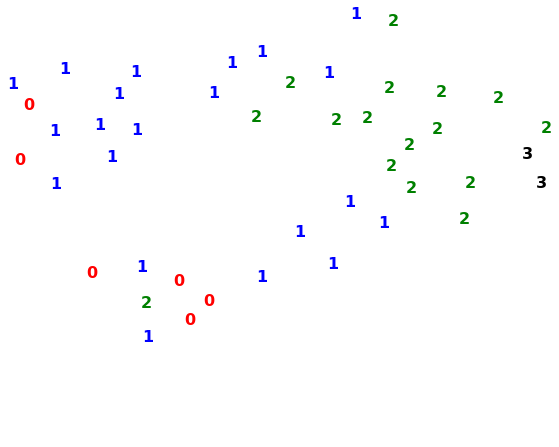

In [196]:
colours = ['r', 'b', 'g', 'k']
plt.figure(figsize=(2, 1))
for i in range (umap_result.shape[0]-1):
  plt.text(umap_result[i,0], umap_result[i,1], str(clusters[i]), 
               color=colours[int(clusters[i])],
               fontdict={'weight':'bold', 'size':16}
               )
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

In [197]:
new_df_before['cluster'] = clusters

In [198]:
cluster_df_before = []
for i in range(1,5):
  cluster_df_before.append('cluster_df_before_'+str(i))

In [199]:
cluster_df_before

['cluster_df_before_1',
 'cluster_df_before_2',
 'cluster_df_before_3',
 'cluster_df_before_4']

In [200]:
for i in range(0,4):
  cluster_df_before[i] = new_df_before.loc[new_df_before['cluster']==i]

In [201]:
#Compare states in clusters from entire dateset and clusters for data taken before stay-at-home orders

cluster_1_states_before = list(cluster_df_before[0].index)
cluster_2_states_before = list(cluster_df_before[1].index)
cluster_3_states_before = list(cluster_df_before[2].index)
cluster_4_states_before = list(cluster_df_before[3].index)

print('Clusters for Adjusted DEX before Stay-at-Home Orders')
print('Cluster 1: {}'.format(cluster_1_states_before))
print('Cluster 2: {}'.format(cluster_2_states_before))
print('Cluster 3: {}'.format(cluster_3_states_before))
print('Cluster 4: {}'.format(cluster_4_states_before))
print('-----------------------------------------------')
print('Clusters from Full Dataset')
print('Cluster 1: {}'.format(cluster_1_states))
print('Cluster 2: {}'.format(cluster_2_states))
print('Cluster 3: {}'.format(cluster_3_states))
print('Cluster 4: {}'.format(cluster_4_states))

Clusters for Adjusted DEX before Stay-at-Home Orders
Cluster 1: ['FL', 'HI', 'NJ', 'NV', 'NY', 'TX']
Cluster 2: ['AL', 'AZ', 'CA', 'CO', 'DC', 'DE', 'GA', 'KY', 'LA', 'MD', 'MO', 'MS', 'MT', 'NC', 'OH', 'OK', 'SC', 'TN', 'UT', 'VA', 'WA']
Cluster 3: ['AK', 'CT', 'ID', 'IL', 'IN', 'KS', 'MA', 'MI', 'MN', 'NH', 'NM', 'OR', 'PA', 'RI', 'WI', 'WV', 'WY']
Cluster 4: ['ME', 'VT']
-----------------------------------------------
Clusters from Full Dataset
Cluster 1: ['AL', 'AR', 'AZ', 'CO', 'DE', 'GA', 'KY', 'LA', 'MD', 'MO', 'MS', 'MT', 'NC', 'OH', 'OK', 'SC', 'TN', 'UT', 'VA']
Cluster 2: ['AK', 'CA', 'CT', 'DC', 'IA', 'ID', 'IL', 'IN', 'KS', 'MA', 'MI', 'MN', 'ND', 'NE', 'NH', 'NM', 'OR', 'PA', 'RI', 'SD', 'WA', 'WI', 'WV', 'WY']
Cluster 3: ['FL', 'HI', 'NJ', 'NV', 'NY', 'TX']
Cluster 4: ['ME', 'VT']


In [202]:
#find states that do not have stay-at-home orders
no_sah_list = df_sah_dates[df_sah_dates['sah_date'].isnull()].index.tolist()

In [203]:
states_wo_sah = []
for x in no_sah_list:
  states_wo_sah.append(df_sah_dates.iloc[x][0])

print('States without Stay-at-Home Orders or Advisories')
print(states_wo_sah)

States without Stay-at-Home Orders or Advisories
['AR', 'IA', 'NE', 'ND', 'SD']


In [204]:
changed_clusters = []

for x in cluster_1_states_before:
   if x not in cluster_1_states:
    changed_clusters.append(x)
for x in cluster_2_states_before:
  if x not in cluster_3_states:
    changed_clusters.append(x)
for x in cluster_3_states_before:
  if x not in cluster_4_states:
    changed_clusters.append(x)
for x in cluster_4_states_before:
  if x not in cluster_2_states:
    changed_clusters.append(x)

In [205]:
changed_clusters

['FL',
 'HI',
 'NJ',
 'NV',
 'NY',
 'TX',
 'AL',
 'AZ',
 'CA',
 'CO',
 'DC',
 'DE',
 'GA',
 'KY',
 'LA',
 'MD',
 'MO',
 'MS',
 'MT',
 'NC',
 'OH',
 'OK',
 'SC',
 'TN',
 'UT',
 'VA',
 'WA',
 'AK',
 'CT',
 'ID',
 'IL',
 'IN',
 'KS',
 'MA',
 'MI',
 'MN',
 'NH',
 'NM',
 'OR',
 'PA',
 'RI',
 'WI',
 'WV',
 'WY',
 'ME',
 'VT']

The clusters between the full dataset and data for only those dates before the stay-at-home order are pretty consistent with only six states changing clusters.This indiciates that most states the exhibit similar aggregate movement or exposure before government advisories or orders were put into effect also share similar movement patterns or trends after stay-at-home orders and advisories are implemented.

## After Stay-at-Home Advisories and Orders

In [206]:
df_after_sah.head(2)

,state,date,dex,num_devices,dex_a,num_devices_a,dex_income_1,num_devices_income_1,dex_income_1_a,num_devices_income_1_a,...,log_dex_education_3_a,log_dex_education_4_a,log_dex_race_asian_a,log_dex_race_black_a,log_dex_race_hispanic_a,log_dex_race_white_a,weighted_avg_dex,Cluster,REGION,sah_date
75,AL,2020-04-04,89.6548,464168,77.4601,537243,86.4218,121622,73.9686,142098,...,4.519072,4.474003,4.499569,4.408967,4.451625,4.425148,1.749021,1,East South Central,2020-04-04
76,AL,2020-04-05,36.8665,456834,31.3487,537243,36.1629,119799,30.4879,142098,...,3.601823,3.491669,3.608713,3.509537,3.530540,3.488701,0.707842,1,East South Central,2020-04-04


In [207]:
new_df_after = df_after_sah[['state', 'date','log_dex_a', 'log_dex_income_1_a', 'log_dex_income_2_a',	'log_dex_income_3_a',	'log_dex_income_4_a',	'log_dex_education_1_a',	'log_dex_education_2_a',	'log_dex_education_3_a',	'log_dex_education_4_a',	'log_dex_race_asian_a',	'log_dex_race_black_a',	'log_dex_race_hispanic_a',	'log_dex_race_white_a']]
new_df_after.head()

,state,date,log_dex_a,log_dex_income_1_a,log_dex_income_2_a,log_dex_income_3_a,log_dex_income_4_a,log_dex_education_1_a,log_dex_education_2_a,log_dex_education_3_a,log_dex_education_4_a,log_dex_race_asian_a,log_dex_race_black_a,log_dex_race_hispanic_a,log_dex_race_white_a
75,AL,2020-04-04,4.349763,4.303641,4.413522,4.539673,4.523916,4.317853,4.434959,4.519072,4.474003,4.499569,4.408967,4.451625,4.425148
76,AL,2020-04-05,3.445173,3.417330,3.490185,3.602144,3.513436,3.416444,3.505011,3.601823,3.491669,3.608713,3.509537,3.530540,3.488701
77,AL,2020-04-06,3.760104,3.745040,3.818672,3.927310,3.803205,3.771454,3.830943,3.898668,3.782686,3.855112,3.815442,3.837077,3.818659
78,AL,2020-04-07,3.799237,3.751772,3.860961,3.964617,3.900288,3.778951,3.870002,3.943433,3.861138,3.924714,3.832828,3.875104,3.860235
79,AL,2020-04-08,3.872167,3.813773,3.938318,4.037808,3.967696,3.855493,3.946564,4.013856,3.913426,3.965577,3.910952,3.942052,3.930313


In [208]:
new_df_after = new_df_after.pivot(index='state', columns='date')
new_df_after.head()

log_dex_a                                                         \
date  2020-03-19 2020-03-20 2020-03-21 2020-03-22 2020-03-23 2020-03-24   
state                                                                     
AK           NaN        NaN        NaN        NaN        NaN        NaN   
AL           NaN        NaN        NaN        NaN        NaN        NaN   
AZ           NaN        NaN        NaN        NaN        NaN        NaN   
CA      3.438159   3.812589   3.383549   2.944997   3.008915   3.534854   
CO           NaN        NaN        NaN        NaN        NaN        NaN   

                                                   ... log_dex_race_white_a  \
date  2020-03-25 2020-03-26 2020-03-27 2020-03-28  ...           2020-04-15   
state                                              ...                        
AK           NaN        NaN        NaN   3.847416  ...             3.062755   
AL           NaN        NaN        NaN        NaN  ...             4.107539   
AZ           NaN        NaN        NaN        NaN  ...             3.341854   
CA      3.510793   2.994186   3.118445   3.693855  ...             2.641946   
CO           NaN   3.243549   3.461304   3.855522  ...             3.098266   

                                                                         \
date  2020-04-16 2020-04-17 2020-04-18 2020-04-19 2020-04-20 2020-04-21   
state                                                                     
AK      2.952913   3.072207   3.637983   3.414295   3.288059   3.370697   
AL      4.079292   4.318069   4.503027   3.710240   4.234419   4.284809   
AZ      3.310061   3.509696   4.161955   3.927252   3.607056   3.708393   
CA      2.628357   2.795731   3.358433   3.191394   2.860102   2.989956   
CO      2.646175   3.256206   3.653226   3.540922   3.418281   3.501685   

                                        
date  2020-04-22 2020-04-23 2020-04-24  
state                                   
AK      3.312719   3.291673   3.521853  
AL      4.283741   4.105482   4.640643  
AZ      3.698847   3.733975   3.965262  
CA      2.998324   3.014480   3.229230  
CO      3.476518   3.517468   3.799192  

[5 rows x 481 columns]

In [209]:
#Because not all states have the same date for enacting the stay at home order, there are nulls after the table is pivoted for the state to be the index.  
#I filled the missing data with the average
new_df_after.isnull().sum().sum()
new_df_after = new_df_before.apply(lambda x: x.fillna(x.mean()),axis=0)

In [210]:
new_df_after.isnull().sum().sum()

0

In [211]:
X_std = scaler.fit_transform(new_df_after)

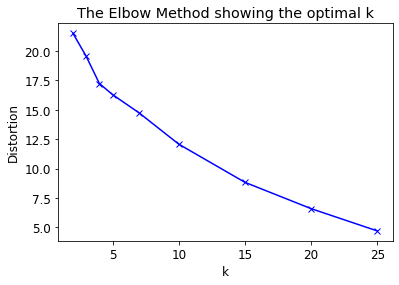

In [212]:
#determine k using elbow method

#k means determine k
distortions = []
K = (2, 3, 4, 5, 7, 10, 15, 20, 25)
for k in K:
    kmeanModel = KMeans(n_clusters=k).fit(X_std)
    kmeanModel.fit(X_std)
    distortions.append(sum(np.min(cdist(X_std, kmeanModel.cluster_centers_, 'euclidean'), axis=1)) / X_std.shape[0])

#Plot the elbow
plt.plot(K, distortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.show()


Again, the elbow appears around k = 4.  

In [213]:
n = 4
kmeans_cluster = KMeans(n_clusters=n, random_state=123)
%timeit kmeans_cluster.fit(X_std)
clusters = kmeans_cluster.predict(X_std)

print('{} Clusters'.format(n))
print('Silhouette Score:  {}'.format(metrics.silhouette_score(X_std, clusters, metric='euclidean')))
print('Calinkski-Harabasz Score:  {}'.format(metrics.calinski_harabasz_score(X_std, clusters)))
print('Davies_Bouldin_Score:  {}'.format(metrics.davies_bouldin_score(X_std, clusters)))

60 ms ± 7.41 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)
4 Clusters
Silhouette Score:  0.2653484431443007
Calinkski-Harabasz Score:  25.402756133453757
Davies_Bouldin_Score:  1.0337470362475305


In [214]:
#print number of members in each cluster for above model
unique, counts = np.unique(clusters, return_counts=True)
print(np.asarray((unique, counts)).T)

[[ 0  6]
 [ 1 21]
 [ 2 17]
 [ 3  2]]


In [215]:
time_start = time.time()
umap_result = umap.UMAP(n_neighbors=10, min_dist=.3, metric='correlation').fit_transform(X_std)

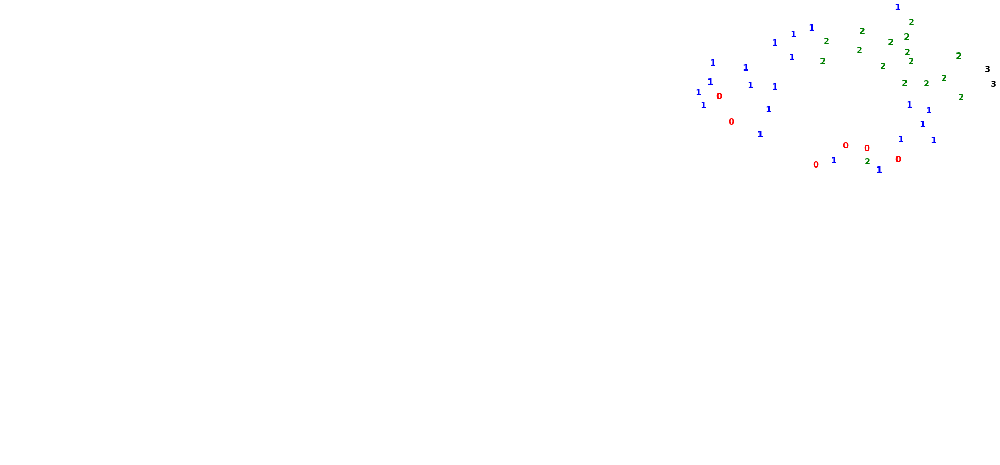

In [216]:
colours = ['r', 'b', 'g', 'k']
plt.figure(figsize=(2, 1))
for i in range (umap_result.shape[0]-1):
  plt.text(umap_result[i,0], umap_result[i,1], str(clusters[i]), 
               color=colours[int(clusters[i])],
               fontdict={'weight':'bold', 'size':16}
               )
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

In [217]:
new_df_after['cluster'] = clusters

In [218]:
cluster_df_after = []
for i in range(0,4):
  cluster_df_after.append('cluster_df_after_'+str(i))

In [219]:
for i in range(0,4):
  cluster_df_after[i] = new_df_after.loc[new_df_after['cluster']==i]

In [220]:
#compare states in all clusters from data before and after stay-at-home orders and advisories and from the full dataset.

cluster_1_states_after = list(cluster_df_after[0].index)
cluster_2_states_after = list(cluster_df_after[1].index)
cluster_3_states_after = list(cluster_df_after[2].index)
cluster_4_states_after = list(cluster_df_after[3].index)


print('Clusters for Adjusted DEX before Stay-at-Home Orders')
print('Cluster 1: {}'.format(cluster_1_states_before))
print('Cluster 2: {}'.format(cluster_2_states_before))
print('Cluster 3: {}'.format(cluster_3_states_before))
print('Cluster 4: {}'.format(cluster_4_states_before))
print('-----------------------------')
print('Clusters for Adjusted DEX after Stay-at-Home Orders')
print('Cluster 1: {}'.format(cluster_1_states_after))
print('Cluster 2: {}'.format(cluster_2_states_after))
print('Cluster 3: {}'.format(cluster_3_states_after))
print('Cluster 4: {}'.format(cluster_4_states_after))
print('-----------------------------')
print('Clusters from Full Dataset')
print('Cluster 1: {}'.format(cluster_1_states))
print('Cluster 2: {}'.format(cluster_2_states))
print('Cluster 3: {}'.format(cluster_3_states))
print('Cluster 4: {}'.format(cluster_4_states))

Clusters for Adjusted DEX before Stay-at-Home Orders
Cluster 1: ['FL', 'HI', 'NJ', 'NV', 'NY', 'TX']
Cluster 2: ['AL', 'AZ', 'CA', 'CO', 'DC', 'DE', 'GA', 'KY', 'LA', 'MD', 'MO', 'MS', 'MT', 'NC', 'OH', 'OK', 'SC', 'TN', 'UT', 'VA', 'WA']
Cluster 3: ['AK', 'CT', 'ID', 'IL', 'IN', 'KS', 'MA', 'MI', 'MN', 'NH', 'NM', 'OR', 'PA', 'RI', 'WI', 'WV', 'WY']
Cluster 4: ['ME', 'VT']
-----------------------------
Clusters for Adjusted DEX after Stay-at-Home Orders
Cluster 1: ['FL', 'HI', 'NJ', 'NV', 'NY', 'TX']
Cluster 2: ['AL', 'AZ', 'CA', 'CO', 'DC', 'DE', 'GA', 'KY', 'LA', 'MD', 'MO', 'MS', 'MT', 'NC', 'OH', 'OK', 'SC', 'TN', 'UT', 'VA', 'WA']
Cluster 3: ['AK', 'CT', 'ID', 'IL', 'IN', 'KS', 'MA', 'MI', 'MN', 'NH', 'NM', 'OR', 'PA', 'RI', 'WI', 'WV', 'WY']
Cluster 4: ['ME', 'VT']
-----------------------------
Clusters from Full Dataset
Cluster 1: ['AL', 'AR', 'AZ', 'CO', 'DE', 'GA', 'KY', 'LA', 'MD', 'MO', 'MS', 'MT', 'NC', 'OH', 'OK', 'SC', 'TN', 'UT', 'VA']
Cluster 2: ['AK', 'CA', 'CT', 'DC'

# State Cluster Assignments

| Before Stay-at-Home Orders | After Stay-at-Home-Orders | Full Dataset |
| :-: | :-:| :-:|
| ME, VT | ME, VT | ME, VT |
|FL, HI, NJ, NV, NY, TX | FL, HI, NJ, NV, NY, TX | FL, HI, NJ, NV, NY, TX |
|AL, AZ, CA, CO, DC, DE, GA, KY, LA, MD, MO, MS, MT, NC, OH, OK, SC, TN, UT, VA, WA | AL, AZ, CA, CO, DC, DE, GA, KY, LA, MD, MO, MS, MT, NC, OH, OK, SC, TN, UT, VA, WA | AL, AR, AZ, CO, DE, GA, KY, LA, MD, MO, MS, MT, NC, OH, OK, SC, TN, UT, VA|
|AK, CT, ID, IL, IN, KS, MA, MI, MN, NH, NM, OR, PA, RI, WI, WV, WY | AK, CT, ID, IL, IN, KS, MA, MI, MN, NH, NM, OR, PA, RI, WI, WV, WY | AK, CA, CT, DC, IA, ID, IL, IN, KS, MA, MI, MN, ND, NE, NH, NM, OR, PA, RI, SD, WA, WI, WV, WY |


In [221]:
changed_clusters1 = []

for x in cluster_1_states_before:
   if x not in cluster_1_states_after:
    changed_clusters1.append(x)
for x in cluster_2_states_before:
  if x not in cluster_2_states_after:
    changed_clusters1.append(x)
for x in cluster_3_states_before:
  if x not in cluster_3_states_after:
    changed_clusters1.append(x)
for x in cluster_4_states_before:
  if x not in cluster_4_states_after:
    changed_clusters1.append(x)

changed_clusters1

[]

# Conclusion

Both k-means clustering and hierarchical clustering produced similar results but rather low Silhouette Scores of 0.34 at the highest, and DBSCAN was not able to find meaningful clusters based on the provided dataset.  As the current dataset spans less than three months; I believe that a larger dataset, spanning a full calendar year, may result in a more robust model and denser clusters.  Removing some of the cyclical patterns found in the data, especially those surrounding patterns related to movement on weekends versus weekdays, may also improve the ability to group the data into distinct clusters by removing noise related to time related movements.

From the clusters that were found through k-means clustering, none of the states changed between the data taken before and after the implementation of shelter-in-place orders or advisories.  This indicates that states who exhibit similar trends in the measured device exposure index before the national COVID-19 crisis, also normally exhibit similar behavior regarding movement after shelter-in-place orders are established.  

The clusters created in this project group states together by Smartphone movement among commercial areas before and after the COVID crisis, providing insight into the effectiveness of policies aimed at reducing viral exposure.  The groupings created from this data also provide insight into the everyday aggregate movement of people among commercial spaces, which is valuable in both government and the private sector.

  

K-Means and Hierarchical Clustering Performed Best

None of the states changed between the data taken before and after the implementation of shelter-in-place orders or advisories

# Suggestions for Improvement

Larger Dataset

Removal of cyclical patterns